**<h1 align="center">Data Mining Project</h1>**

**Group members:**<br> 
Chloé Deschanel - 20240693 <br>
Diogo Carvalho - 20240694 <br>
Ingrid Lopez - 20240692 <br>
Ruben Marques- 20240352

# Table of Contents
* [1. Data Exploration](#chapter1)
    * [1.1. Imports](#sub-section-1_1)
    * [1.2. Loading Data](#sub-section-1_2)
    * [1.3. Initial Analysis](#sub-section-1_3)
        * [1.3.1. Types](#sub-section-1_3_1)
        * [1.3.2. Duplicates](#sub-section-1_3_2)
        * [1.3.3. Missing Values](#sub-section-1_3_3)
        * [1.3.4. Data Statistics](#sub-section-1_3_4)
    * [1.4. Individual Variable Analysis](#sub-section-1_4)
        * [1.4.1. Numerical Variables](#sub-section-1_4_1)
            * [1.4.1.1. Overview](#sub-section-1_4_1_1)
            * [1.4.1.2. customer_age](#sub-section-1_4_1_2)
            * [1.4.1.3. vendor_count](#sub-section-1_4_1_3)
            * [1.4.1.4. product_count](#sub-section-1_4_1_4)
            * [1.4.1.5. is_chain](#sub-section-1_4_1_5)
            * [1.4.1.6. first_order & last_order](#sub-section-1_4_1_6)
            * [1.4.1.7. CUI_American to CUI_Thai](#sub-section-1_4_1_7)
            * [1.4.1.8. DOW_0 to DOW_6](#sub-section-1_4_1_8)
            * [1.4.1.9. HR_0 to HR_1](#sub-section-1_4_1_9)
        * [1.4.2. Categorical Variables](#sub-section-1_4_2)
            * [1.4.2.1. customer_region](#sub-section-1_4_2_1)
            * [1.4.2.2. last_promo](#sub-section-1_4_2_2)
            * [1.4.2.3. payment_method](#sub-section-1_4_2_3)
    * [1.5. Multivariate Analysis](#sub-section-1_5)     
        * [1.5.1. payment_method & product_count](#sub-section-1_5_1) 
        * [1.5.2. city & last_promo/ payment_method](#sub-section-1_5_2)
        * [1.5.3. vendor_diversity & customer_age/ product_count](#sub-section-1_5_3)
        * [1.5.4. top_cuisine & city](#sub-section-1_5_4)
        * [1.5.5. Spending Habits and Order Behavior](#sub-section-1_5_5)
        * [1.5.6. Promotion Usage and Spending Patterns](#sub-section-1_5_6)
        * [1.5.7. Payment Method Preferences by Spending and Promotion Usage](#sub-section-1_5_7)
        * [1.5.9. Week period and time of day](#sub-section-1_5_9)
        * [1.5.10. Spending habits in cities & in top cuisines](#sub-section-1_5_10)
* [2. Data Preprocessing](#chapter2)
    * [2.1. Coherence Fix](#sub-section-2_1)
    * [2.2. Feature Engeneering](#sub-section-2_2)
        * [2.2.1. Features from EDA](#sub-section-2_2_1)
        * [2.2.2. Creating New Features](#sub-section-2_2_2)
        * [2.2.3. Visually Exploring Newly Created Features](#sub-section-2_2_3)
        * [2.2.4. Dropping Variables](#sub-section-2_2_4)
    * [2.3. Missing Values](#sub-section-2_3)
        * [2.3.1. customer_age](#sub-section-2_3_1)
        * [2.3.2. first_order](#sub-section-2_3_2)
        * [2.3.3. active_period](#sub-section-2_3_3)
        * [2.3.4. order_frequency](#sub-section-2_3_4)
    * [2.4. Outliers](#sub-section-2_4)
        * [2.4.1. IQR Method](#sub-section-2_4_1)
        * [2.4.2. Manual Threshold](#sub-section-2_4_2)
        * [2.4.3. Clipping Outliers](#sub-section-2_4_3)
    * [2.5. Data Normalization](#sub-section-2_5)
        * [2.5.1. MinMax Scaling](#sub-section-2_5_1)
        * [2.5.2. Standard Scaling](#sub-section-2_5_2)
        * [2.5.3. Comparing MinMax and Standard Scaling](#sub-section-2_5_3)
* [3. Segmentation](#chapter3)
    * [3.1. RFM Value Segmentation](#sub-section-3_1)

Feedback 
- Introduction of the report itself and what is expected (use academic research)
    - Emphasis on clustering (not segmentation)
- Conclusion - include insights (1 or 2)
- age & orders in the week... explore more in depth relationships
- is_chain - anomaly
- Explore new features created: outliers, normally distributed, insights, anomalies, missing values?
    - point of the new features & perform EDA on them
    - what are we trying to find?
    - aggregations, ratios,...
- Heatmaps - use divergent palettes
- Boxplots - ensure use different scales if features have different units

intro 
- write last
- what is the objective? data exploration, optionally: EDA is motivated by clustering/ segmentation as the next phase
- what did the project achieve? 1 or 2 key insights

Initial analysis
- statistical analysis
- supported by visualisations
- check results of df.describe()
    - any interesting statistics that stand out?
    - check both number and non numeric features

Anomalies
- missing values: missing completely at random?
- inconsistent values: posiible reasons/ explanations?
- duplicates: are these likely duplicated records or valid?
- are there pattrens to the anomalies?
- outliers: are these liekly to be extreme values? or data entry errors?
- are the quantities something to be concerned about? if drop all anomilies, how much data will be lost?

Relationships, patterns & trends 
- supported by vusualisations

- correlation

- any interesting sub-populations

    - geographic regions: do ther have different behaviours?
    - what about age groyps?
- Draw 

Feature engineering
- aggregations (CUI, HR, DW)
- ratios (MNT/ X)
- proportions (% spent on weekdays)
- analysis of new features

Conclusion 
- 1 or 2 key insights
- connect to next phase (segmentation)
    - any features

<a class="anchor" id="chapter1"></a>

# 1. Data Exploration

</a>

<a class="anchor" id="sub-section-1_1"></a>

## 1.1. Imports

</a>

In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from os.path import join

# Pre-processing
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Radar Chart
from math import pi

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

from minisom import MiniSom


# For better resolution plots
%config InlineBackend.figure_format = 'retina'

In [2]:
## Import Matplotlib functions to create MiniSOM visualizations

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.colors import LinearSegmentedColormap

from matplotlib.lines import Line2D
import seaborn as sns

from matplotlib import __version__ as mplver

<a class="anchor" id="sub-section-1_2"></a>

## 1.2. Loading Data

</a>

In [3]:
customers = pd.read_csv("../Data/DM2425_ABCDEats_DATASET.csv")

In [4]:
# Display all columns
pd.set_option('display.max_columns', None)
customers.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


| #   | Column Name        | Description                                                                                       |
|:----|:-------------------|:--------------------------------------------------------------------------------------------------|
| 1   | customer_id        | Unique identifier for each customer.                                                             |
| 2   | customer_region    | Geographic region where the customer is located.                                                 |
| 3   | customer_age       | Age of the customer.                                                                             |
| 4   | vendor_count       | Number of unique vendors the customer has ordered from.                                          |
| 5   | product_count      | Total number of products the customer has ordered.                                               |
| 6   | is_chain           | Indicates whether the customer’s order was from a chain restaurant.                              |
| 7   | first_order        | Number of days from the start of the dataset when the customer first placed an order.            |
| 8   | last_order         | Number of days from the start of the dataset when the customer most recently placed an order.     |
| 9   | last_promo         | The category of the promotion or discount most recently used by the customer.                    |
| 10  | payment_method     | Method most recently used by the customer to pay for their orders.                               |
| 11  | CUI_American, etc. | The amount in monetary units spent by the customer from the indicated type of cuisine.           |
| 12  | DOW_0 to DOW_6     | Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).                       |
| 13  | HR_0 to HR_23      | Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).                  |

In [5]:
# Set customer_id as the index
customers.set_index('customer_id', inplace = True)
customers.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<a class="anchor" id="sub-section-1_3">

## 1.3. Initial Analysis
    
</a>

<a class="anchor" id="sub-section-1_3_1">

### 1.3.1. Types
    
</a>

In [6]:
customers.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 31888 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           31888 non-null  object 
 1   customer_age              31161 non-null  float64
 2   vendor_count              31888 non-null  int64  
 3   product_count             31888 non-null  int64  
 4   is_chain                  31888 non-null  int64  
 5   first_order               31782 non-null  float64
 6   last_order                31888 non-null  int64  
 7   last_promo                31888 non-null  object 
 8   payment_method            31888 non-null  object 
 9   CUI_American              31888 non-null  float64
 10  CUI_Asian                 31888 non-null  float64
 11  CUI_Beverages             31888 non-null  float64
 12  CUI_Cafe                  31888 non-null  float64
 13  CUI_Chicken Dishes        31888 non-null  float64
 1

<a class="anchor" id="sub-section-1_3_2">

### 1.3.2. Duplicates
    
</a>

In [7]:
# Check for duplicate customer_id
customers[customers.index.duplicated() == True]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6bbf5f74cd,8550,22.0,10,20,9,48.0,88,-,CARD,62.17,64.37,44.87,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.18,0.0,0.0,0.00,0.0,1,2,1,5,0,5,2,0.0,0,0,5,1,1,2,3,2,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0
8aa9bbc147,8550,24.0,2,4,2,53.0,59,DELIVERY,DIGI,0.00,18.80,30.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,1,1,0,0,0,0.0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
cf563a0a98,8550,27.0,2,2,0,61.0,62,FREEBIE,CASH,0.00,25.41,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,0,0,1,1,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
201a13a34d,8550,28.0,2,2,1,62.0,62,DELIVERY,CARD,17.71,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,0,0,0,2,0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [8]:
# Check how many duplicates customer_id's have
duplicates = customers.index.value_counts()
duplicate_count = duplicates[duplicates > 1]

print(f"Duplicate customer IDs and their counts:\n{duplicate_count}")

Duplicate customer IDs and their counts:
customer_id
742ca068fc    2
b55012ee1c    2
df91183978    2
6bbf5f74cd    2
24251eb7da    2
201a13a34d    2
b8e7a643a4    2
cc08ef25ce    2
8aa9bbc147    2
671bf0c738    2
06018a56be    2
fac7984c0d    2
cf563a0a98    2
Name: count, dtype: int64


In [9]:
# Remove the 13 customer_id duplicates and keep the 1st instance
customers = customers[~customers.index.duplicated(keep = 'first')]

<a class="anchor" id="sub-section-1_3_3">

### 1.3.2. Missing Values
    
</a>

In [10]:
# Check the number of missing values
customers.isna().sum()

customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5                          0
DOW_6     

<a class="anchor" id="sub-section-1_3_4">

### 1.3.4. Data Statistics 
    
</a>

In [11]:
# Seperate numerical and categorical data
customers_num = customers.select_dtypes(exclude = object)
customers_cat = customers.select_dtypes(include = object)

In [12]:
# Summary statistics of numerical data
customers_num.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
customer_age,31148.0,27.51,7.16,15.0,23.0,26.0,31.00,80.00
vendor_count,31875.0,3.10,2.77,0.0,1.0,2.0,4.00,41.00
product_count,31875.0,5.67,6.96,0.0,2.0,3.0,7.00,269.00
is_chain,31875.0,2.82,3.98,0.0,1.0,2.0,3.00,83.00
first_order,31769.0,28.47,24.10,0.0,7.0,22.0,45.00,90.00
last_order,31875.0,63.67,23.23,0.0,49.0,70.0,83.00,90.00
CUI_American,31875.0,4.88,11.65,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31875.0,9.96,23.56,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31875.0,2.30,8.48,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31875.0,0.80,6.43,0.0,0.0,0.0,0.00,326.10


In [13]:
# Summary statistics of categorical data
customers_cat.describe().T

,count,unique,top,freq
customer_region,31875,9,8670,9761
last_promo,31875,4,-,16744
payment_method,31875,3,CARD,20153


The initial analysis provides insights into the structure of the data set and key characteristics. 
- Most variables are numerical, either int64 or float64.
- There are 13 duplicates in customer_id. These duplicates have been deleted.
- Only 3 variables contain missing values: customer_age, is_chain, and HR_0.

<a class="anchor" id="sub-section-1_4">

## 1.4. Individual Variable Analysis
    
</a>

In [14]:
# Create a copy of original data frame to visually explore, without modifying the original
customers_eda = customers.copy()

<a class="anchor" id="sub-section-1_4_1">

### 1.4.1. Numerical Variables
    
</a>

<a class="anchor" id="sub-section-1_4_1_1">

#### 1.4.1.1. Overview
    
</a>

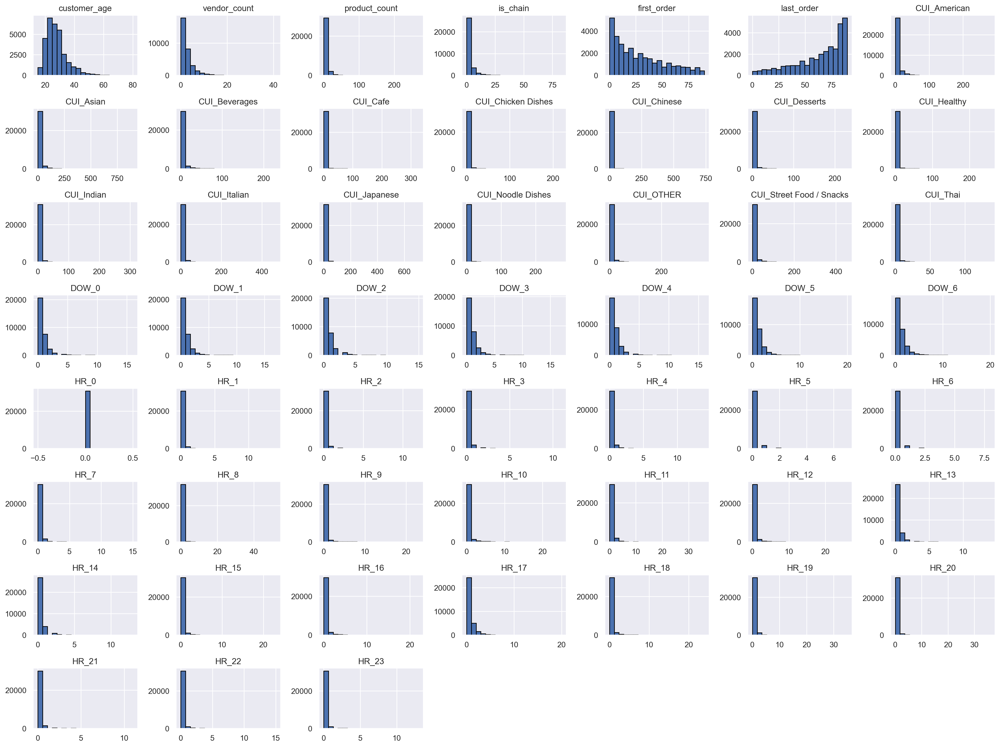

In [15]:
# Select numeric columns from the dataset
numeric_columns = customers_eda.select_dtypes(include=["float64", "int64"]).columns

# Plot histograms for all numeric columns
sns.set()
customers_eda[numeric_columns].hist(bins=20, figsize=(20, 15), edgecolor="black")
plt.tight_layout()
plt.show()

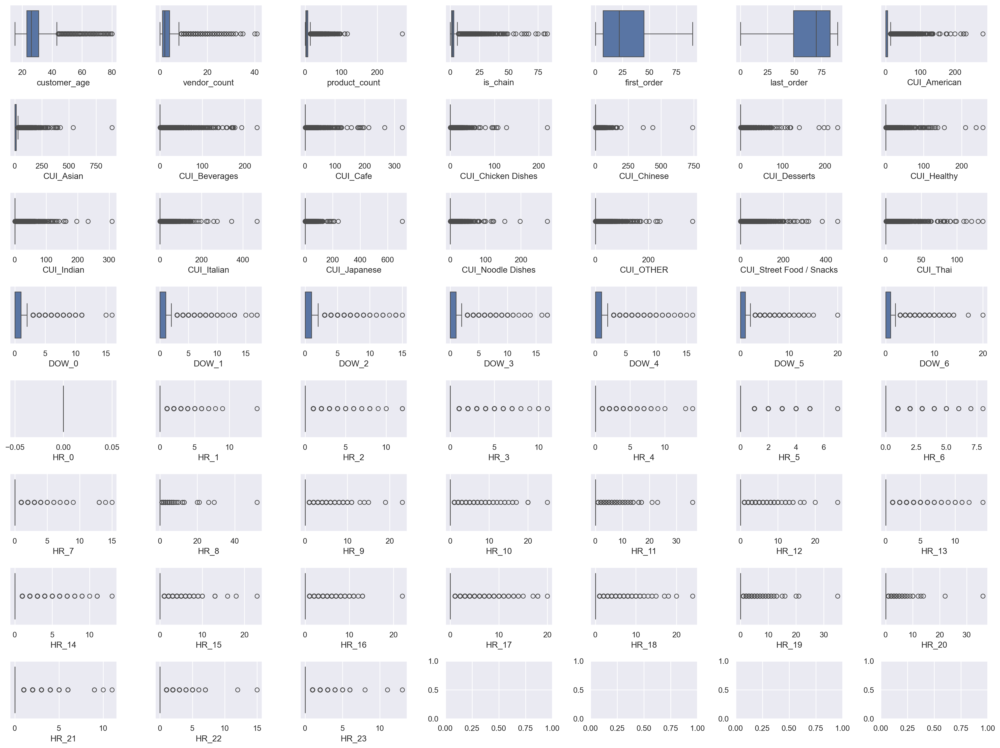

In [16]:
# Plot box plots for all numeric columns

sns.set()
fig, axes = plt.subplots(8, 7, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), numeric_columns): 
    sns.boxplot(x=customers_eda[feat], ax=ax)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_1_2">

#### 1.4.1.2. customer_age
    
</a>

In [17]:
age_median = round(customers_eda["customer_age"].median(), 2)
age_mean = round(customers_eda["customer_age"].mean(), 2)
print(f"The customer_age mean ({age_mean}) and median ({age_median}) "
      f"indicate that clients are generally in their mid-20s.")
print(f"The oldest customer is {customers_eda['customer_age'].max()} years old, "
      f"and the youngest is {customers_eda['customer_age'].min()} years old.")

The customer_age mean (27.51) and median (26.0) indicate that clients are generally in their mid-20s.
The oldest customer is 80.0 years old, and the youngest is 15.0 years old.


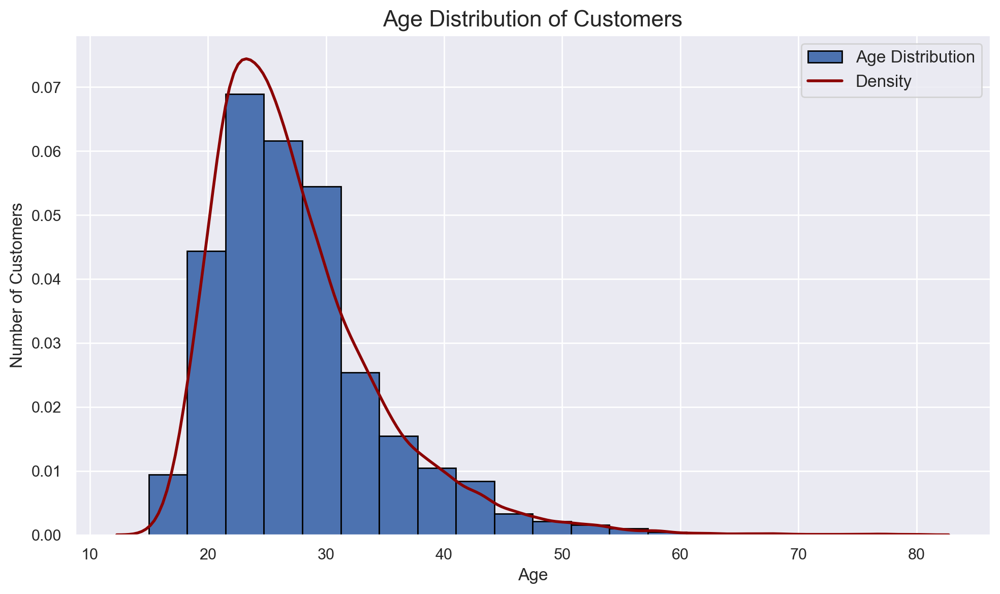

In [18]:
# Plot the histogram & density for customer_age
sns.set()
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["customer_age"], bins=20, edgecolor="black", density=True, label="Age Distribution")
sns.kdeplot(customers_eda["customer_age"], color="darkred", label="Density", linewidth=2)

plt.title("Age Distribution of Customers", fontsize=16)
plt.xlabel("Age", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()  
plt.show()

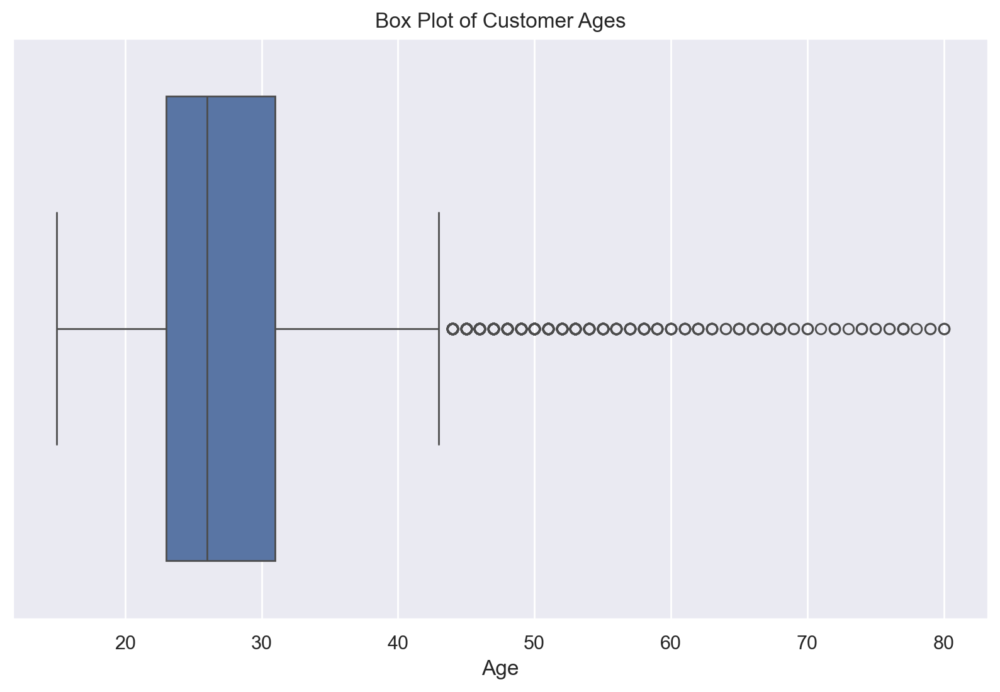

In [19]:
plt.figure(figsize=(10, 6))

sns.boxplot(x=customers_eda['customer_age'])
plt.title("Box Plot of Customer Ages")
plt.xlabel("Age")
plt.show()

To get a clearer understanding of the age distribution, age groups can be created by categorizing into bins:
- Teenagers: 15–19 
- Young Adults: 20–29 
- Adults: 30–39 
- Middle-Aged: 40–49 
- Older Adults: 50–59 
- Seniors: 60+ 

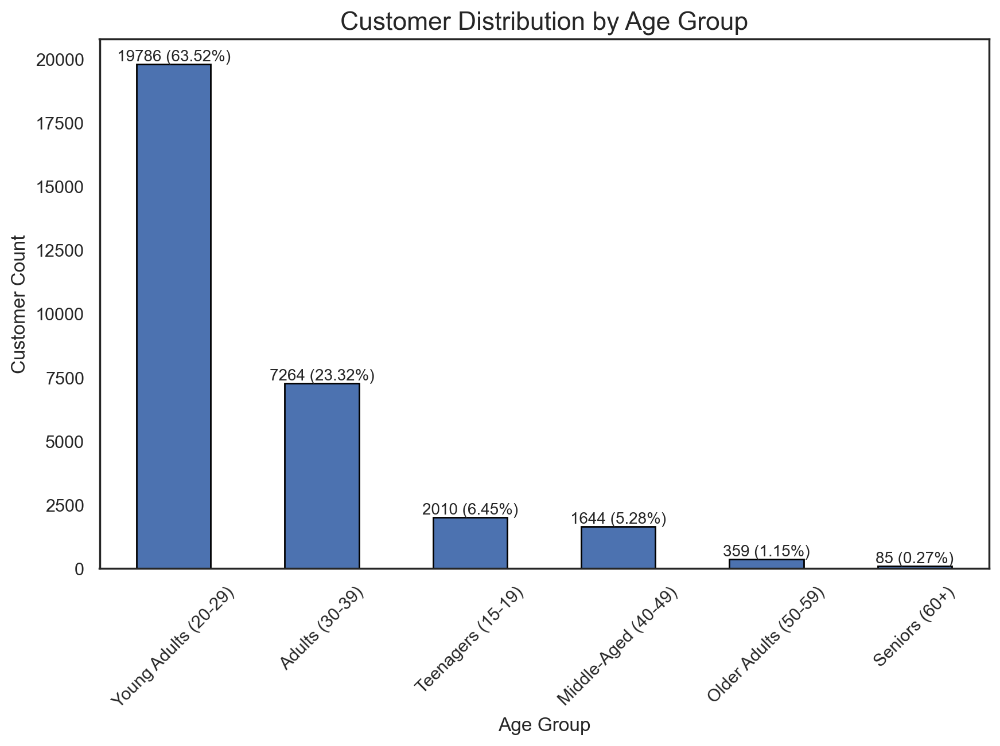

In [20]:
# Define age ranges and their respective labels
age_bins = [14, 19, 29, 39, 49, 59, 100]
age_labels = ["Teenagers (15-19)", "Young Adults (20-29)", "Adults (30-39)", 
              "Middle-Aged (40-49)", "Older Adults (50-59)", "Seniors (60+)"]

# .cut() segments into the bins (age_bins) and assigns to corresponding labels (age_labels)
customers_eda["age_group"] = pd.cut(customers_eda["customer_age"], bins=age_bins, labels=age_labels)
age_group_counts = customers_eda["age_group"].value_counts()
age_group_percent = customers_eda["age_group"].value_counts(normalize=True) * 100

sns.set_style("white")
plt.figure(figsize=(10, 6))

age_group_counts.plot(kind="bar", edgecolor="black")

# Add the count & percentage at the top of each bar 
for index, (count, percent) in enumerate(zip(age_group_counts, age_group_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customer Distribution by Age Group", fontsize=16)
plt.xlabel("Age Group", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

<a class="anchor" id="sub-section-1_4_1_3">

#### 1.4.1.3. vendor_count
    
</a>

In [21]:
vendor_count_median = round(customers_eda["vendor_count"].median(), 2)
vendor_count_mean = round(customers_eda["vendor_count"].mean(), 2)
print(f"The vendor_count mean ({vendor_count_mean}) and median ({vendor_count_median}) "
      f"indicate that clients generally tend to order from a small amount of vendors.")
print(f"The vendor count ranges from a minimum of {customers_eda['vendor_count'].min()} "
      f"to a maximum of {customers_eda['vendor_count'].max()}.")

The vendor_count mean (3.1) and median (2.0) indicate that clients generally tend to order from a small amount of vendors.
The vendor count ranges from a minimum of 0 to a maximum of 41.


In [22]:
print(f"There are {len(customers_eda[customers_eda['vendor_count']==0])} rows with 0 vendor count, "
      f"which could indicate an error.")

There are 138 rows with 0 vendor count, which could indicate an error.


In [23]:
# These customers seem to just have default information from account creation 
# They can be targeted to make their first transaction
customers_eda[(customers_eda['vendor_count'] == 0) & (customers_eda['product_count'] == 0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39)
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39)
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)


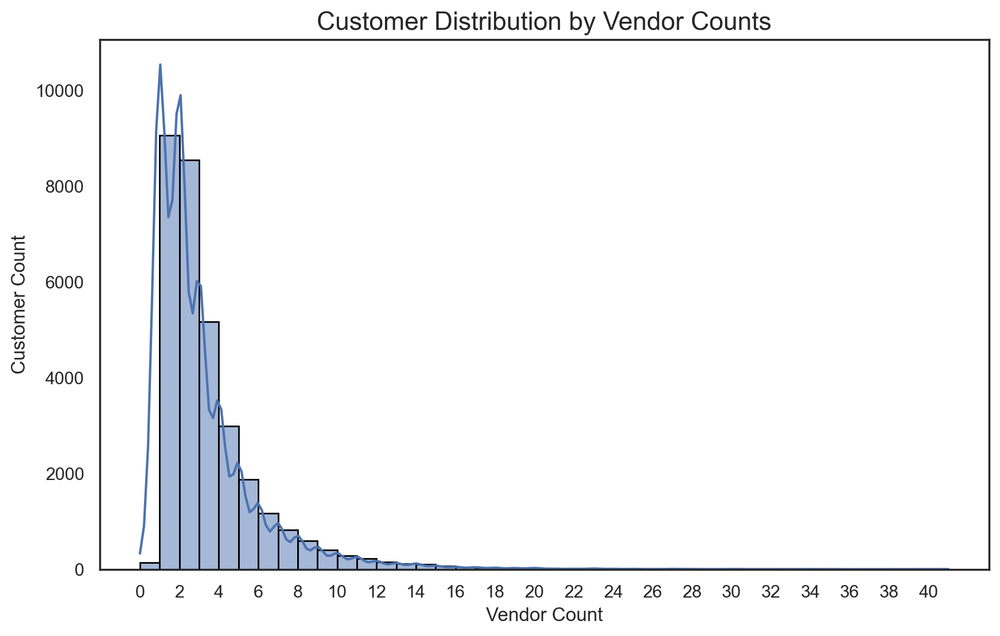

In [24]:
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Set kde to True to get the Kernel Density Estimate
# This shows the underlying distribution of the data
sns.histplot(customers_eda["vendor_count"], bins=41, kde=True, edgecolor="black")

plt.title("Customer Distribution by Vendor Counts", fontsize=16)
plt.xlabel("Vendor Count", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# create an array of tick positions starting from 0 to the max value of "vendor_count with intervals  of 2
tick_positions = np.arange(0, customers_eda["vendor_count"].max() + 1, 2)
plt.xticks(tick_positions)

plt.show()

As previously mentioned, customers have low vendor counts, with a large peak around 1-3 vendors. This could suggest that customers exhibit brand loyalty or preference for specific vendors. Additionally, a small group of customers order from a larger variety of vendors, suggesting a preference for exploration or diverse tastes. 

Thus, it possible to categorise customers based on their vendor count:
- No Diversity: 0 vendors
- Low Diversity: 1–2 vendors
- Moderate Diversity: 3–5 vendors
- High Diversity: 6 or more vendors

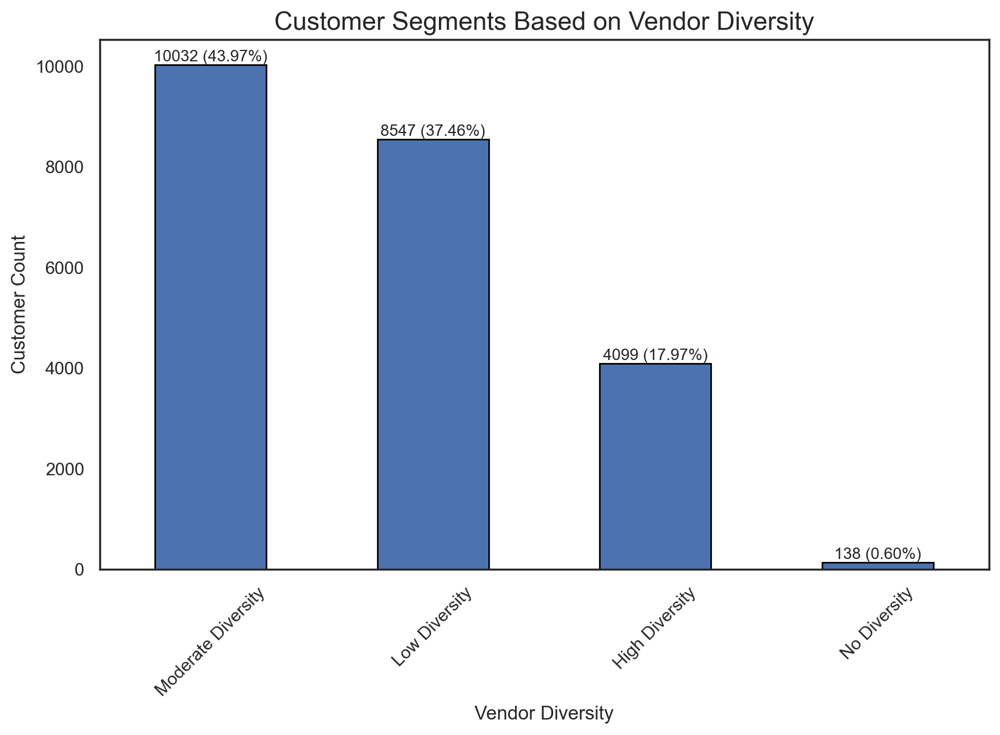

In [25]:
# Default all rows to No Diversity
customers_eda["vendor_diversity"] = "No Diversity"  # Default all to No Diversity

# pd.cut() segments into the bins (vendor_bins) and assigns to corresponding labels (vendor_labels)
# only apply for vendor_count > 0
mask = customers_eda["vendor_count"] > 0
vendor_bins = [1, 2, 5, customers_eda["vendor_count"].max() + 1] # +1 to include the last value
vendor_labels = ["Low Diversity", "Moderate Diversity", "High Diversity"]

customers_eda.loc[mask, "vendor_diversity"] = pd.cut(customers_eda.loc[mask, "vendor_count"], bins=vendor_bins, labels=vendor_labels)
diversity_counts = customers_eda["vendor_diversity"].value_counts()
diversity_percent = customers_eda["vendor_diversity"].value_counts(normalize=True) * 100

sns.set_style("white")
plt.figure(figsize=(10, 6))
diversity_counts.plot(kind="bar", edgecolor="black")

# Add the count & percentage at the top of each bar 
for index, (count, percent) in enumerate(zip(diversity_counts, diversity_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customer Segments Based on Vendor Diversity", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)

plt.show()

<a class="anchor" id="sub-section-1_4_1_4">

#### 1.4.1.4. product_count
    
</a>

In [26]:
product_count_median = round(customers_eda["product_count"].median(), 2)
product_count_mean = round(customers_eda["product_count"].mean(), 2)
print(f"The product_count mean ({product_count_mean}) and median ({product_count_median}) "
      f"indicate that clients generally tend to purchase a modest number of products.")
print(f"The product count ranges from a minimum of {customers_eda['product_count'].min()} "
      f"to a maximum of {customers_eda['product_count'].max()}.")

The product_count mean (5.67) and median (3.0) indicate that clients generally tend to purchase a modest number of products.
The product count ranges from a minimum of 0 to a maximum of 269.


In [27]:
print(f"There are {len(customers_eda[customers_eda['product_count']==0])} rows with 0 product count, "
      f"which could indicate an error.")

There are 156 rows with 0 product count, which could indicate an error.


In [28]:
print(f"There are {len(customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)])} rows with product count 0 but vendor count above 0.")
customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)]

There are 18 rows with product count 0 but vendor count above 0.


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aed85972bb,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Young Adults (20-29),NaN
b2ebe2e6e0,4660,43.0,1,0,0,6.0,6,-,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Middle-Aged (40-49),NaN
6f723d9894,4660,36.0,1,0,0,13.0,13,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.77,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
9d74f2ac81,4660,27.0,1,0,0,19.0,19,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,19.03,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Young Adults (20-29),NaN
27b7eed8fa,4660,35.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,4.94,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Adults (30-39),NaN
6c9e68b2e7,4660,22.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,22.24,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN
c0b330c4df,4660,27.0,1,0,0,23.0,23,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,14.42,0.0,0.0,0.00,0.0,0.0,0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
68c4faeecb,4660,25.0,1,0,0,26.0,26,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.75,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29),NaN
48e8abd5bf,4660,34.0,1,0,0,33.0,33,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.52,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN


When product count is 0 and vendor count is superior to 0, vendor count is always 1. Notably, hese customers seem to all be in the same region (4660).  This suggest an error, and product count should at least be 1, as we can see that customers have spent some money in certain cuisines. Additionally, when the 18 cases are substracted from the 156 ones, there are 138 cases left, similarly to vendor count (i.e. profile created but no activity). This must be dealt with later. 

In [29]:
print(f"As the mean is {product_count_mean}, and the standard deviation is "
      f"{round(customers_eda['product_count'].std(), 2)}, having a maximum value of "
      f"{customers_eda['product_count'].max()} appears to be an outlier, as it significantly "
      f"deviate from the typical range of values.")

As the mean is 5.67, and the standard deviation is 6.96, having a maximum value of 269 appears to be an outlier, as it significantly deviate from the typical range of values.


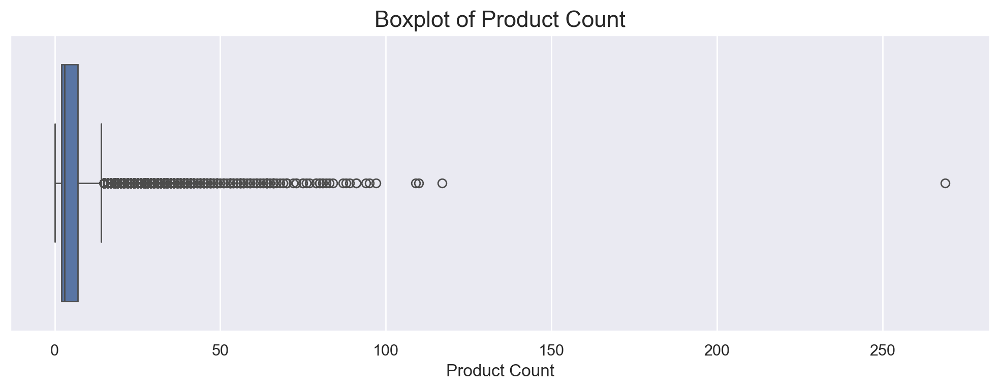

In [30]:
# Create a boxplot for product_count to visualize the distribution and outliers
sns.set()
plt.figure(figsize=(10, 4))
sns.boxplot(x=customers_eda['product_count'], vert=False)

plt.title('Boxplot of Product Count', fontsize=16)
plt.xlabel('Product Count', fontsize=12)

plt.tight_layout()
plt.show()

In [31]:
# Get all customers that have ordered above 100 products
possible_outliers = customers_eda["product_count"][customers_eda["product_count"]>100]

print(possible_outliers)
print(f"There are {possible_outliers.count()} possible outliers, if assumed that a customer "
      f"doesn't order above 100 products")

customer_id
89b7866691    110
910e70571d    117
92ced2dcb9    269
d798652ec0    109
Name: product_count, dtype: int64
There are 4 possible outliers, if assumed that a customer doesn't order above 100 products


In [32]:
customers_eda[customers_eda["product_count"]>100]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
89b7866691,2360,20.0,41,110,73,0.0,88,DELIVERY,DIGI,33.25,0.00,46.60,4.74,12.06,6.08,10.19,13.97,0.00,1.25,15.35,5.55,202.54,1.30,9.89,6,15,15,11,8,13,14,0.0,1,0,1,1,0,0,0,1,3,4,0,0,1,5,16,22,8,6,4,4,1,1,3,Young Adults (20-29),High Diversity
910e70571d,4660,41.0,18,117,26,0.0,88,-,CARD,104.95,14.44,0.00,21.70,0.00,0.00,0.00,7.71,28.13,109.05,0.00,0.00,243.18,0.00,59.20,11,13,14,17,11,12,12,0.0,0,0,0,0,0,0,0,0,1,4,21,9,4,1,1,6,9,24,10,0,0,0,0,Middle-Aged (40-49),High Diversity
92ced2dcb9,2360,23.0,40,269,81,0.0,88,-,CARD,19.08,70.01,37.92,18.30,0.00,739.73,0.00,0.00,0.00,20.11,84.05,197.84,109.31,12.34,109.64,15,17,14,10,9,9,20,0.0,0,0,0,0,0,0,0,0,1,3,9,12,3,4,3,8,14,7,15,9,2,2,2,Young Adults (20-29),High Diversity
d798652ec0,2360,28.0,27,109,83,1.0,89,-,CARD,2.57,28.41,229.22,2.86,0.00,2.84,10.34,58.29,10.43,2.27,0.00,0.00,79.47,7.44,0.00,16,17,10,17,15,8,8,0.0,0,0,0,0,0,0,2,2,2,8,13,17,12,6,7,3,3,6,8,2,0,0,0,Young Adults (20-29),High Diversity


In [33]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = customers_eda["product_count"].quantile(0.25)
Q3 = customers_eda["product_count"].quantile(0.75)

# Calculate the IQR
IQR = Q3 - Q1

# Determine the upper outlier boundary
upper_bound = Q3 + 1.5 * IQR

print(f"Upper bound: {upper_bound}")

Upper bound: 14.5


Calculating the upper bound using the IQR provides a statistical threshold for detecting outliers. However, the upper bound of 14.5 may not be of real usage, as a count of 14.5 products per customer is fairly possible. The values around this threshold could still be considered typical rather than outliers.

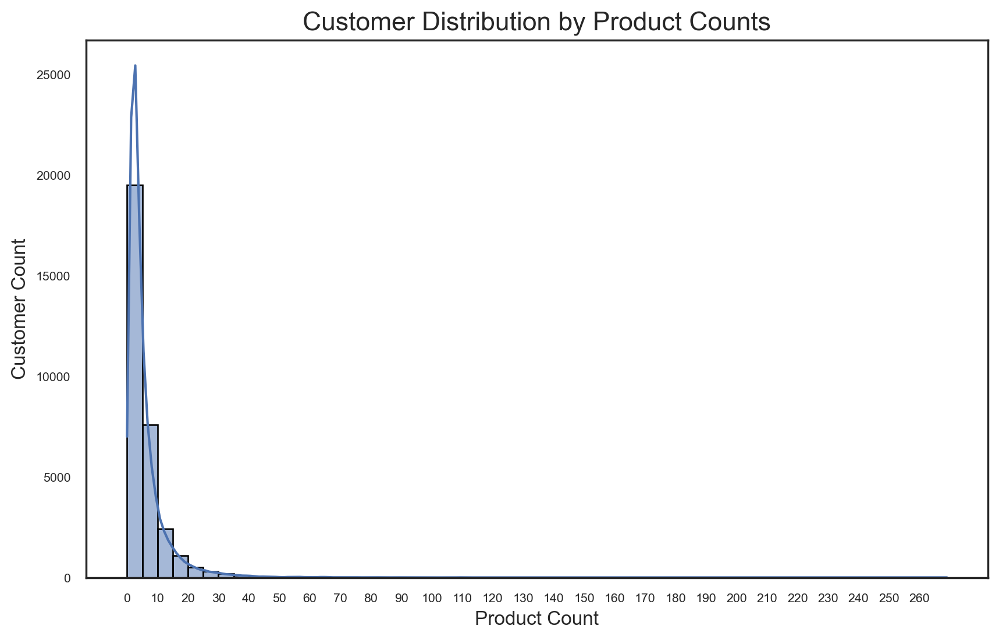

In [34]:
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Arrange bins starting from 0 to the max value + 1 with intervals of 5
bin_edges2 = np.arange(0, customers_eda["product_count"].max() + 1, 5)
sns.histplot(customers_eda["product_count"], bins=bin_edges2, kde=True, edgecolor="black")

plt.title("Customer Distribution by Product Counts", fontsize=16)
plt.xlabel("Product Count", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# Set tick positions with increments of 10
tick_positions2 = np.arange(0, customers_eda["product_count"].max() + 1, 10)
plt.xticks(tick_positions2)

plt.show()

<a class="anchor" id="sub-section-1_4_1_5">

#### 1.4.1.5. is_chain
    
</a>

In [35]:
chain_value_median = round(customers_eda["is_chain"].median(), 2)
chain_value_mean = round(customers_eda["is_chain"].mean(), 2)
print(f"The is_chain mean is {chain_value_mean} and median is {chain_value_median}.\n"
      f"is_chain ranges from a minimum of {customers_eda['is_chain'].min()} to a maximum of {customers_eda['is_chain'].max()}.")

The is_chain mean is 2.82 and median is 2.0.
is_chain ranges from a minimum of 0 to a maximum of 83.


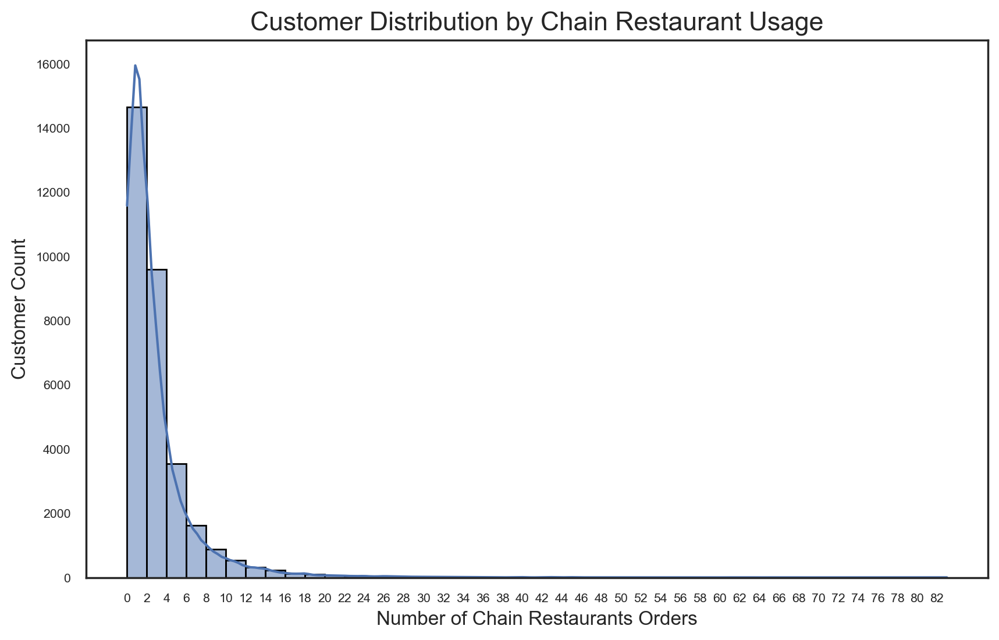

In [36]:
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Arrange bins starting from 0 to the max value + 1 with intervals of 2
bin_edges3 = np.arange(0, customers_eda["is_chain"].max() + 1, 2)
sns.histplot(customers_eda["is_chain"], bins=bin_edges3, kde=True, edgecolor="black")

plt.title("Customer Distribution by Chain Restaurant Usage", fontsize=16)
plt.xlabel("Number of Chain Restaurants Orders", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# Set tick positions with increments of 2
tick_positions3 = np.arange(0, customers_eda["is_chain"].max() + 1, 2)
plt.xticks(tick_positions3)

plt.show()

CC: The is_chain variable represents the frequency of orders from chain restaurants by customers. However, its value alone provides limited insight without knowing each customer’s total number of orders. Calculating the total order count would allow for a better understanding of whether customers tend to favor chain restaurant or not.

<a class="anchor" id="sub-section-1_4_1_6">

#### 1.4.1.6. first_order & last_order
    
</a>

A distribution over a 90-day period, without knowing the specific timeframe, can only serve as a relative measure. This variable reflects customer retention rather than engagement; a large gap between a customer’s first and last order likely indicates recurring use of the service over time.

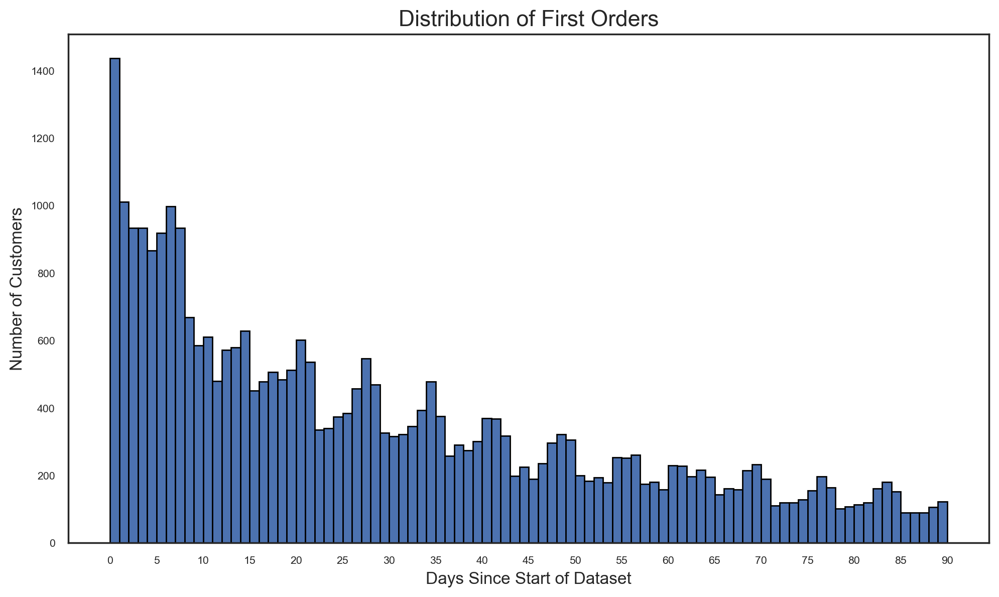

In [37]:
sns.set_style("white")
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["first_order"], bins=90, edgecolor="black")

plt.title("Distribution of First Orders", fontsize=16)
plt.xlabel("Days Since Start of Dataset", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

tick_positions4 = np.arange(0, customers_eda["first_order"].max() + 1, 5)
plt.xticks(tick_positions4)

plt.tight_layout()
plt.show()

In [38]:
customers_eda[customers_eda["first_order"].isna()]

# As the last_order is 0 (i.e. first day of the period), it can be assumed that the first_order is 0 
# Replace NaN with 0

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,NaN,NaN
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN


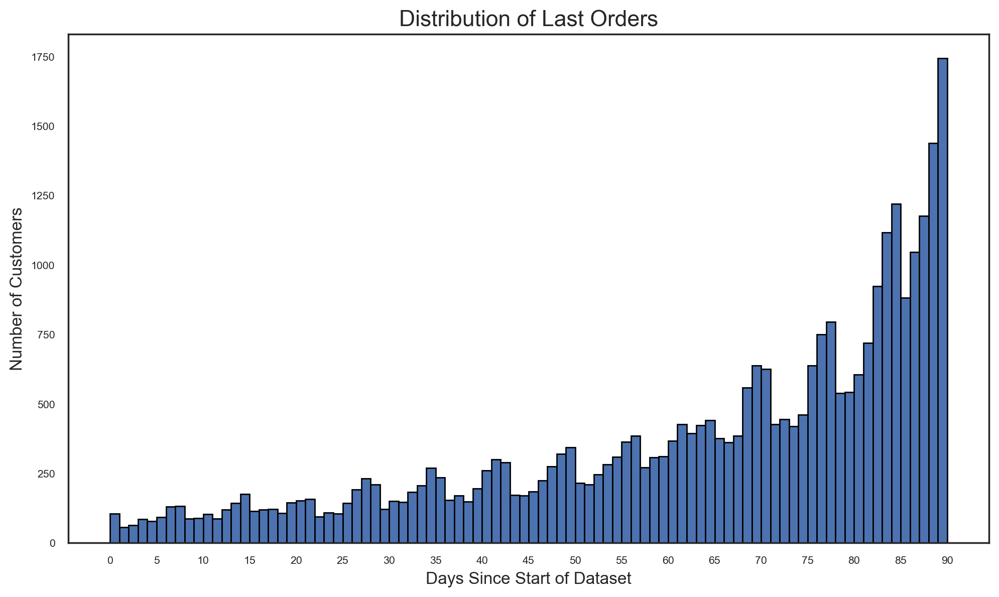

In [39]:
sns.set_style("white")
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["last_order"], bins=90, edgecolor="black")

plt.title("Distribution of Last Orders", fontsize=16)
plt.xlabel("Days Since Start of Dataset", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

tick_positions5 = np.arange(0, customers_eda["last_order"].max() + 1, 5)
plt.xticks(tick_positions5)

plt.tight_layout()
plt.show()

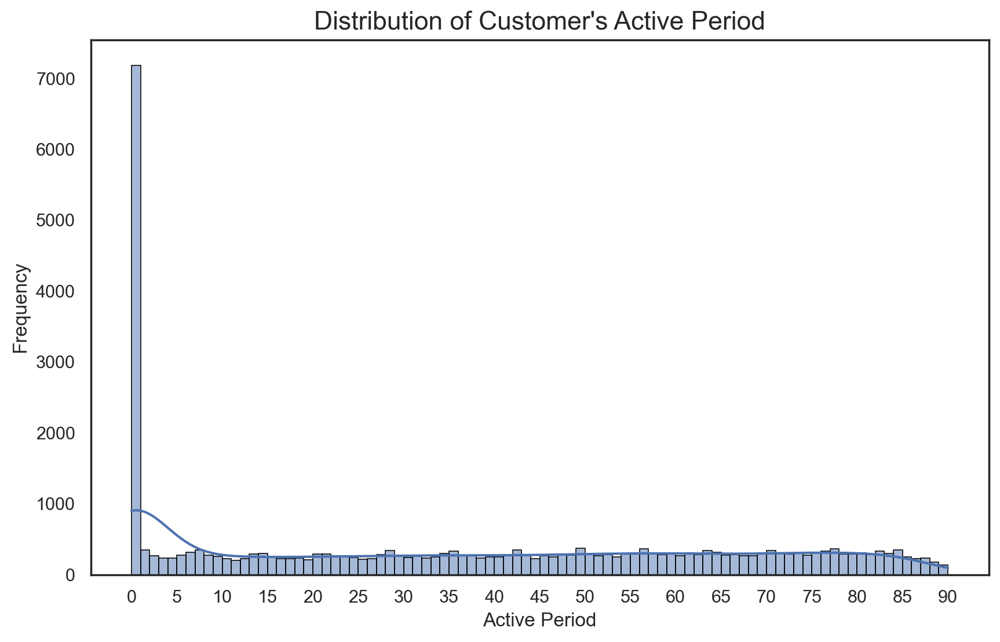

In [40]:
# The active period of a customer can be caluclated by substracting last_order and first_order
# This creates a new column called active_period
customers_eda["active_period"] = customers_eda["last_order"] - customers_eda["first_order"]

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

sns.histplot(customers_eda["active_period"], bins=90, kde=True,  edgecolor="black")
plt.title("Distribution of Customer's Active Period", fontsize=16)
plt.xlabel("Active Period", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

tick_positions6 = np.arange(0, customers_eda["last_order"].max() + 1, 5)
plt.xticks(tick_positions6)

plt.show()

<a class="anchor" id="sub-section-1_4_1_7">

#### 1.4.1.7. CUI_American to CUI_Thai
    
</a>

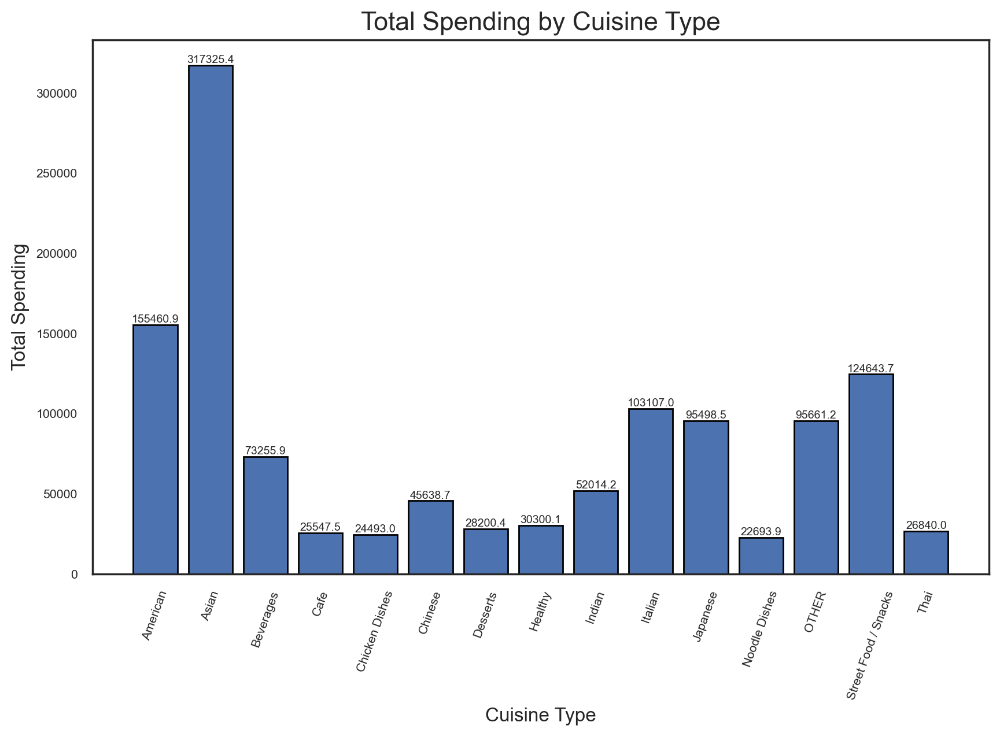

In [41]:
cuisine_columns = [col for col in customers_eda.columns if col.startswith("CUI")]
cuisine_column_sums = customers_eda[cuisine_columns].sum()

# Convert index to string for plotting because i was getting an error
cuisine_column_sums.index = cuisine_column_sums.index.str.replace("CUI_", "")

sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.bar(cuisine_column_sums.index, cuisine_column_sums.values, edgecolor="black")

for index, value in enumerate(round(cuisine_column_sums, 1)):
    plt.text(index, value + 1, str(value), ha='center', va='bottom', fontsize=7)

plt.title("Total Spending by Cuisine Type", fontsize=16)
plt.xlabel("Cuisine Type", fontsize=12)
plt.ylabel("Total Spending", fontsize=12)
plt.xticks(rotation=70)
plt.show() 

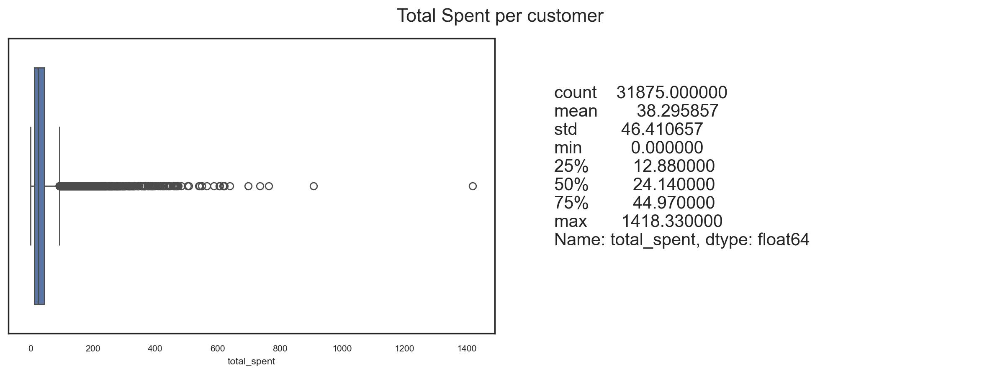

In [42]:
# Create a column that indicates how much customers spent (sum all cuisine types)
customers_eda["total_spent"] = customers_eda[cuisine_columns].sum(axis=1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))
sns.set(font_scale=0.7)

sns.boxplot(x=customers_eda["total_spent"], ax = ax1)

describe = customers_eda["total_spent"].describe()
ax2.text(0.1, 0.3, describe, fontsize=15)
ax2.axis("off")

title = "Total Spent per customer"

plt.suptitle(title, fontsize=16)
plt.tight_layout()
plt.show()

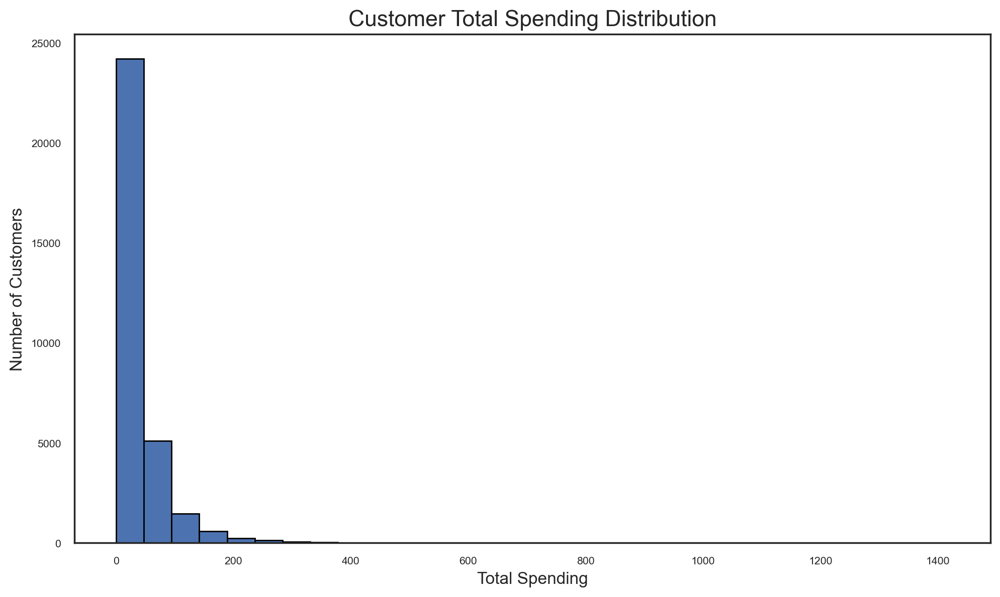

In [43]:
# Plot histogram of total_spent
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.hist(customers_eda['total_spent'], bins=30, edgecolor="black")

# Add labels and title
plt.title("Customer Total Spending Distribution", fontsize=16)
plt.xlabel("Total Spending", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

plt.tight_layout()
plt.show()

The boxplot and histogram of customers' total spending show extreme outliers and a strong right-skewed distribution. 

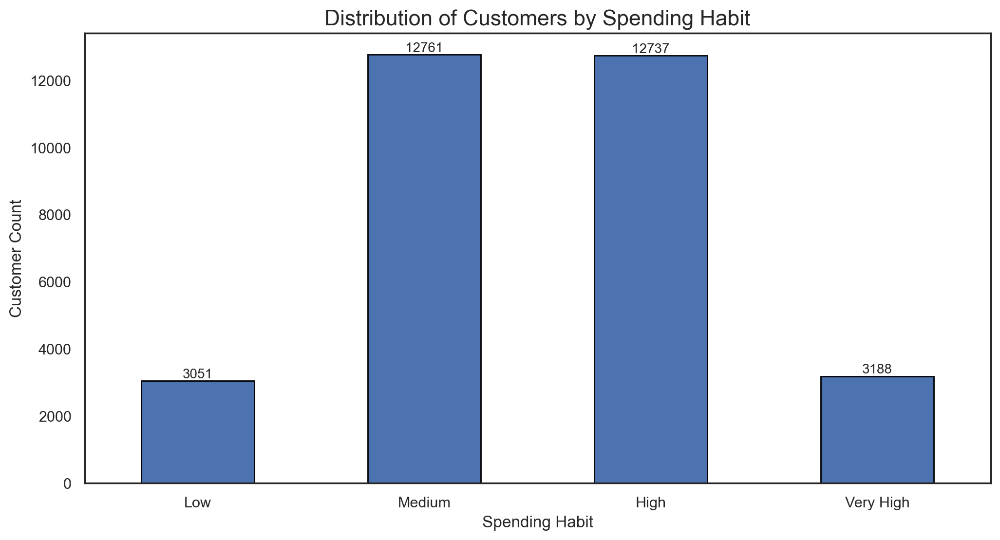

Spending Categories based on total spending:
Low: Customers who spent less than 6.71.
Medium: Customers who spent between 6.71 and 24.14.
High: Customers who spent between 24.14 and 84.31.
Very High: Customers who spent more than 84.31.


In [44]:
# Calculate percentiles 10, 50 and 90
low_cutoff = customers_eda['total_spent'].quantile(0.1)
medium_cutoff = customers_eda['total_spent'].quantile(0.5)
high_cutoff = customers_eda['total_spent'].quantile(0.9)

spending_bins = [0, low_cutoff, medium_cutoff, high_cutoff, float('inf')]
spending_labels = ['Low', 'Medium', 'High', 'Very High']

customers_eda['spending_habit'] = pd.cut(customers_eda['total_spent'], bins=spending_bins, labels=spending_labels, ordered=True)

spending_habit_count = customers_eda['spending_habit'].value_counts().reindex(spending_labels)

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))
spending_habit_count.plot(kind="bar", edgecolor="black")

for index, value in enumerate(spending_habit_count):
    plt.text(index, value + 1, str(value), ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers by Spending Habit", fontsize=16)
plt.xlabel("Spending Habit", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

plt.show()

print(f"Spending Categories based on total spending:")
print(f"Low: Customers who spent less than {low_cutoff:.2f}.")
print(f"Medium: Customers who spent between {low_cutoff:.2f} and {medium_cutoff:.2f}.")
print(f"High: Customers who spent between {medium_cutoff:.2f} and {high_cutoff:.2f}.")
print(f"Very High: Customers who spent more than {high_cutoff:.2f}.")

In [45]:
customers_eda[customers_eda["total_spent"] == 0] 
# 138 rows with 0 monetary units spent

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity,active_period,total_spent,spending_habit
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),No Diversity,0.0,0.0,NaN
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),No Diversity,0.0,0.0,NaN
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN


In [46]:
# Change 0s to NaN to calculate the average spending per cuisine
# This will not change the original dataframe
avg_spending_per_cuisine = customers_eda[cuisine_columns].replace(0, np.nan).mean().sort_values(ascending=False)

print("Average Spending per Cuisine:")
print(avg_spending_per_cuisine)

Average Spending per Cuisine:
CUI_Street Food / Snacks    29.369394
CUI_Asian                   26.674965
CUI_Cafe                    18.702401
CUI_Italian                 15.990540
CUI_Japanese                15.158489
CUI_Indian                  15.085325
CUI_American                14.406533
CUI_Desserts                13.988309
CUI_Healthy                 13.969604
CUI_OTHER                   13.586313
CUI_Beverages               13.488474
CUI_Chinese                 12.958169
CUI_Thai                    11.286804
CUI_Noodle Dishes           10.194933
CUI_Chicken Dishes           7.540964
dtype: float64


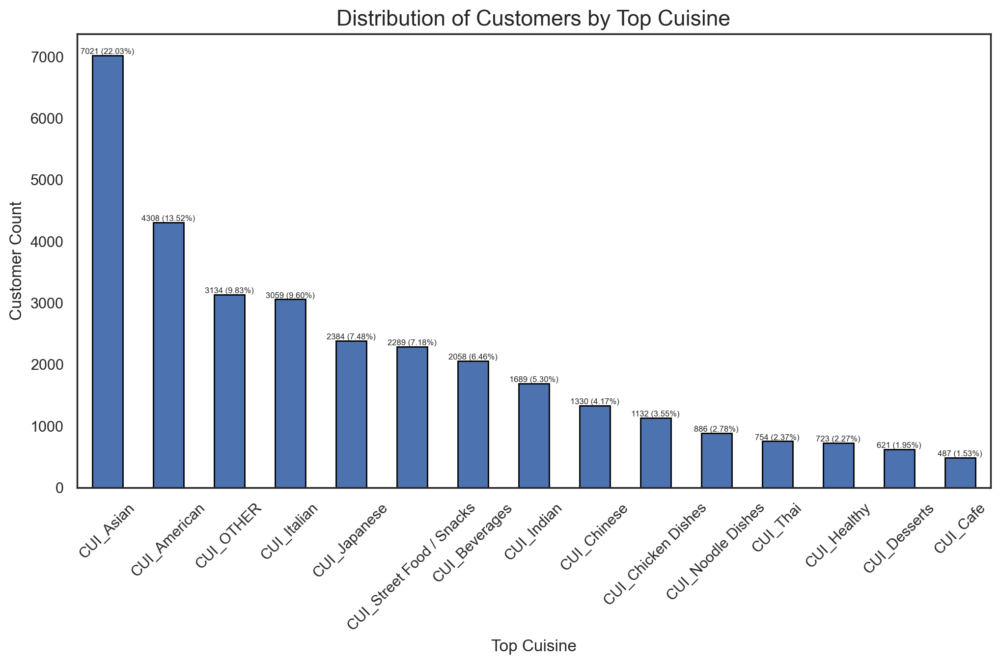

In [47]:
# Create a column which shows which cuisine a customer has spent the most money on
customers_eda['top_cuisine'] = customers_eda[cuisine_columns].idxmax(axis=1)
cuisine_type_count = customers_eda["top_cuisine"].value_counts()
cuisine_type_percent = customers_eda["top_cuisine"].value_counts(normalize=True) * 100

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

cuisine_type_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(round(cuisine_type_count, 1), cuisine_type_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=6)

plt.title("Distribution of Customers by Top Cuisine", fontsize=16)
plt.xlabel("Top Cuisine", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

<a class="anchor" id="sub-section-1_4_1_8">

#### 1.4.1.8. DOW_0 to DOW_6
    
</a>

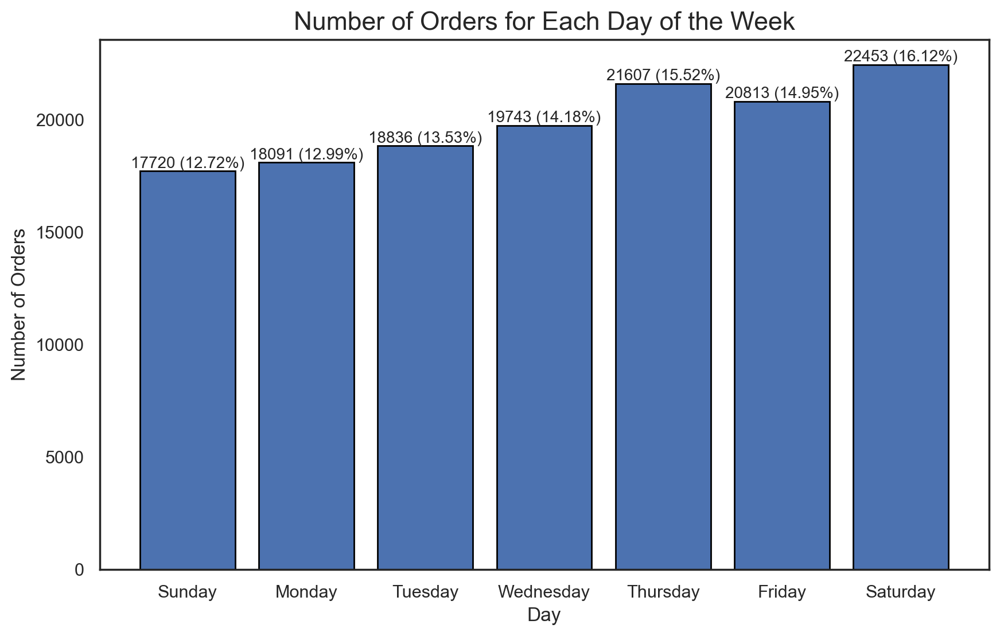

In [48]:
day_names = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]

# Create column names in the same format as in the data frame
days_columns = [f"DOW_{i}" for i in range(0, 7)]

# Get all columns with days_columns format
# Calculate the total number of orders by summing across each day column
days_column_sums = customers_eda[days_columns].sum()
days_column_sums_percent = (days_column_sums / days_column_sums.sum()) * 100

# Replace the index of days_column_sums with day_names
days_column_sums.index = day_names

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Plot the total orders for each day
plt.bar(days_column_sums.index, days_column_sums.values, edgecolor="black")

for index, (count, percent) in enumerate(zip(round(days_column_sums), days_column_sums_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Number of Orders for Each Day of the Week", fontsize=16)
plt.xlabel("Day", fontsize=12)
plt.ylabel("Number of Orders", fontsize=12)
plt.xticks(rotation=0)

plt.show()

In [49]:
# Create a column that calculates the total number of orders for each customers
customers_eda["total_number_of_orders"] = customers_eda[days_columns].sum(axis=1)
days_mean = customers_eda["total_number_of_orders"].mean().round(2)
days_median = customers_eda["total_number_of_orders"].median()

print(f"The total_number_of_orders mean ({days_mean}) and median ({days_median}) suggest that "
      f"most customers place a relatively low number of orders during the week")
print(f"The total_number_of_orders ranges from a minimum of {customers_eda['total_number_of_orders'].min()} "
      f"to a maximum of {customers_eda['total_number_of_orders'].max()} orders a week.")
print(f"There are {len(customers_eda[customers_eda['total_number_of_orders'] == 0])} rows with 0 orders.")

The total_number_of_orders mean (4.37) and median (3.0) suggest that most customers place a relatively low number of orders during the week
The total_number_of_orders ranges from a minimum of 0 to a maximum of 94 orders a week.
There are 138 rows with 0 orders.


There are customers that have not placed any orders. This is consistent with the findings in vendor_counts, where it can be assumed that customers just have created accounts without placing any orders.

Now, we can check which days of the week are more popular to order food, and have a better insight into customers' spending habits. 

In [50]:
customers_eda['start_week'] = customers_eda['DOW_1'] + customers_eda['DOW_2']
customers_eda['mid_week'] = customers_eda['DOW_3'] + customers_eda['DOW_4']
customers_eda['end_week'] = customers_eda['DOW_5'] + customers_eda['DOW_6'] + customers_eda['DOW_0']

In [51]:
week = ['start_week', 'mid_week', 'end_week']

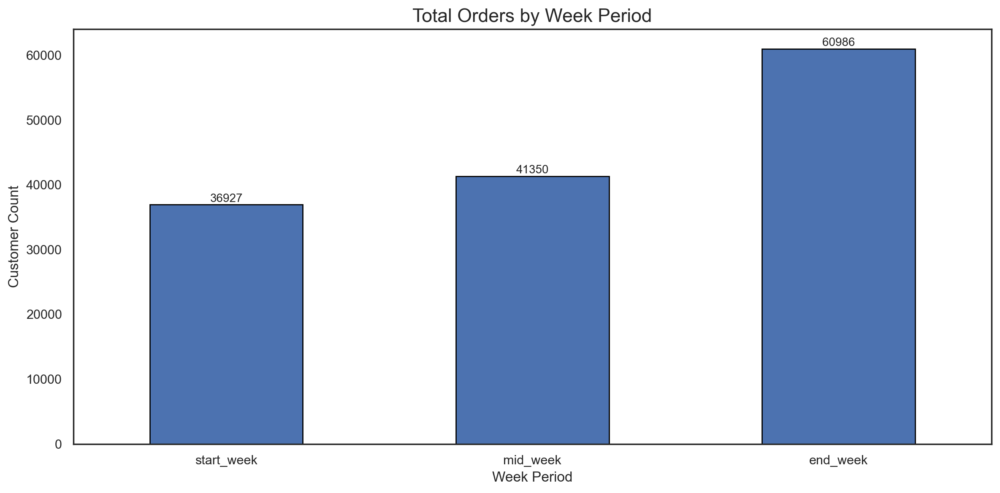

In [52]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

week_totals = customers_eda[week].sum()

week_totals.plot(kind='bar', stacked=True, edgecolor="black")
plt.title("Total Orders by Week Period", fontsize=16)
plt.xlabel("Week Period", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

for index, value in enumerate(week_totals):
    plt.text(index, value + 50, str(int(value)), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_1_9">

#### 1.4.1.9. HR_0 to HR_1
    
</a>

In [53]:
missing_count = len(customers_eda[customers_eda['HR_0'].isna()])
non_missing_counts = customers_eda['HR_0'].value_counts()

print(f"In the 'HR_0' variable, there are {missing_count} missing values. "
      f"The only non-missing value is 0, with a count of {non_missing_counts[0]}.")

In the 'HR_0' variable, there are 1164 missing values. The only non-missing value is 0, with a count of 30711.


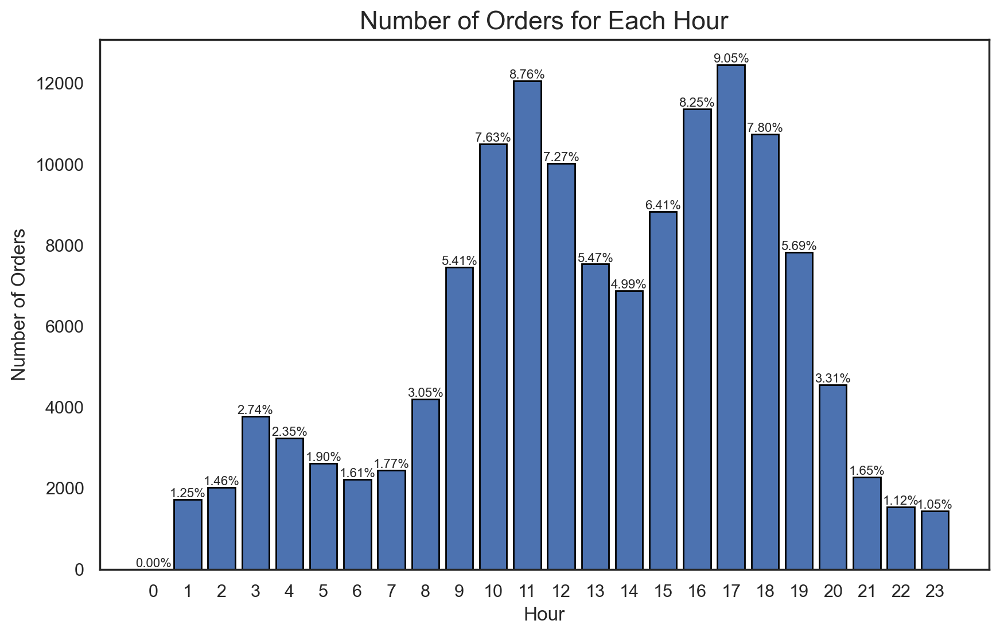

In [54]:
# Create a list of column names from HR_0 to HR_23 (similar to DOW_)
hour_columns = [f"HR_{i}" for i in range(0, 24)]

# Get all columns with hour_columns format
# Calculate the total number of orders by summing across each hour column
hr_column_sums = customers_eda[hour_columns].sum()
hr_column_sums_percent = (hr_column_sums / hr_column_sums.sum()) * 100

# Convert index to string for plotting to avoid getting an error
hr_column_sums.index = hr_column_sums.index.str.replace("HR_", "")

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Plot the total orders for each hour
plt.bar(hr_column_sums.index, hr_column_sums.values, edgecolor="black")

for index, percent in enumerate(hr_column_sums_percent):
    plt.text(index, hr_column_sums.values[index] + 1, f"{percent:.2f}%", ha='center', va='bottom', fontsize=8)

plt.title("Number of Orders for Each Hour", fontsize=16)
plt.xlabel("Hour", fontsize=12)
plt.ylabel("Number of Orders", fontsize=12)
plt.xticks(rotation=0)

plt.show()

In [55]:
# Check if total number of orders based on days of the week is the same in hours of the day
print(f"Total sum of orders across the days of the week: {days_column_sums.sum()}")
print(f"Total sum of orders across the hours of the day: {hr_column_sums.sum()}")

Total sum of orders across the days of the week: 139263
Total sum of orders across the hours of the day: 137711.0


In [56]:
# Check the difference between the two sums, as they should be equal but there are missing values
print(f"Difference: {days_column_sums.sum() - hr_column_sums.sum()}")

Difference: 1552.0


There are 1165 missing values in HR_0. Therefore, the difference betwen the days_column_sums.sum() and hr_column_sums.sum() should be equal to 1165. However, the actual difference is 1553. There is an inconsistency, and must be dealt with.

Similarly to grouping days of the week, we group hours of the day to get a clearer picture as to when customers place orders. 

In [57]:
customers_eda['night'] = customers_eda[['HR_22', 'HR_23', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5']].sum(axis=1)
customers_eda['morning'] = customers_eda[['HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10']].sum(axis=1)
customers_eda['midday'] = customers_eda[['HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
customers_eda['afternoon'] = customers_eda[['HR_15', 'HR_16', 'HR_17']].sum(axis=1)
customers_eda['evening'] = customers_eda[['HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)

In [58]:
day = ["night", "morning", "midday", "afternoon", "evening"]

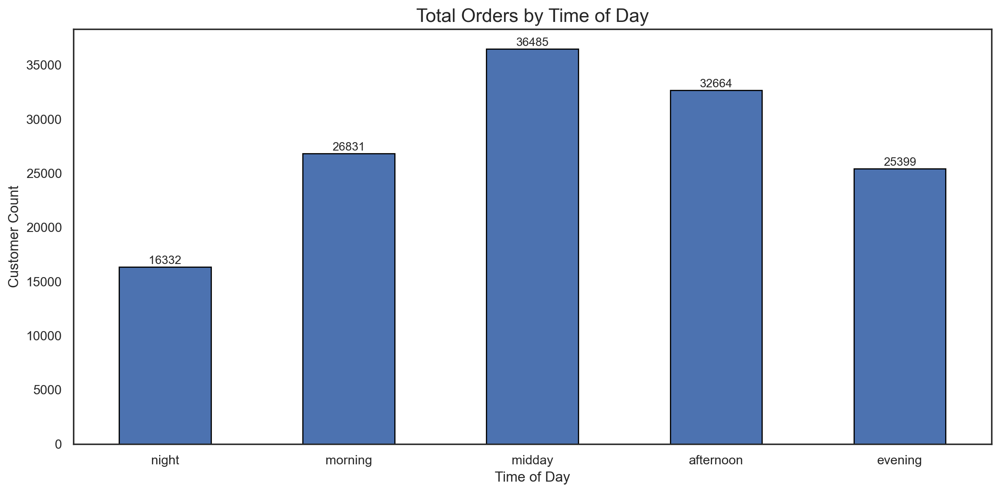

In [59]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

day_totals = customers_eda[day].sum()

day_totals.plot(kind='bar', stacked=True, edgecolor="black")
plt.title("Total Orders by Time of Day", fontsize=16)
plt.xlabel("Time of Day", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

for index, value in enumerate(day_totals):
    plt.text(index, value + 50, str(int(value)), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_2">

### 1.4.2. Categorical Variables
    
</a>

<a class="anchor" id="sub-section-1_4_2_1">

#### 1.4.2.1. customer_region
    
</a>

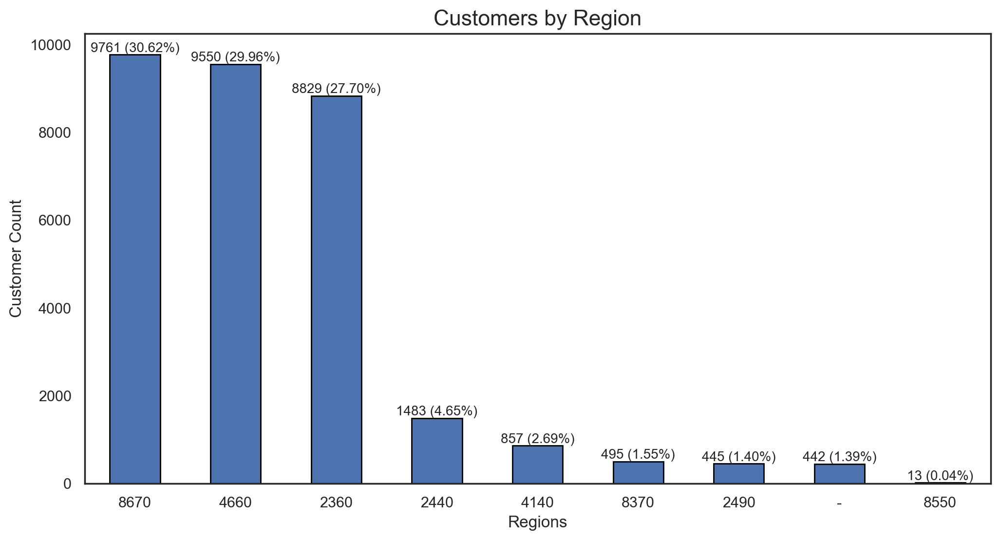

In [60]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

customer_region_count = customers_eda["customer_region"].value_counts()
customer_region_percent = customers_eda["customer_region"].value_counts(normalize=True) * 100

customer_region_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(customer_region_count, customer_region_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customers by Region", fontsize=16)
plt.xlabel("Regions", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

The top regions are 8670, 4660, and 2360. Each code beginning with the same number can represent the same city. For instance, 8670, 8370 and 8550 could represent the same city, but different areas of the city.

In [61]:
city_mapping = {"8670": "city_8", 
                "8370": "city_8", 
                "8550": "city_8",
                "4660": "city_4", 
                "4140": "city_4",
                "2360": "city_2", 
                "2440": "city_2", 
                "2490": "city_2",
                "-": "-"}

# Create a new column with the cities divided into 3 and "-"
customers_eda["city"] = customers_eda["customer_region"].map(city_mapping)

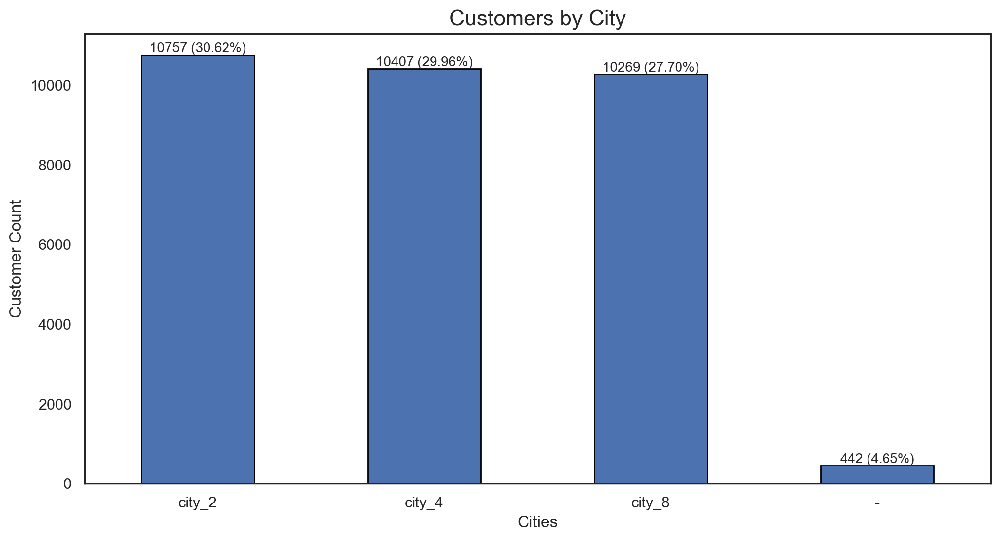

In [62]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

customer_city_count = customers_eda["city"].value_counts()
customer_city_percent = customers_eda["city"].value_counts(normalize=True) * 100

customer_city_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(customer_city_count, customer_region_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customers by City", fontsize=16)
plt.xlabel("Cities", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_4_2_2">

#### 1.4.2.2. last_promo
    
</a>

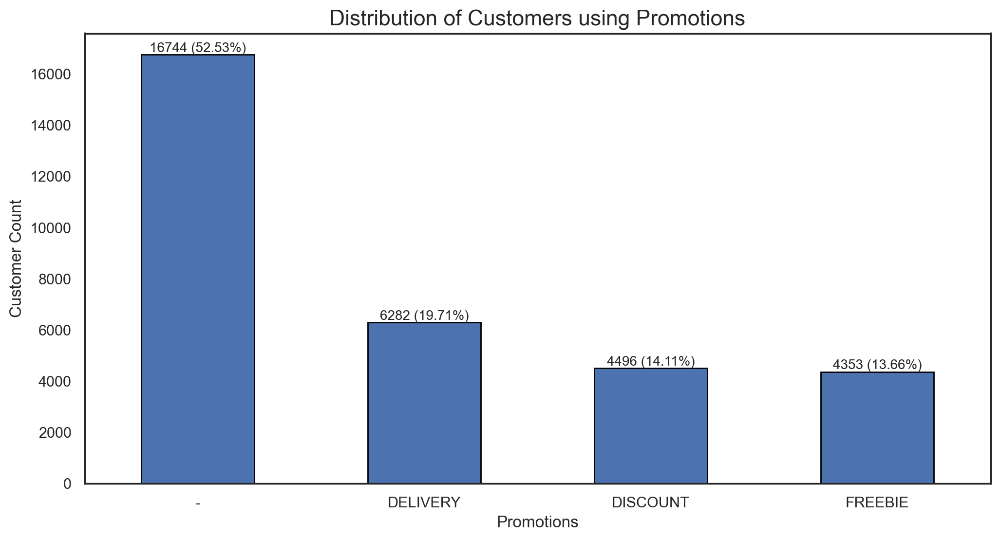

In [63]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

last_promo_count = customers_eda["last_promo"].value_counts()
last_promo_percent = customers_eda["last_promo"].value_counts(normalize=True) * 100

last_promo_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(last_promo_count, last_promo_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers using Promotions", fontsize=16)
plt.xlabel("Promotions", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

As last_promo represents the last type of promotion or discount used, it does not give us the most used type of promotion. Therefore, creating a new variable indicating if a promotion or discount was used or not might be more useful.

In [64]:
last_promo_mapping = {"-": "NO",
                      "DELIVERY": "YES",
                      "DISCOUNT": "YES",
                      "FREEBIE": "YES"}

# Create a new column with the cities divided into 3 and "-"
customers_eda["promo_used"] = customers_eda["last_promo"].map(last_promo_mapping)

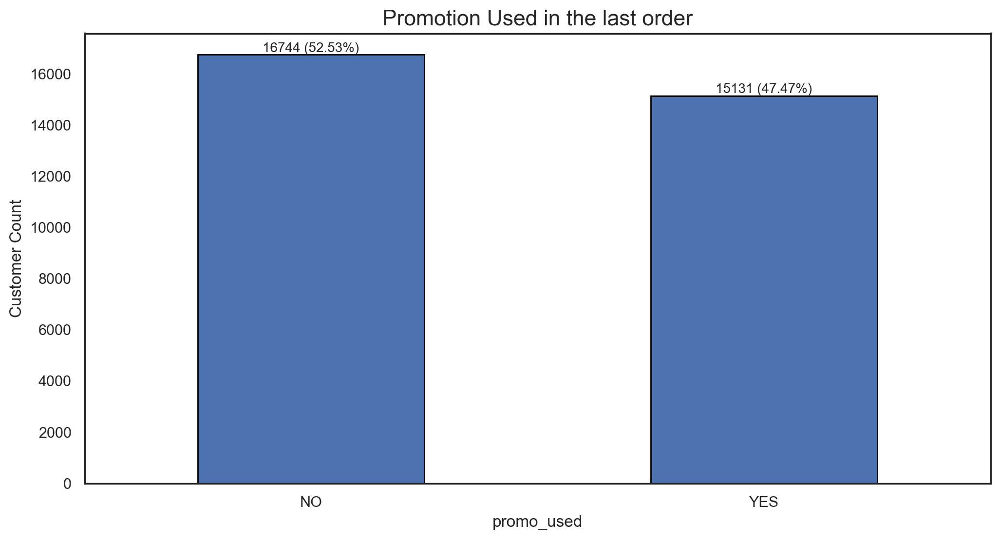

In [65]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

promo_used_count = customers_eda["promo_used"].value_counts()
promo_used_percent = customers_eda["promo_used"].value_counts(normalize=True) * 100

promo_used_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(promo_used_count, promo_used_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Promotion Used in the last order", fontsize=16)
#plt.xlabel("Cities", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_4_2_3">

#### 1.4.2.3. payment_method
    
</a>

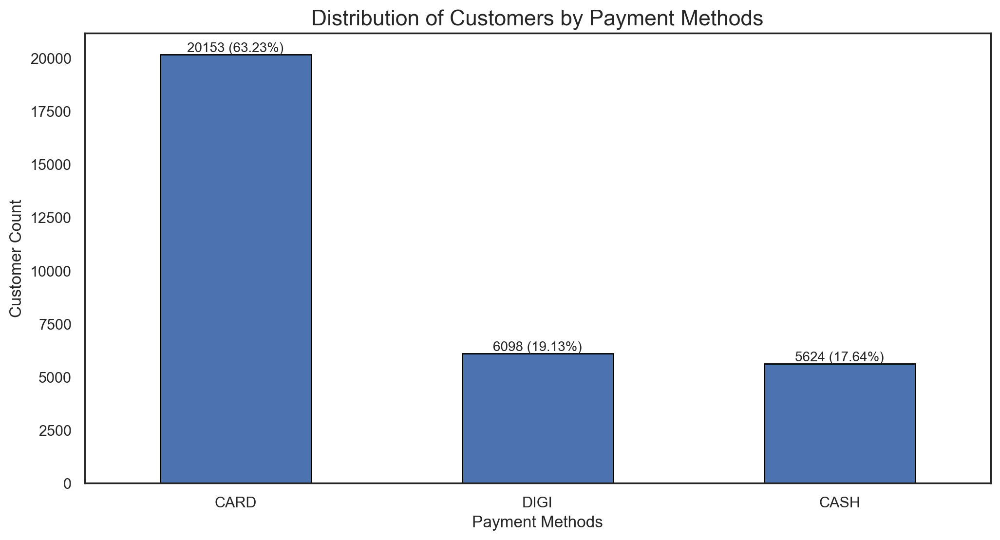

In [66]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

payment_method_count = customers_eda["payment_method"].value_counts()
payment_method_percent = customers_eda["payment_method"].value_counts(normalize=True) * 100

payment_method_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(payment_method_count, payment_method_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers by Payment Methods", fontsize=16)
plt.xlabel("Payment Methods", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_5">

## 1.5. Multivariate Analysis
    
</a>

<a class="anchor" id="sub-section-1_5_1">

### 1.5.1. payment_method & product_count
    
</a>

Investigate whether customers using different payment methods behave differently in terms of order volume and engagement.

payment_method
CARD    6.358458
CASH    4.137624
DIGI    4.799770
Name: product_count, dtype: float64


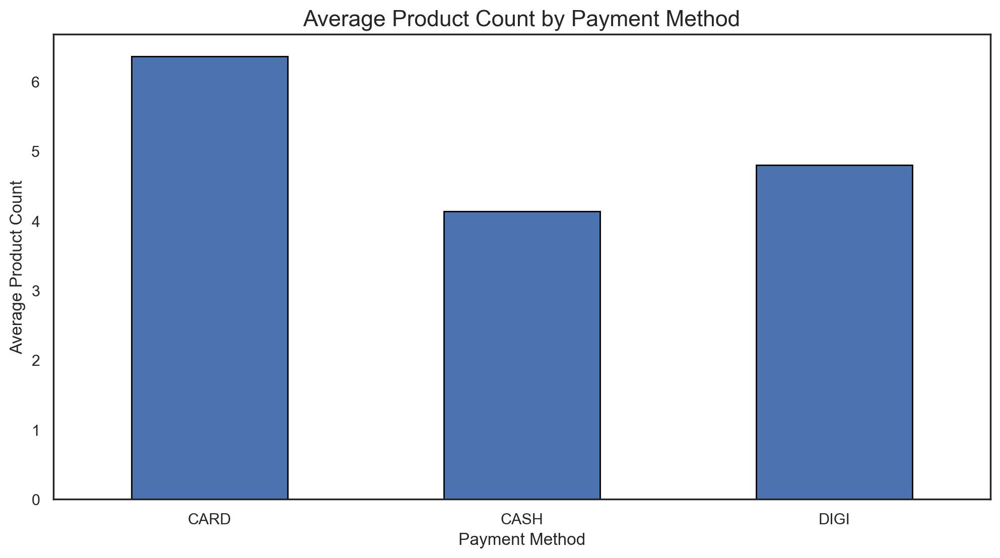

In [67]:
# Calculate the average product_count per payment method
payment_product_count = customers_eda.groupby('payment_method')['product_count'].mean()
print(payment_product_count)

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))
payment_product_count.plot(kind='bar', edgecolor='black')

plt.title('Average Product Count by Payment Method', fontsize=16)
plt.xlabel('Payment Method', fontsize=12)
plt.ylabel('Average Product Count', fontsize=12)
plt.xticks(rotation=0)

plt.show()

Customers who pay by CARD tend to purchase more products on average than those who use CASH or DIGI (digital payment methods).

<a class="anchor" id="sub-section-1_5_2">

### 1.5.2. city & last_promo/ payment_method
    
</a>

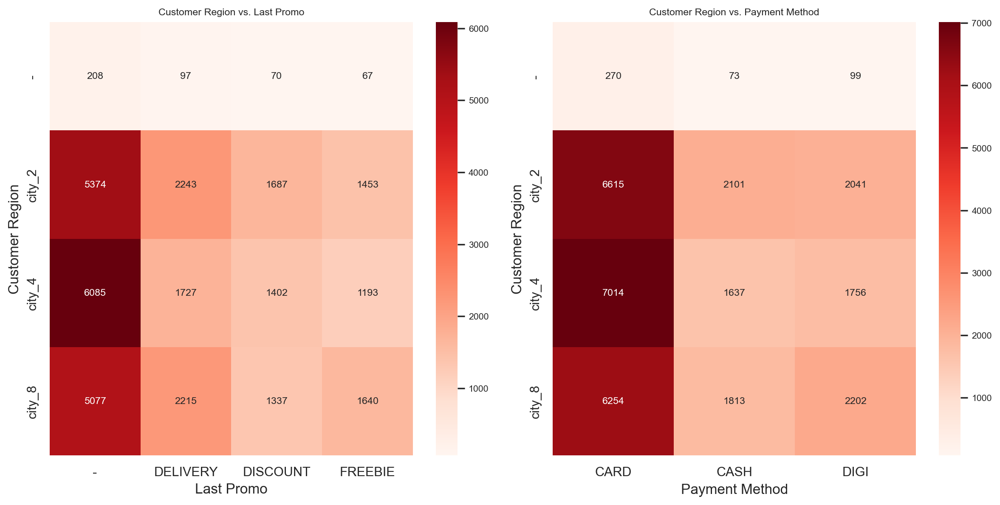

In [68]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

crosstab1 = pd.crosstab(customers_eda['city'], customers_eda['last_promo'])
crosstab2 = pd.crosstab(customers_eda['city'], customers_eda['payment_method'])

sns.heatmap(crosstab1, annot=True, fmt="d", cmap="Reds", ax = ax1)
ax1.set_title("Customer Region vs. Last Promo")
ax1.set_xlabel("Last Promo")
ax1.set_ylabel("Customer Region")

sns.heatmap(crosstab2, annot=True, fmt="d", cmap="Reds", ax = ax2)
ax2.set_title("Customer Region vs. Payment Method")
ax2.set_xlabel("Payment Method")
ax2.set_ylabel("Customer Region")

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_5_3">

### 1.5.3. vendor_diversity & customer_age/ product_count
    
</a>

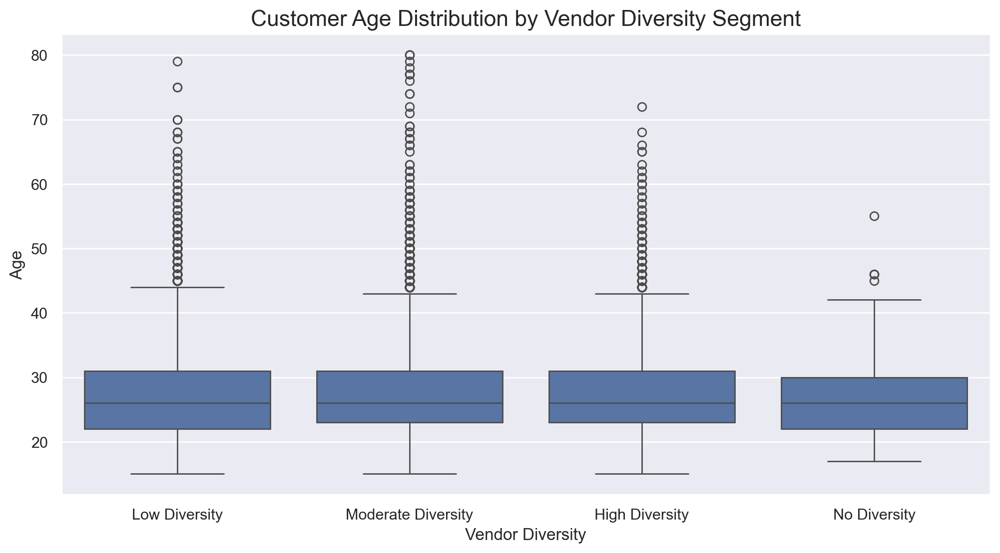

In [69]:
sns.set()
plt.figure(figsize=(12, 6))
sns.boxplot(x='vendor_diversity', y='customer_age', data=customers_eda)

plt.title("Customer Age Distribution by Vendor Diversity Segment", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Age", fontsize=12)
plt.xticks(rotation=0)

plt.show()

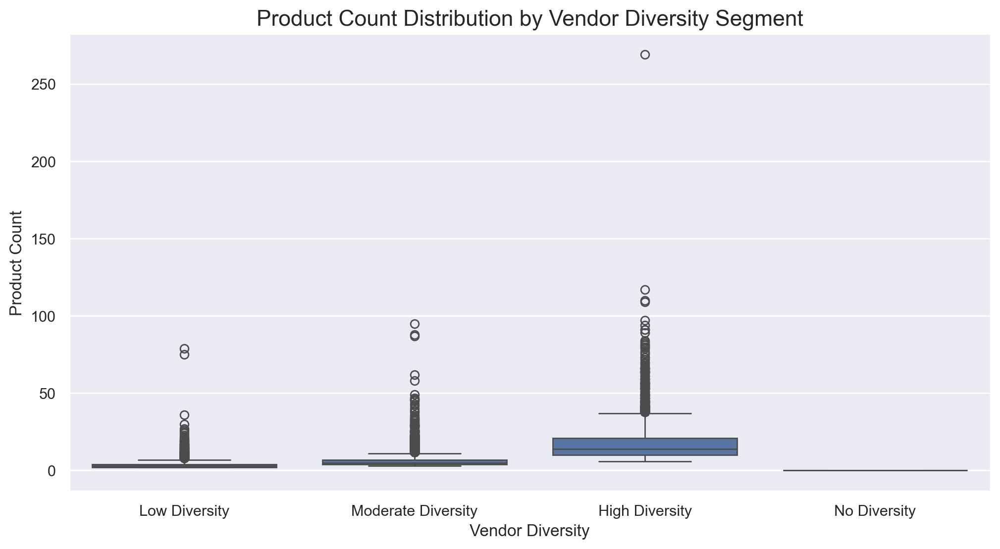

In [70]:
sns.set()
plt.figure(figsize=(12, 6))
sns.boxplot(x='vendor_diversity', y='product_count', data=customers_eda)

plt.title("Product Count Distribution by Vendor Diversity Segment", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Product Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_5_4">

### 1.5.4. top_cuisine & city

</a>

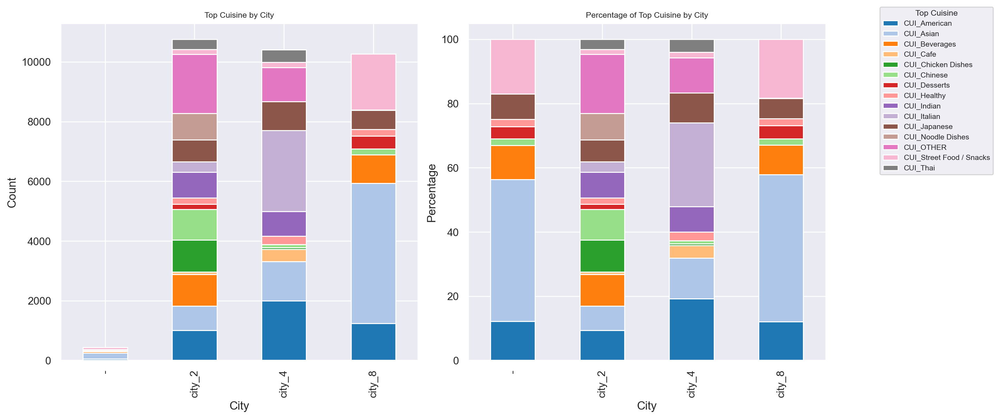

In [71]:
sns.set()
colors = sns.color_palette("tab20", n_colors=15)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

preferred_cuisine_by_region = customers_eda.groupby(['city', 'top_cuisine']).size().unstack()
preferred_cuisine_by_region_proportions = preferred_cuisine_by_region.div(preferred_cuisine_by_region.sum(axis=1), axis=0) * 100

preferred_cuisine_by_region.plot(kind='bar', stacked=True, ax=ax1, legend=False, color=colors)
ax1.set_title("Top Cuisine by City")
ax1.set_xlabel("City")
ax1.set_ylabel("Count")

preferred_cuisine_by_region_proportions.plot(kind='bar', stacked=True, ax=ax2, legend=False, color=colors)
ax2.set_title("Percentage of Top Cuisine by City")
ax2.set_xlabel("City")
ax2.set_ylabel("Percentage")

handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Top Cuisine", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_5_5">

### 1.5.5. Spending Habits and Order Behavior
    
</a>

**Objective**: Determine if there’s a relationship between customers’ spending habits and their order behavior, such as order frequency and vendor diversity.

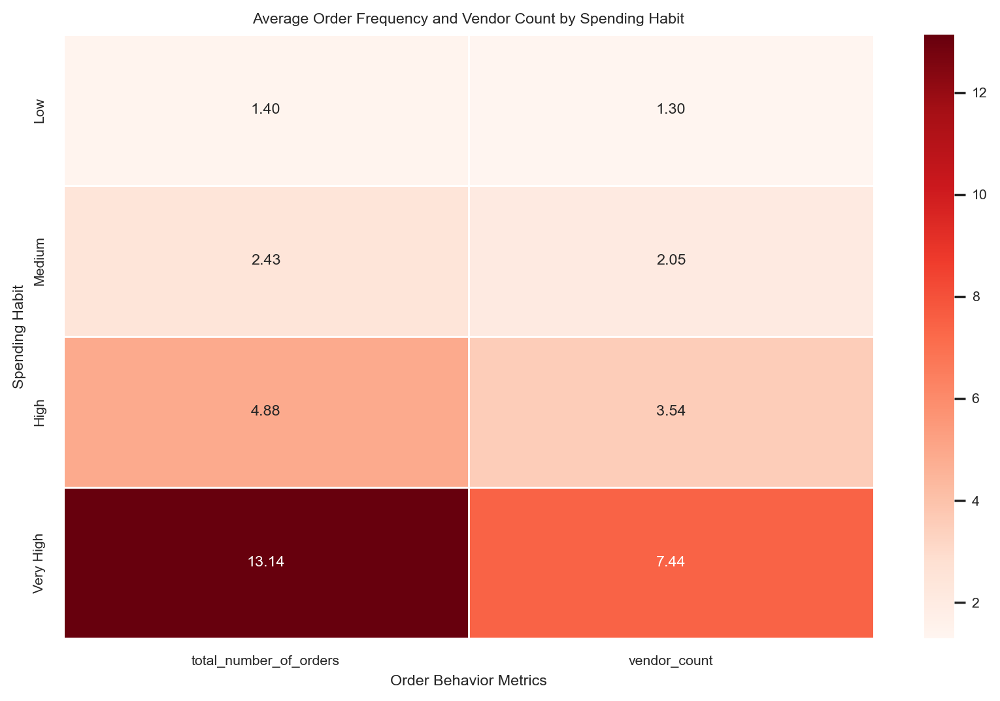

In [72]:
# observed=False to avoid warning and ensure all categories in the categorical are included
spending_behavior = customers_eda.groupby('spending_habit', observed=False)[['total_number_of_orders', 'vendor_count']].mean()

plt.figure(figsize=(10, 6))
sns.heatmap(spending_behavior, annot=True, cmap="Reds", fmt=".2f", linewidths=.5)

plt.title("Average Order Frequency and Vendor Count by Spending Habit")
plt.xlabel("Order Behavior Metrics")
plt.ylabel("Spending Habit")

plt.show()

Based on the heatmap, we can conclude that **higher spending customers tend to place more frequent orders and order from a greater number of vendors**. Specifically, customers in the “Very High” spending category have significantly higher average order frequency (13.14 orders) and vendor diversity (7.44 vendors) compared to lower spending categories. This suggests that high spenders are also more engaged with the platform, both in terms of frequency and variety of vendors.

<a class="anchor" id="sub-section-1_5_6">

### 1.5.6. Promotion Usage and Spending Patterns
    
</a>

**Objective**: Examine if certain promotions (e.g., discounts, free delivery) are associated with higher spending or higher product count.

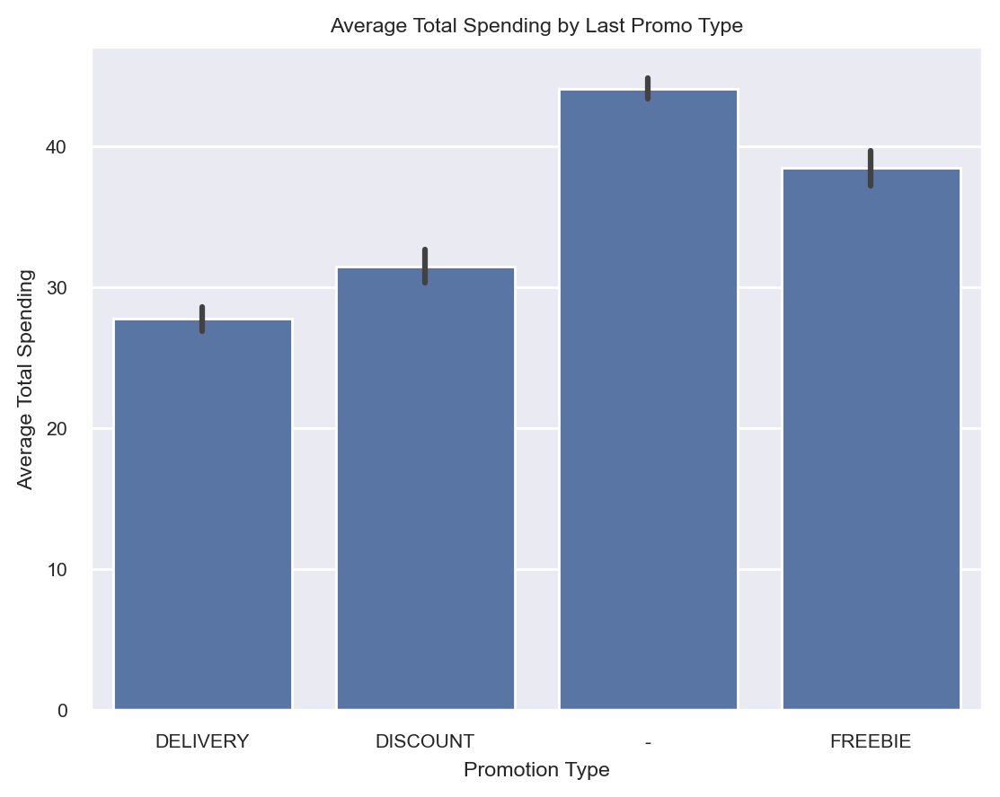

In [73]:
sns.barplot(x='last_promo', y='total_spent', data=customers_eda, estimator='mean')
plt.title("Average Total Spending by Last Promo Type")
plt.xlabel("Promotion Type")
plt.ylabel("Average Total Spending")
plt.show()

Based on the barplot, customers who did not use a promotion (”-”) have the highest average total spending, followed closely by those who used “Freebie” promotions. <br>
This suggests that non-promotion users and freebie users may tend to be higher spenders, while “Delivery” and “Discount” promotions are associated with slightly lower spending on average.

<a class="anchor" id="sub-section-1_5_7">

### 1.5.7. Payment Method Preferences by Spending and Promotion Usage
    
</a>

**Objective**: Examine if certain payment methods are preferred by high spenders or those who use specific promotions, which could guide partnership or payment-incentive strategies.

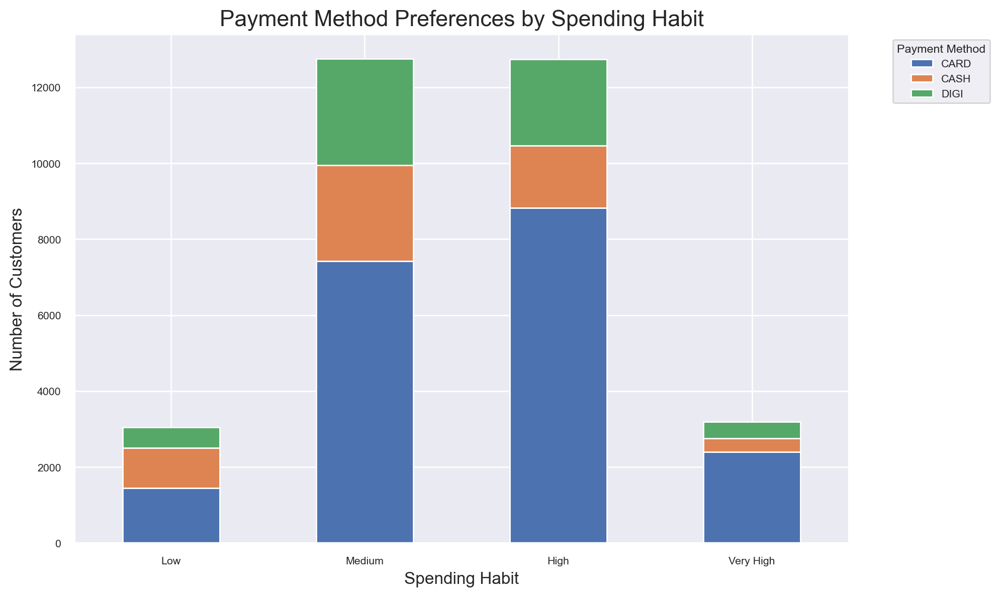

In [74]:
# Group by spending habit and payment method, then count the occurrences
spending_payment = customers_eda.groupby(['spending_habit', 'payment_method'], observed=False).size().unstack(fill_value=0)

spending_payment.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title("Payment Method Preferences by Spending Habit", fontsize=16)
plt.xlabel("Spending Habit", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.legend(title="Payment Method", bbox_to_anchor=(1.05, 1), loc='upper left')  # Legend outside the plot for clarity
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

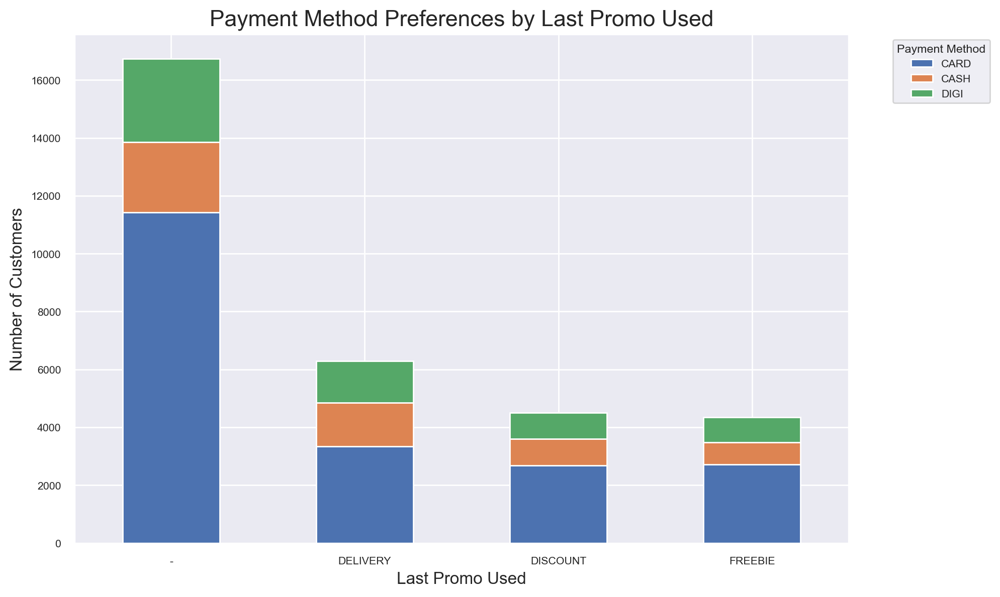

In [75]:
# Group by last promo used and payment method, then count the occurrences
promo_payment = customers_eda.groupby(['last_promo', 'payment_method']).size().unstack(fill_value=0)

promo_payment.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title("Payment Method Preferences by Last Promo Used", fontsize=16)
plt.xlabel("Last Promo Used", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.legend(title="Payment Method", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

High spenders predominantly use card payments but also utilize cash and digital options more frequently, suggesting diverse payment preferences at higher spending levels. Additionally, while card remains the top method across all promotions, specific promotions like “Delivery” and “Discount” show increased use of cash and digital payments, indicating opportunities for targeted payment incentives aligned with spending and promotional preferences.

<a class="anchor" id="sub-section-1_6_8">

### 1.5.8. Week period and time of day
    
</a>

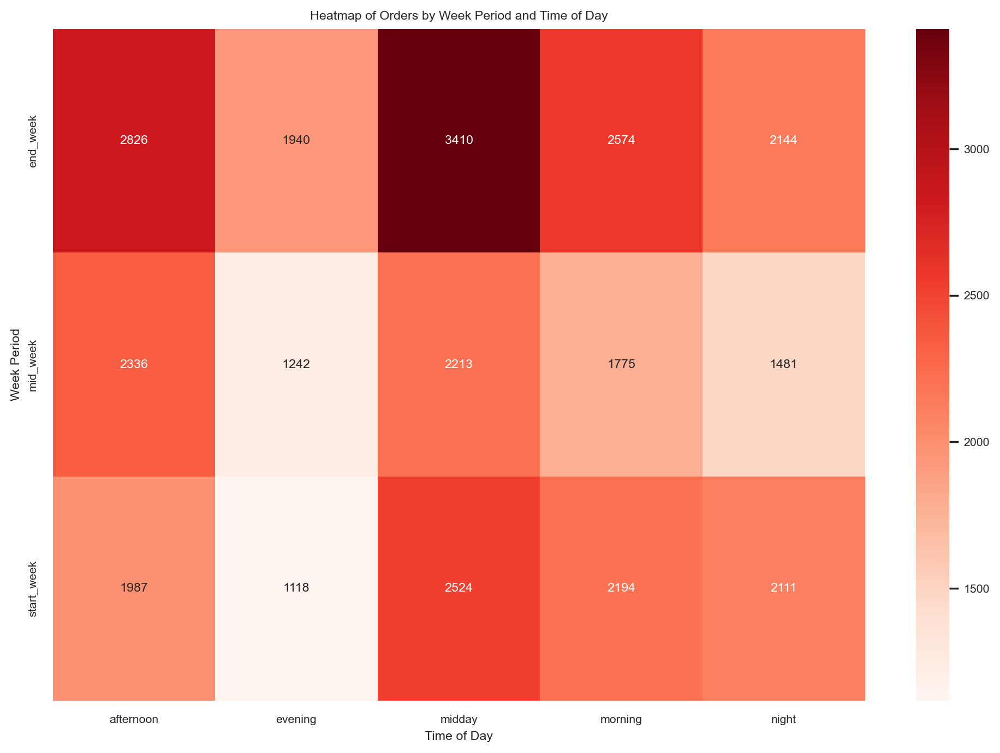

In [76]:
# Define the day and hour columns based on new week period and time period categories

# Create a DataFrame for the heatmap based on max activity by day period and time period
week_day_periods = customers_eda[week + day].copy()
week_day_periods['week_period'] = week_day_periods[week].idxmax(axis=1)
week_day_periods['day_time'] = week_day_periods[day].idxmax(axis=1)

# Calculate the count of occurrences for each day-hour combination
week_day_counts = pd.crosstab(week_day_periods['week_period'], week_day_periods['day_time'])

plt.figure(figsize=(12, 8))
sns.heatmap(week_day_counts, annot=True, fmt="d",cmap="Reds")
plt.title("Heatmap of Orders by Week Period and Time of Day")
plt.xlabel("Time of Day")
plt.ylabel("Week Period")
plt.show()

<a class="anchor" id="sub-section-1_5_9">

### 1.5.9. Spending habits in cities & in top cuisines
    
</a>

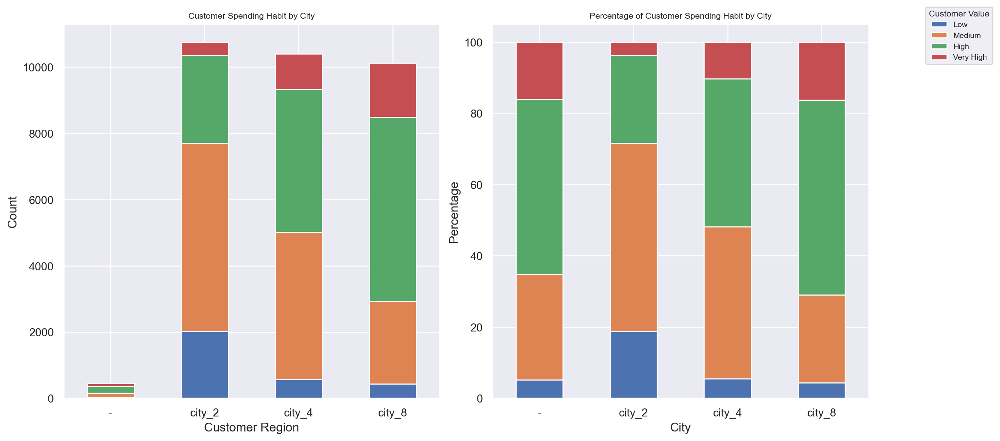

In [77]:
sns.set()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

customer_value_by_region = customers_eda.groupby(['city', 'spending_habit'], observed=False).size().unstack()
customer_value_by_region_proportions = customer_value_by_region.div(customer_value_by_region.sum(axis=1), axis=0) * 100

customer_value_by_region.plot(kind='bar', stacked=True, ax = ax1, legend=False)
ax1.set_title("Customer Spending Habit by City")
ax1.set_xlabel("Customer Region")
ax1.set_ylabel("Count")
ax1.tick_params(axis='x', rotation=0)

customer_value_by_region_proportions.plot(kind='bar', stacked=True, ax = ax2, legend=False)
ax2.set_title("Percentage of Customer Spending Habit by City")
ax2.set_xlabel("City")
ax2.set_ylabel("Percentage")
ax2.tick_params(axis='x', rotation=0)


handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Customer Value", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

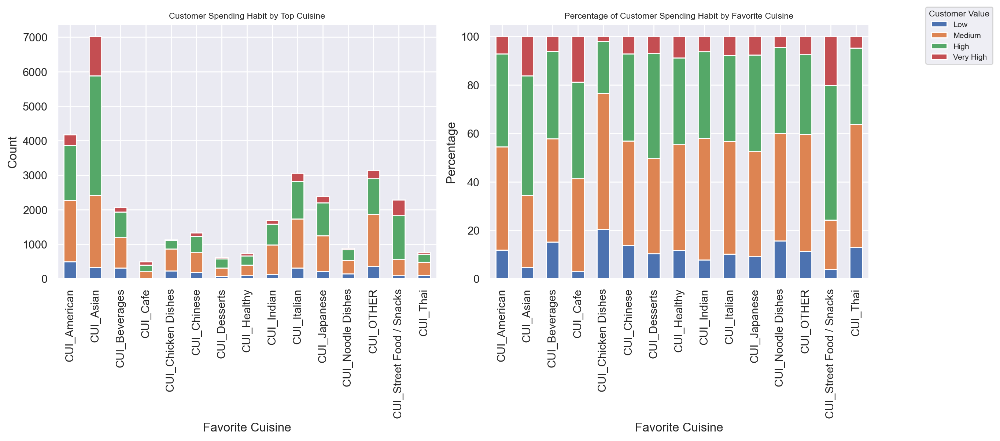

In [78]:
sns.set()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

customer_value_by_favorite_cuisine = customers_eda.groupby(['top_cuisine', 'spending_habit'], observed=False).size().unstack()
customer_value_by_favorite_cuisine_proportions = customer_value_by_favorite_cuisine.div(customer_value_by_favorite_cuisine.sum(axis=1), axis=0) * 100

customer_value_by_favorite_cuisine.plot(kind='bar', stacked=True, ax = ax1, legend=False)
ax1.set_title("Customer Spending Habit by Top Cuisine")
ax1.set_xlabel("Favorite Cuisine")
ax1.set_ylabel("Count")

customer_value_by_favorite_cuisine_proportions.plot(kind='bar', stacked=True, ax = ax2, legend=False)
ax2.set_title("Percentage of Customer Spending Habit by Favorite Cuisine")
ax2.set_xlabel("Favorite Cuisine")
ax2.set_ylabel("Percentage")

handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Customer Value", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<a class="anchor" id="chapter2"></a>

# 2. Data Preprocessing

</a>

<a class="anchor" id="sub-section-2_1"></a>

## 2.1. Coherence Fix

</a>

From the exploratory data analysis, we have found the following inconsistencies which we now have to deal with:
- Inconsistency between the sum of days column and hour coloumn -- these should be the same
- 18 cases where product_count is 0 but vendor_count is superior to 0
- 138 cases where a profile is created but no info
- Do we have any others?

**Inconsistency between hours of the day and day of the week**

In [79]:
# Create a copy of the dataset 
customers_days_hour_check = customers.copy()

In [80]:
# Calculate total orders
customers_days_hour_check['sum of orders by week']=customers_days_hour_check[days_columns].sum(axis=1)
customers_days_hour_check['sum of orders by hour']=customers_days_hour_check[hour_columns].sum(axis=1)

# Calculate the difference
difference = customers_days_hour_check['sum of orders by week'] - customers_days_hour_check['sum of orders by hour']

# Find rows with differences
rows_with_difference = customers_days_hour_check[difference != 0]
print(rows_with_difference)

            customer_region  customer_age  vendor_count  product_count  \
customer_id                                                              
ae38da6386             8670          21.0             2              3   
a21a839c77             4140          19.0             1              4   
9237d23413             8670          22.0             3              4   
8c6ffd7357             4660          25.0             3              4   
67c6c9f9c4             4660          24.0             1              3   
...                     ...           ...           ...            ...   
37b72b449d             2360          23.0             1              4   
ac382ddfd1                -          28.0             1              2   
96f1fc25e3             8670          25.0             2              2   
d7c7face7e             2440          26.0             1              1   
6624e03cdd             8670          28.0             1              2   

             is_chain  first_order  l

In [81]:
# Input the difference in HR_0 and make the changes to customers data frame
# This will also deal with missing values for HR_0
customers_days_hour_check['HR_0'] = customers_days_hour_check['HR_0'].fillna(difference)
customers['HR_0'] = customers_days_hour_check['HR_0']

In [82]:
# Check the total sums for validation
hr_column_sums = customers[hour_columns].sum()
days_column_sums = customers[days_columns].sum()
check = hr_column_sums.sum() - days_column_sums.sum()
print("Check after HR_0 modification:", check)

Check after HR_0 modification: 0.0


**Inconsistency with product count**

In [83]:
customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity,active_period,total_spent,spending_habit,top_cuisine,total_number_of_orders,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,city,promo_used
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aed85972bb,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Young Adults (20-29),NaN,0.0,2.56,Low,CUI_Italian,1,0,0,1,0,0,0,0,1,city_4,YES
b2ebe2e6e0,4660,43.0,1,0,0,6.0,6,-,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Middle-Aged (40-49),NaN,0.0,6.74,Medium,CUI_Italian,1,0,0,1,0,0,1,0,0,city_4,NO
6f723d9894,4660,36.0,1,0,0,13.0,13,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.77,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,7.77,Medium,CUI_Italian,1,0,0,1,0,0,1,0,0,city_4,YES
9d74f2ac81,4660,27.0,1,0,0,19.0,19,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,19.03,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,19.03,Medium,CUI_Indian,1,0,1,0,0,0,0,1,0,city_4,YES
27b7eed8fa,4660,35.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,4.94,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,4.94,Low,CUI_Italian,1,0,0,1,0,0,0,1,0,city_4,YES
6c9e68b2e7,4660,22.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,22.24,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,22.24,Medium,CUI_OTHER,1,0,0,1,0,0,0,1,0,city_4,YES
c0b330c4df,4660,27.0,1,0,0,23.0,23,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,14.42,0.0,0.0,0.00,0.0,0.0,0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,14.42,Medium,CUI_Italian,1,1,0,0,0,0,1,0,0,city_4,YES
68c4faeecb,4660,25.0,1,0,0,26.0,26,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.75,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29),NaN,0.0,12.75,Medium,CUI_Italian,1,0,1,0,0,0,0,0,1,city_4,YES
48e8abd5bf,4660,34.0,1,0,0,33.0,33,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.52,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,6.52,Low,CUI_Indian,1,0,1,0,0,1,0,0,0,city_4,YES


As mentionned earlier, these customers are all in the same region, have a vendor count of 1, but also have an active period of 0 (i.e. meaning that their first order was also their last one) and have a total number of orders equal to 1. Thus, we can assume that product count is 1 for these cases and we will change it accordingly.

In [84]:
customers.loc[(customers['product_count'] == 0) & (customers['vendor_count'] > 0), 'product_count'] = 1

In [85]:
# Check that the rows that meet the condition are changed
customers[(customers['product_count']==0) & (customers['vendor_count']>0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


**Cases with no activity**

For these customers, we will just remove them from the dataframe (not permanently delete) and perhaps use them at a later stage in the project. In order to identify these 138 cases, we will use vendor_count when it is equal to 0 and use as a reference to identify the cases.

In [86]:
# We will use this data frame for the next steps in preprocessing
customers = customers.copy()

In [87]:
customers = customers[customers['vendor_count'] != 0]

In [88]:
# Check if the rows have been removed 
customers[customers['vendor_count']==0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


<a class="anchor" id="sub-section-2_2"></a>

## 2.2. Feature Engineering

</a>

<a class="anchor" id="sub-section-2_2_1">

### 2.2.1. Features from EDA
    
</a>

In [89]:
customers_eda.columns 

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'age_group',
       'vendor_diversity', 'active_period', 'total_spent', 'spending_habit',
       'top_cuisine', 'total_number_of_orders', 'start_week', 'mid_week',
       'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening',
       'city', 'promo_used'],
      dt

Throught out the analysis of the variables, the columns below have been added to the customers_eda dataframe:
- 'age_group': categorise custumers into groups - teenagers, young adults, adults, middle-aged, older adults, senior
- 'vendor_diversity': categorise diversity in vendor choice - low diversity, moderate diversity, high diversity
- 'active_period': calculate the number of active days for each customer (i.e. the difference between last_order and first_order)
- 'total_spent': total spending for each customer across different cuisine types based on cuisine types
- 'spending_habit'
- 'top_cuisine': cuisine type on which each customer spends the most money most
- 'total_number_of_orders': total number of orders placed by each customer during the week, but this variable had an inconsistency, which is now valid
- 'start_week', 'mid_week', 'end_week'
- 'night', 'morning', 'midday', 'afternoon', 'evening'
- 'city': classifies each region code into 3 cities based on the number the code starts with
- 'promo_used': indicates if any type of promotion was used in the last order

Some of the features created may not be useful for segmentation, but rather be useful for customer profiling later on. We will add all the features deemed interesting for our segmentation to customers.

In [90]:
# Add features to customer

# Rename from 'total_spent' to 'monetary' for better comprehension
customers["monetary"] = customers[cuisine_columns].sum(axis=1)

# Rename from 'total_number_of_orders' to 'frequency' for better comprehension
customers["frequency"] = customers[days_columns].sum(axis=1)

customers["active_period"] = customers["last_order"] - customers["first_order"]

customers['start_week'] = customers['DOW_1'] + customers['DOW_2']
customers['mid_week'] = customers['DOW_3'] + customers['DOW_4']
customers['end_week'] = customers['DOW_5'] + customers['DOW_6'] + customers['DOW_0']

customers['night'] = customers[['HR_22', 'HR_23', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5']].sum(axis=1)
customers['morning'] = customers[['HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10']].sum(axis=1)
customers['midday'] = customers[['HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
customers['afternoon'] = customers[['HR_15', 'HR_16', 'HR_17']].sum(axis=1)
customers['evening'] = customers[['HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)

<a class="anchor" id="sub-section-2_2_2">

### 2.2.2. Creating New Features
    
</a>

In [91]:
# Log transformation of total_spent 
customers['log_monetary'] = np.log1p(customers["monetary"])

In [92]:
# Calculate the number of non-chain orders
customers['non_chain_orders'] = customers['frequency'] - customers['is_chain']

In [93]:
# Frequency: 
# Order frequency over active period
# customers['order_frequency'] = customers['frequency'] / customers['active_period']

# Monetary: 
# Average spending per order
customers['avg_spending_per_order'] = customers['monetary'] / customers['frequency']

# Average product count
customers['avg_product_count']= customers['product_count'] / customers['frequency']

In [94]:
# The dataset has 90 days of data so we will use 90 as the reference date to calculate recency
customers["recency"] = 90 - customers["last_order"]

<a class="anchor" id="sub-section-2_2_3">

### 2.2.3. Visually Exploring Newly Created Features
    
</a>

**Logarithm of total spent**

As seen in the EDA, total_spent is skewed and has outliers. Thus, applying a logarithmic transformation to total_spent can help reduce skewness, improve the distribution's symmetry, and mitigate the impact of outliers.

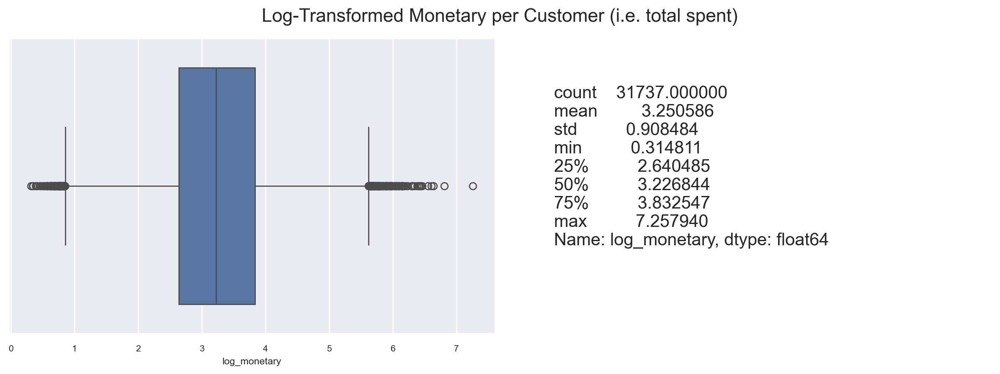

In [95]:
# Plot log-transformed boxplot and statistics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))
sns.boxplot(x=customers["log_monetary"], ax=ax1)
describe_log = customers["log_monetary"].describe()

# Add log-transformed statistics
ax2.text(0.1, 0.3, describe_log, fontsize=15)
ax2.axis("off")

plt.suptitle("Log-Transformed Monetary per Customer (i.e. total spent)", fontsize=16)
plt.tight_layout()
plt.show()

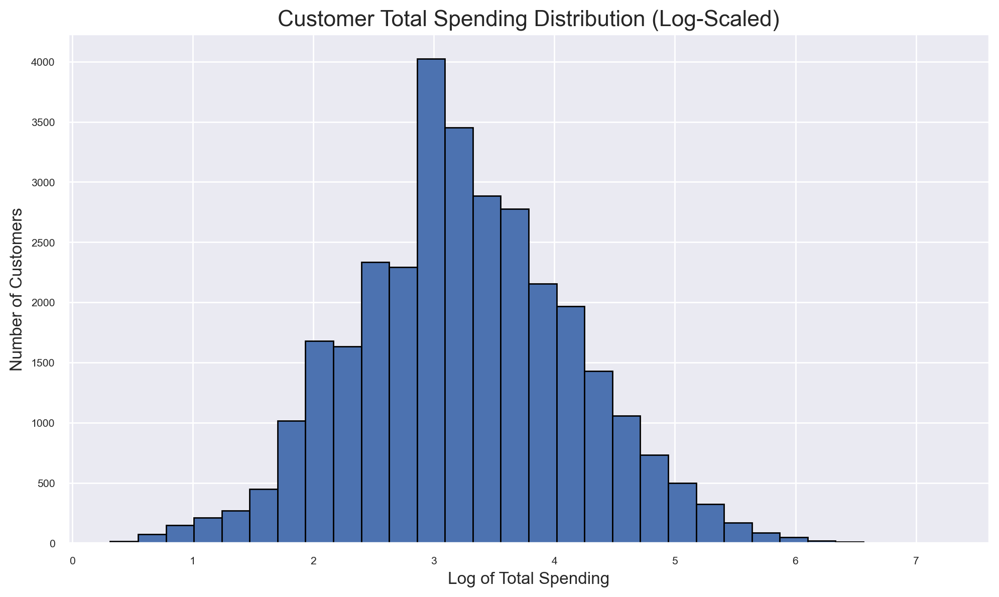

In [96]:
# Plot histogram for log-transformed total_spent
plt.figure(figsize=(10, 6))
plt.hist(customers['log_monetary'], bins=30, edgecolor="black")
plt.title("Customer Total Spending Distribution (Log-Scaled)", fontsize=16)
plt.xlabel("Log of Total Spending", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.tight_layout()
plt.show()

Now, the data is more symmetric and is almost normally distributed. Also, large values are compressed which reduces the impact of outliers.

**Chain & non-chain restaurants**

In order to have a better understanding of non_chain_orders, we can check if chains are preferred or not, or if the preference is balanced. As the below introduces an additional categorical variable which would not be as useful for clustering, we will create a copy of the dataframe.

In [97]:
# Define preference based on the comparison between chain and non-chain orders
def classify_preference(row):
    if row['is_chain'] > row['non_chain_orders']:
        return 'Chain Preferred'
    elif row['non_chain_orders'] > row['is_chain']:
        return 'Non-Chain Preferred'
    else:
        return 'Balanced'

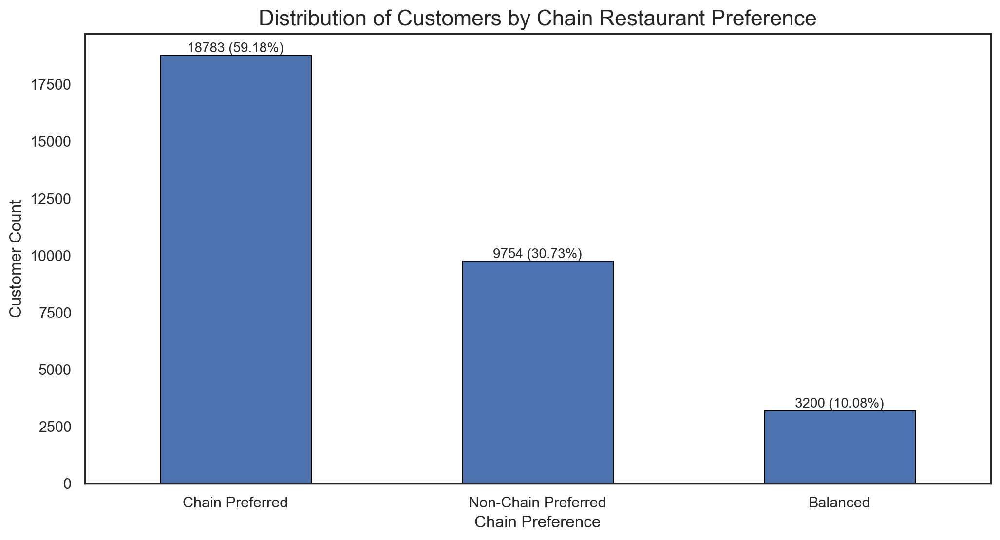

In [98]:
customers_chain_preference = customers.copy()

# Apply the function to classify each customer's preference
customers_chain_preference['chain_preference'] = customers_chain_preference.apply(classify_preference, axis=1)

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

chain_preference_count = customers_chain_preference['chain_preference'].value_counts()
chain_prefernce_percentage = customers_chain_preference['chain_preference'].value_counts(normalize=True) * 100

chain_preference_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(chain_preference_count, chain_prefernce_percentage)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers by Chain Restaurant Preference", fontsize=16)
plt.xlabel("Chain Preference", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

**Chain restaurant preferences:** Explore if chain vs. non-chain preference impacts spending

In [99]:
# Calculate average and median spending for each preference group
preference_spending = customers_chain_preference.groupby('chain_preference')['monetary'].agg(['mean', 'median'])
print("Average and Median Spending by Chain vs. Non-Chain Preference:")
print(preference_spending)

Average and Median Spending by Chain vs. Non-Chain Preference:
                          mean  median
chain_preference                      
Balanced             34.017994  24.635
Chain Preferred      34.887021  21.210
Non-Chain Preferred  46.805407  29.685


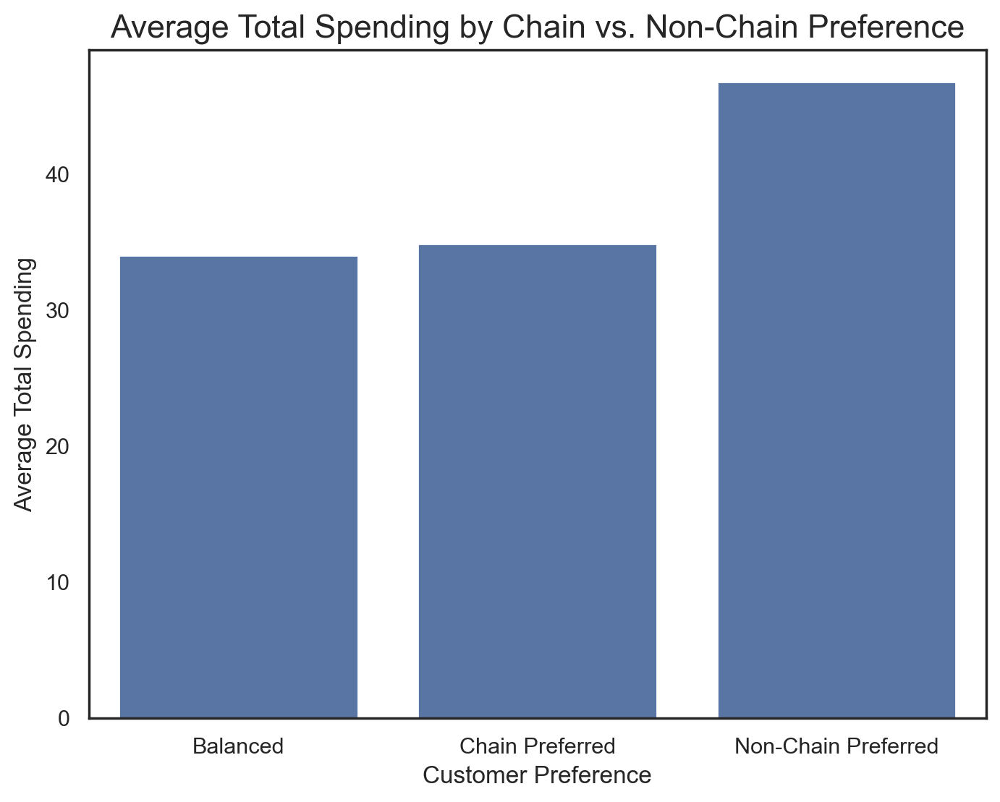

In [100]:
# Calculate average spending for each preference group
preference_spending_avg = customers_chain_preference.groupby('chain_preference')['monetary'].mean().reset_index()

# Plot the bar chart
plt.figure(figsize=(8, 6))
sns.barplot(x='chain_preference', y='monetary', data=preference_spending_avg)

# Add titles and labels
plt.title("Average Total Spending by Chain vs. Non-Chain Preference", fontsize=16)
plt.xlabel("Customer Preference", fontsize=12)
plt.ylabel("Average Total Spending", fontsize=12)

plt.show()

Customers who prefer non-chain restaurants have the highest average total spending, followed by those with chain-preferred, while balanced preferences customers show the lowest average spending. This suggests that **non-chain customers may be more willing to spend more per order or have a stronger preference for premium options.**

**Recency**

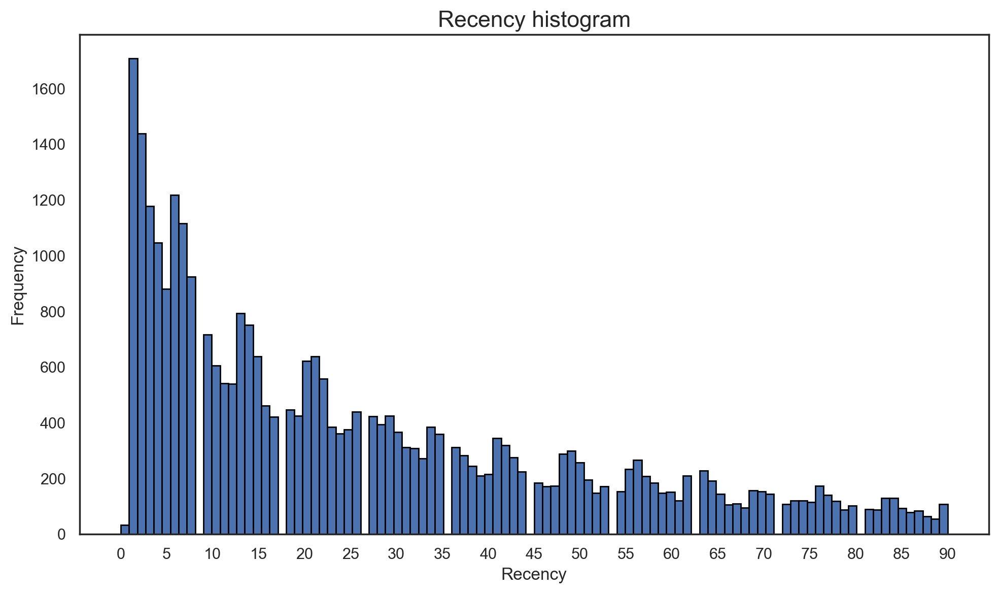

In [101]:
# Plot the histogram for average spending per order
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.hist(customers['recency'], bins=100, edgecolor="black")

plt.title("Recency histogram", fontsize=16)
plt.xlabel("Recency", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# create an array of tick positions starting from 0 to the max value of "vendor_count with intervals  of 2
tick_positions = np.arange(0, customers['recency'].max() + 1, 5)
plt.xticks(tick_positions)

plt.tight_layout()  
plt.show()

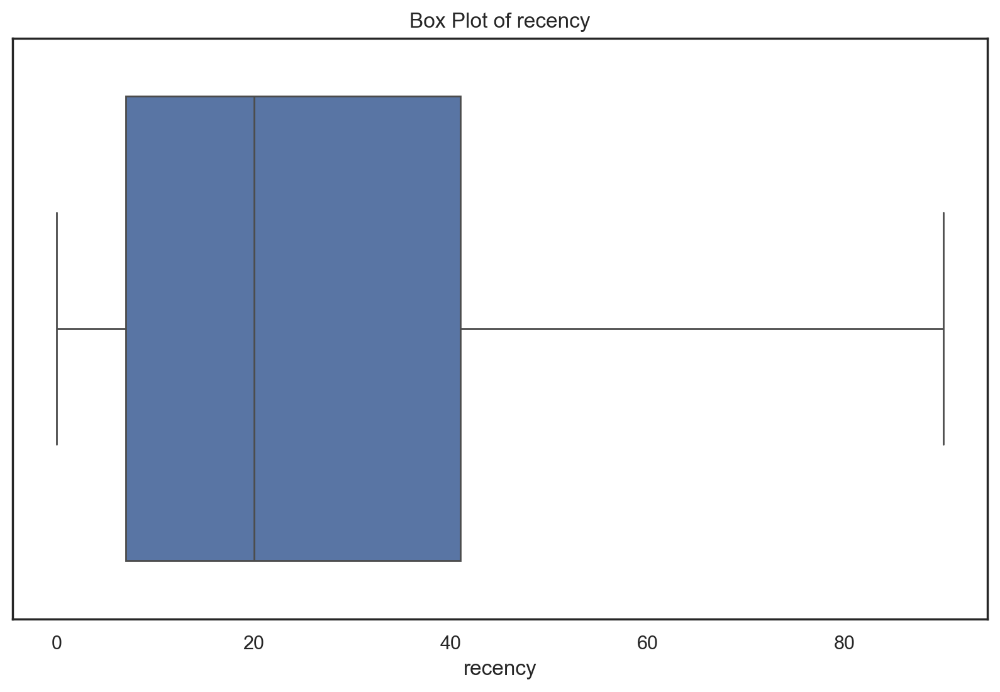

In [102]:
plt.figure(figsize=(10, 6))

sns.boxplot(x=customers['recency'])
plt.title("Box Plot of recency")
plt.xlabel("recency")
plt.show()

**Order frequency & Average spending per order**

When plotting the histogram for order_frequency, it gave an error because the new variable contained infinite numbers. This is likely due to dividing by zero or working with extremely large numbers. Here, we are checking these infinite values to determine the best course of action.

In [103]:
# Check the number of infinite values 
#print(np.isinf(customers['order_frequency']).sum())

# Check the number of active period equal to 0
#print(len(customers[customers['active_period'] == 0]))

# Check the number of active period equal to 0 & number of infinite values
#print(len(customers[(customers['active_period'] == 0) & (np.isinf(customers['order_frequency']))]))

We can see that the issue arises when active_period is equal to 0. Thus, we can replace the infinite numbers in order_frequency with 0s.

In [104]:
# Replace in negative/ positive infinite numbers with 0
#customers['order_frequency'] = customers['order_frequency'].replace([np.inf, -np.inf], 0)

In [105]:
# Check min & max values for tick positions
#print(f"Min value: {customers['order_frequency'].min()} & Max value: {customers['order_frequency'].max()}")

# Plot the histogram for active days ratio
#sns.set_style("white")
#plt.figure(figsize=(10, 6))

#plt.hist(customers['order_frequency'], bins=30, edgecolor="black")

#plt.title("Order Frequency Histogram", fontsize=16)
#plt.xlabel("Order Frequency", fontsize=12)
#plt.ylabel("Frequency", fontsize=12)

# Create an array of tick positions starting from 0 to the max value of "order_frequency" with intervals of 5
#tick_positions = np.arange(0, customers['order_frequency'].max() + 1, 0.2)
#plt.xticks(tick_positions)

#plt.tight_layout()
#plt.show()

In [106]:
#plt.figure(figsize=(10, 6))

#sns.boxplot(x=customers['order_frequency'])
#plt.title("Box Plot of Order Frequency")
#plt.xlabel("Age")
#plt.show()

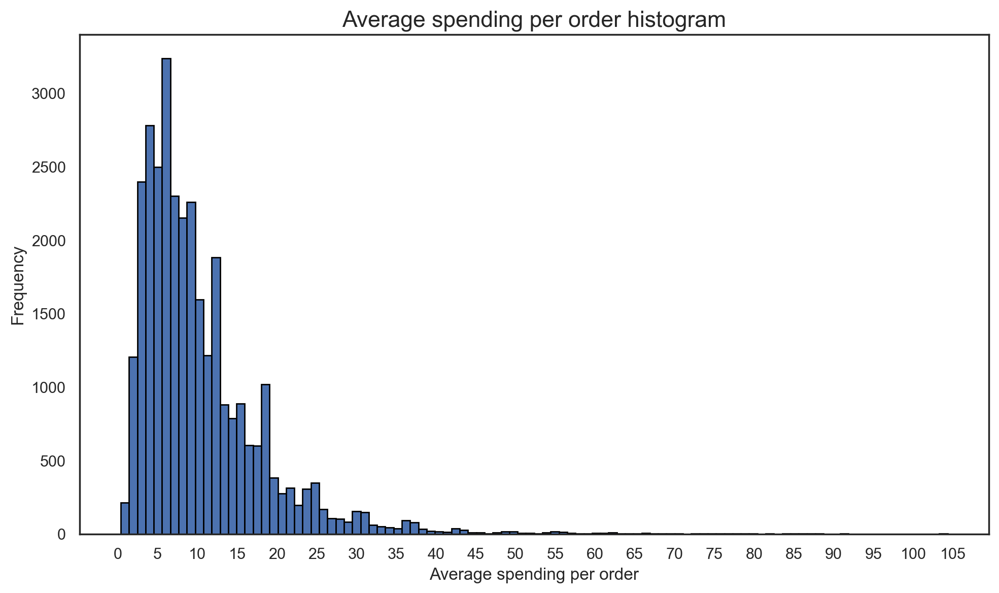

In [107]:
# Plot the histogram for average spending per order
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.hist(customers['avg_spending_per_order'], bins=100, edgecolor="black")

plt.title("Average spending per order histogram", fontsize=16)
plt.xlabel("Average spending per order", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# create an array of tick positions starting from 0 to the max value of "vendor_count with intervals  of 2
tick_positions = np.arange(0, customers['avg_spending_per_order'].max() + 1, 5)
plt.xticks(tick_positions)

plt.tight_layout()  
plt.show()

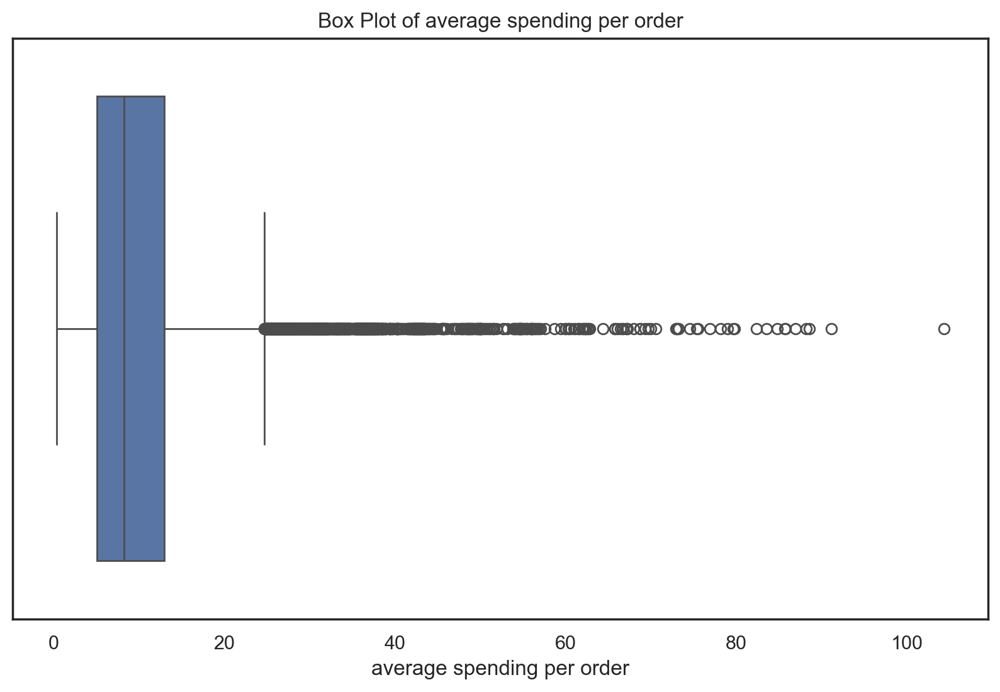

In [108]:
plt.figure(figsize=(10, 6))

sns.boxplot(x=customers['avg_spending_per_order'])
plt.title("Box Plot of average spending per order")
plt.xlabel("average spending per order")
plt.show()

In [109]:
# Scatter Plots for pairwise relationships

#plt.figure(figsize=(10, 6))
#plt.scatter(customers['order_frequency'], customers['avg_spending_per_order'], alpha=0.7, edgecolor='k')
#plt.title("Scatter Plot: Order Frequency vs Avg Spending Per Order")
#plt.xlabel("Order Frequency")
#plt.ylabel("Avg Spending Per Order")
#plt.grid(True, linestyle='--', alpha=0.7)
#plt.show()

In [110]:
# Split numeric and non numerical variables
non_metric_features = ['customer_region', 'last_promo', 'payment_method']
metric_features = [col for col in customers.columns if col not in non_metric_features]

In [111]:
# Check relationships between variables with scatter plots

# Setting pairplot
#sns.pairplot(customers[metric_features], diag_kind="hist")

# Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.tight_layout()
#plt.show()

<a class="anchor" id="sub-section-2_2_4">

### 2.2.4. Dropping Variables
    
</a>

In [112]:
customers.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'monetary', 'frequency',
       'active_period', 'start_week', 'mid_week', 'end_week', 'night',
       'morning', 'midday', 'afternoon', 'evening', 'log_monetary',
       'non_chain_orders', 'avg_spending_per_order', 'avg_product_count',
       'recency'],
      dtype='objec

In [113]:
# CUI_, DOW_, and HR_ from metric features 
columns_to_exclude = customers.columns[customers.columns.str.startswith('CUI_') | customers.columns.str.startswith('DOW_') | customers.columns.str.startswith('HR_')].tolist()

# Update metric_features
metric_features = [col for col in metric_features if col not in columns_to_exclude]

print(metric_features)

['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order', 'monetary', 'frequency', 'active_period', 'start_week', 'mid_week', 'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening', 'log_monetary', 'non_chain_orders', 'avg_spending_per_order', 'avg_product_count', 'recency']


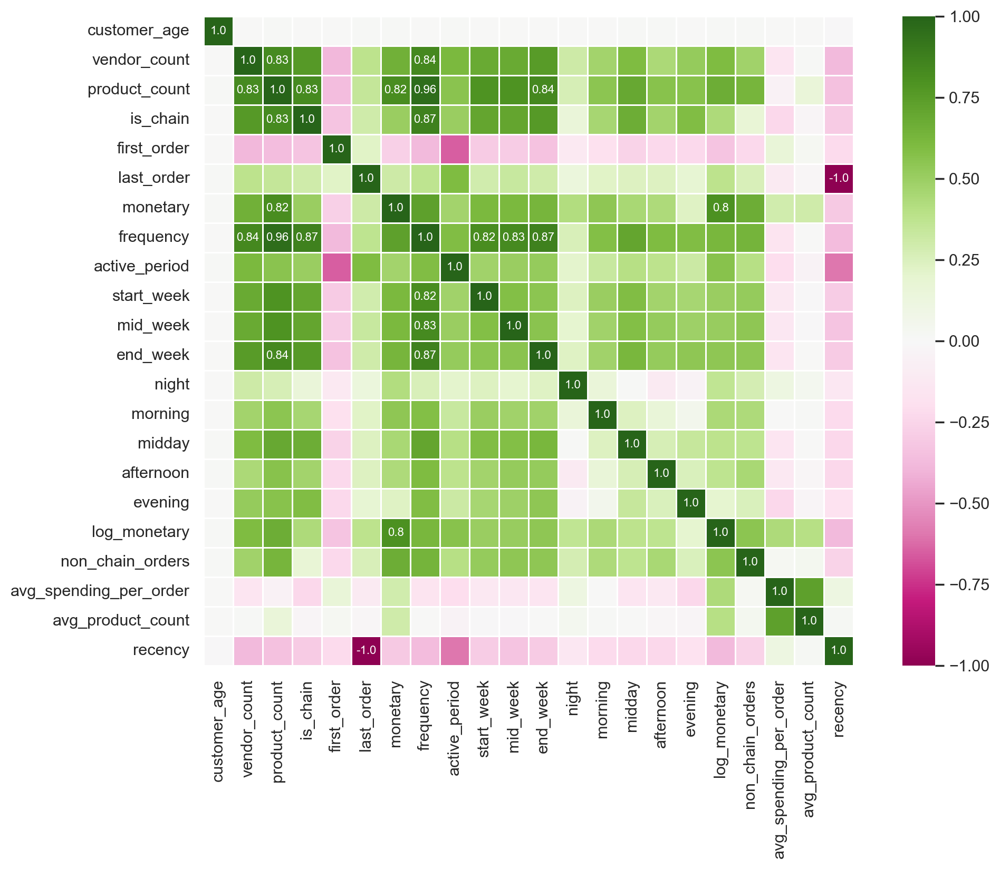

In [114]:
corr = customers[metric_features].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.8
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

fig = plt.figure(figsize=(12, 8))

sns.heatmap(data=corr, 
            annot=annot,
            fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5,
            cmap='PiYG',
            annot_kws={"size": 8})

plt.show()

When considering which features to keep, we set a threshold to > |0.90| to preserve necessary information from our features. We may lower this threshold if we deem it necessary later on. From the heatmap, we can see that highly correlated features:
- frequency and product_count (0.96)
- last_order and recency (-1)

From the correlation map, we should drop product_count and last_order (last order will be dropped later as wee need it to calculate active_period).

Regarding the monetary and log_total_spent, we know that log_total_spent is just a transformation of monetary, and thus contain the same information. We will test both variables and see which one give us the best results.

In [115]:
columns_to_exclude = ['product_count','log_monetary']

# Update metric_features
metric_features = [col for col in metric_features if col not in columns_to_exclude]

print(metric_features)

['customer_age', 'vendor_count', 'is_chain', 'first_order', 'last_order', 'monetary', 'frequency', 'active_period', 'start_week', 'mid_week', 'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening', 'non_chain_orders', 'avg_spending_per_order', 'avg_product_count', 'recency']


<a class="anchor" id="sub-section-2_3"></a>

## 2.3. Missing values

</a>

In [116]:
# number of missing values for each column
missing_values = customers.isnull().sum()
missing_values[missing_values>0]

customer_age     727
first_order      106
active_period    106
dtype: int64

<a class="anchor" id="sub-section-2_3_1"></a>

### 2.3.1. customer_age

</a>

The customer_age distribution is skewed, so we will impute the missing values with the median.

In [117]:
customers['customer_age'].median()
print(f'The median to be imputed is {customers["customer_age"].median()}.')

The median to be imputed is 26.0.


In [118]:
customers['customer_age'] = customers['customer_age'].fillna(customers['customer_age'].median())

<a class="anchor" id="sub-section-2_3_2"></a>

### 2.3.2. first_order

</a>

In [119]:
customers[customers["first_order"].isna()]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,log_monetary,non_chain_orders,avg_spending_per_order,avg_product_count,recency
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11.87,1,NaN,0,0,1,0,1,0,0,0,2.554899,1,11.87,1.0,90
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,14.49,1,NaN,0,0,1,0,0,0,1,0,2.740195,1,14.49,1.0,90
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.16,1,NaN,0,0,1,0,1,0,0,0,2.952825,0,18.16,1.0,90
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,6.02,1,NaN,0,0,1,0,0,1,0,0,1.948763,1,6.02,1.0,90
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,5.22,1,NaN,0,0,1,0,0,1,0,0,1.827770,0,5.22,1.0,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,18.04,1,NaN,0,0,1,0,0,1,0,0,2.946542,0,18.04,1.0,90
f6b6709018,8670,26.0,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,18.04,1,NaN,0,0,1,0,0,0,1,0,2.946542,1,18.04,1.0,90
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.79,1,NaN,0,0,1,1,0,0,0,0,2.933325,0,17.79,1.0,90


Since for the columns with first_order missing, the last_order is 0, we will imput 0 to first_order, meaning that tis orders will have been placed on the first day of the period and which also was their last order.

In [120]:
customers['first_order'] = customers['first_order'].fillna(0)

<a class="anchor" id="sub-section-2_3_3"></a>

### 2.3.3. active_period

</a>

active_period was created using the first_order column, which at the time had missing values.

We have treated those missing values, so we will drop the column and create it again.

In [121]:
# drop the column created before
customers = customers.drop(columns=['active_period'], errors='ignore')

# create the column again
customers["active_period"] = customers["last_order"] - customers["first_order"]

In [122]:
# Dropping last_order as flagged in correlation matrix
metric_features.remove('last_order')

<a class="anchor" id="sub-section-2_3_4"></a>

### 2.3.4. order_frequency

</a>

Similarly, since order_frequency was created with active_period, and thus, first_order, we just need to drop the column and calculate it again.

In [123]:
# drop the column created before
#customers = customers.drop(columns=['order_frequency'], errors='ignore')

# create the column again
#customers['order_frequency'] = customers['total_number_of_orders'] / customers['active_period']

In [124]:
# Check if all missing values have been dealt with 
#missing_values = customers.isnull().sum()
#missing_values[missing_values>0]

<a class="anchor" id="sub-section-2_5"></a>

## 2.5. Outliers

</a>

In [125]:
# Numerical columns to treat outliers
metric_features

['customer_age',
 'vendor_count',
 'is_chain',
 'first_order',
 'monetary',
 'frequency',
 'active_period',
 'start_week',
 'mid_week',
 'end_week',
 'night',
 'morning',
 'midday',
 'afternoon',
 'evening',
 'non_chain_orders',
 'avg_spending_per_order',
 'avg_product_count',
 'recency']

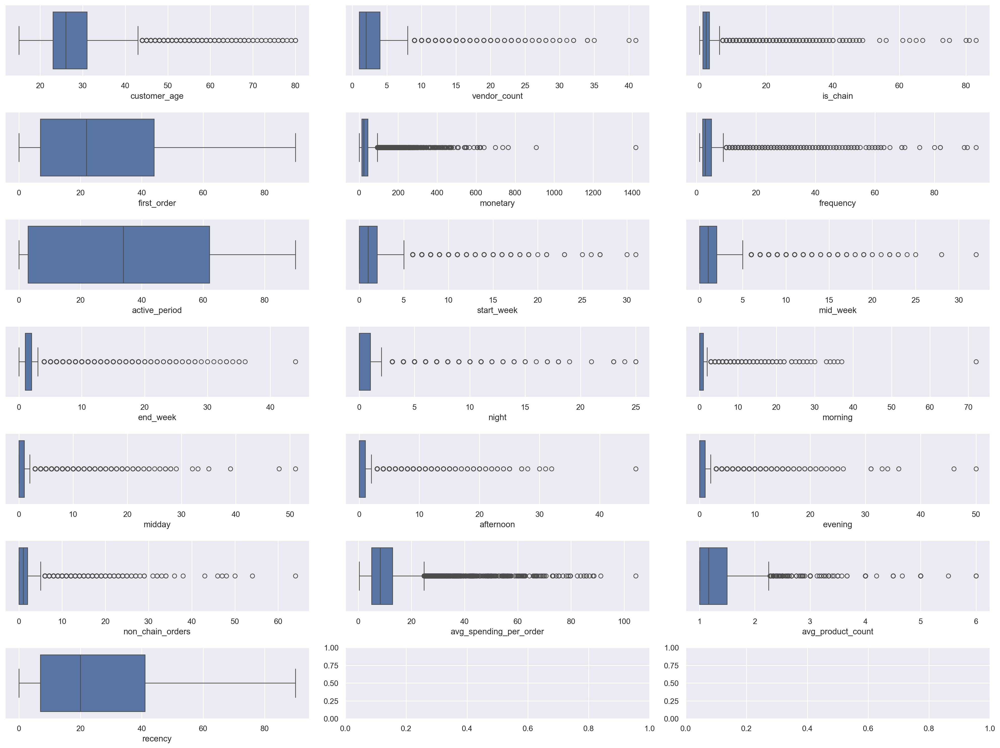

In [126]:
# Plot box plots for all numeric columns

sns.set()
fig, axes = plt.subplots(7, 3, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=customers[feat], ax=ax)

plt.tight_layout()
plt.show()

From the box-plots, we can see extreme outliers in several of the variables. But, first_order, active_period and recency do not seem to have any. Customer_age are all feasible, so we won't remove any data. For the rest of the variables, we will try to determine which method to use to remove outliers.

<a class="anchor" id="sub-section-2_5_1"></a>

### 2.5.1. IQR Method

</a>

In [127]:
# Calculate Q1, Q3 and IQR
q1 = customers[metric_features].quantile(0.25)
q3 = customers[metric_features].quantile(0.75)
iqr = q3 - q1

# Lower & upper limits
lower_lim = q1 - (1.5 * iqr)
upper_lim = q3 + (1.5 * iqr)

In [128]:
filters_iqr = (customers[metric_features] >= lower_lim) & (customers[metric_features] <= upper_lim)
filters_iqr_all = filters_iqr.all(axis=1)

In [129]:
customers_iqr = customers[filters_iqr_all]

In [130]:
print('Percentage of data kept after removing outliers:', 
      100 * (customers_iqr.shape[0] / customers.shape[0]))

Percentage of data kept after removing outliers: 56.84217159781958


Using the IQR method, more than 60% of data would be removed. Using this method is not the feasible and setting threshold manually would make more sense.

<a class="anchor" id="sub-section-2_5_2"></a>

### 2.5.2. Manual Threshold

</a>

In [131]:
filters_man = (
    (customers['vendor_count']<=30)
    &
    (customers['is_chain']<=40)
    &
    (customers['monetary']<=500)
    &
    (customers['frequency']<=45)
    &
    (customers['start_week']<=20)
    &
    (customers['mid_week']<=20)
    &
    (customers['end_week']<=30)
    &
    (customers['night']<=20)
    &
    (customers['morning']<=32)
    &
    (customers['midday']<=30)
    &
    (customers['afternoon']<=26)
    &
    (customers['evening']<=25)
    &
    (customers['non_chain_orders']<=30)
    &
    (customers['avg_spending_per_order']<=80)
    & 
    (customers['avg_product_count']<=3.8))

#(customers['order_frequency']<=1.75)

In [132]:
customers_manual = customers[filters_man]

In [133]:
print('Percentage of data kept after removing outliers:', 
      100 * (customers_manual.shape[0] / customers.shape[0]))

Percentage of data kept after removing outliers: 99.46434760689417


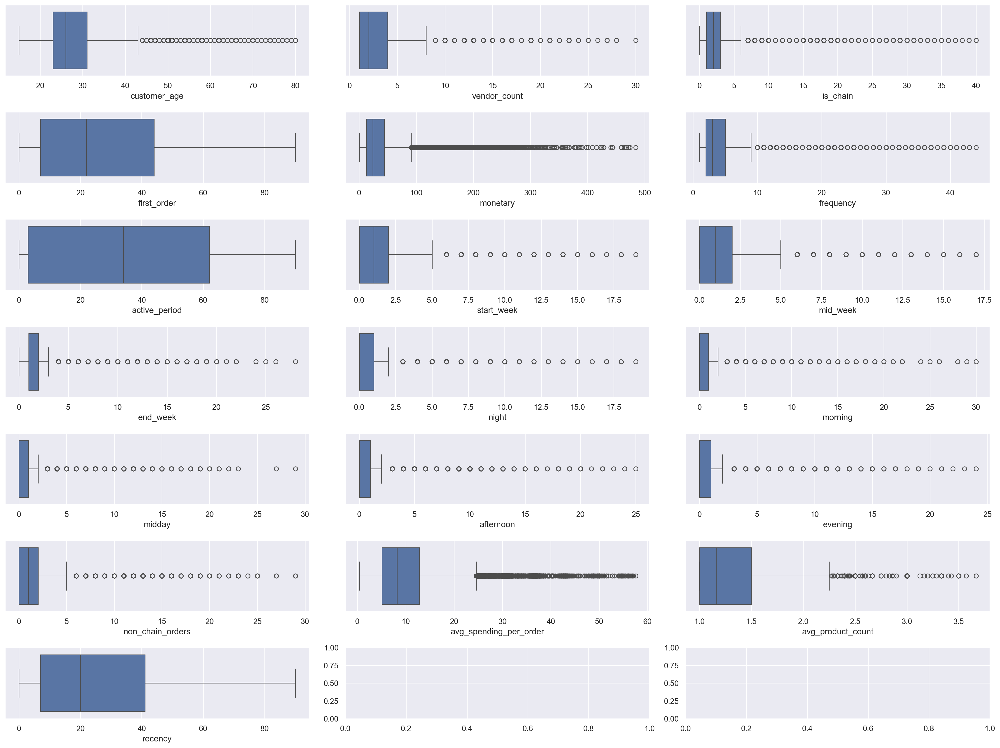

In [134]:
# Plot box plots after outliers are manually removed
sns.set()
fig, axes = plt.subplots(7, 3, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=customers_manual[feat], ax=ax) 

plt.tight_layout()
plt.show()

Setting manual thresholds, we can see that we remove less than 1% of our data, but we still have extreme outliers. We will try clipping extreme values to get a better distribution and reduce the effect of outliers.

<a class="anchor" id="sub-section-2_5_3"></a>

### 2.5.3. Clipping Outliers

</a>

In [135]:
customers[metric_features].quantile(0.975)

customer_age               46.000
vendor_count               11.000
is_chain                   13.000
first_order                83.000
monetary                  162.946
frequency                  18.000
active_period              85.000
start_week                  6.000
mid_week                    6.000
end_week                    8.000
night                       4.000
morning                     5.000
midday                      6.000
afternoon                   6.000
evening                     5.000
non_chain_orders            8.000
avg_spending_per_order     30.680
avg_product_count           2.200
recency                    82.000
Name: 0.975, dtype: float64

In [136]:
# Create a copy to check
customers_clipped = customers.copy()

In [137]:
clip_upper = {'vendor_count': 11, 'is_chain': 13, 'monetary': 162.946, 'frequency': 18, 'start_week': 6, 
              'mid_week': 6, 'end_week': 8, 'night': 4, 'morning': 5, 'midday': 6, 'afternoon': 6, 
              'evening': 5, 'non_chain_orders': 8, 'avg_spending_per_order': 30.680, 'avg_product_count': 2.2}

#'order_frequency': None

In [138]:
for column, upper_value in clip_upper.items():
    customers_clipped[column] = customers_clipped[column].clip(upper=upper_value)

In [139]:
clipping_stats = {}

for column, upper_value in clip_upper.items():
    # Skip columns without an upper limit
    if upper_value is not None:  
        # Count how many values were clipped
        num_clipped = (customers[column] > upper_value).sum()
        
        # Calculate the percentage of values clipped
        percentage_clipped = 100 * num_clipped / len(customers[column])
        
        clipping_stats[column] = percentage_clipped

for column, percentage in clipping_stats.items():
    print(f"{column}: {percentage:.2f}% of values were clipped.")

vendor_count: 1.96% of values were clipped.
is_chain: 2.34% of values were clipped.
monetary: 2.50% of values were clipped.
frequency: 2.35% of values were clipped.
start_week: 1.95% of values were clipped.
mid_week: 2.13% of values were clipped.
end_week: 2.36% of values were clipped.
night: 1.79% of values were clipped.
morning: 2.29% of values were clipped.
midday: 2.35% of values were clipped.
afternoon: 2.13% of values were clipped.
evening: 2.43% of values were clipped.
non_chain_orders: 2.34% of values were clipped.
avg_spending_per_order: 2.50% of values were clipped.
avg_product_count: 2.50% of values were clipped.


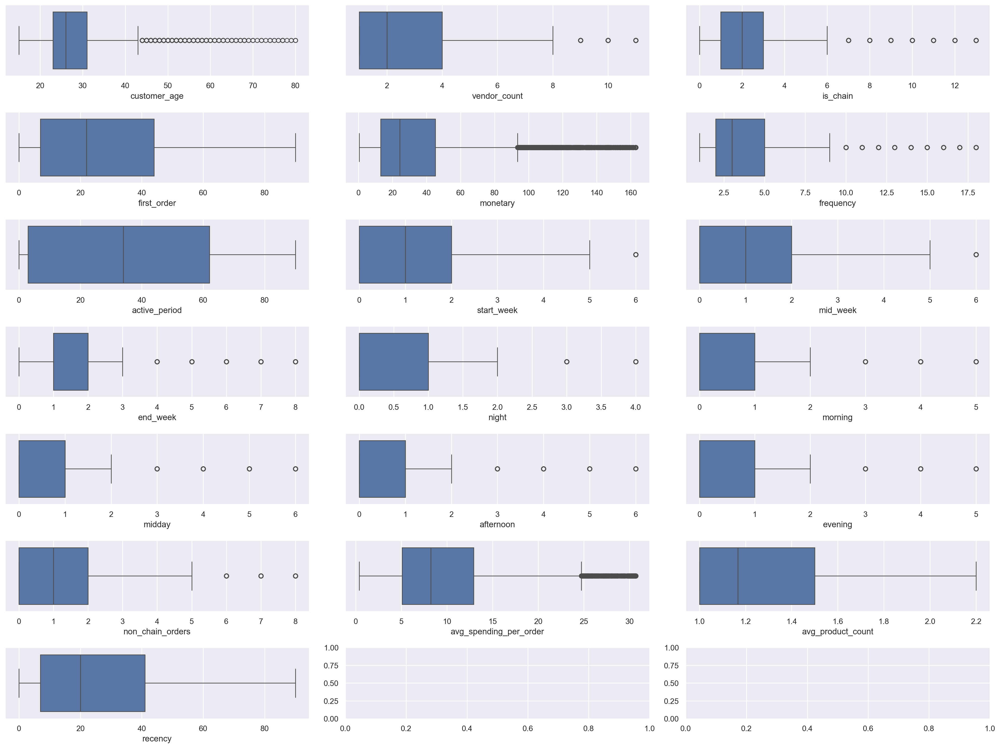

In [140]:
# Plot box plots after outliers are clipped
sns.set()
fig, axes = plt.subplots(7, 3, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=customers_clipped[feat], ax=ax) 

plt.tight_layout()
plt.show()

In [141]:
# Which method to keep?
customers = customers_clipped.copy()

<a class="anchor" id="sub-section-2_6"></a>

## 2.6. Data Normalization

</a>

In [142]:
customers[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,27.47,3.03,2.65,28.30,36.53,4.17,35.45,1.10,1.23,1.81,0.46,0.75,1.05,0.95,0.70,1.44,10.06,1.28,26.24
std,7.08,2.35,2.95,24.09,35.76,3.88,29.41,1.43,1.46,1.91,0.95,1.23,1.48,1.45,1.23,1.89,6.80,0.35,23.18
min,15.00,1.00,0.00,0.00,0.37,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.37,1.00,0.00
25%,23.00,1.00,1.00,7.00,13.02,2.00,3.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,5.07,1.00,7.00
50%,26.00,2.00,2.00,22.00,24.20,3.00,34.00,1.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,8.22,1.17,20.00
75%,31.00,4.00,3.00,44.00,45.18,5.00,62.00,2.00,2.00,2.00,1.00,1.00,1.00,1.00,1.00,2.00,12.92,1.50,41.00
max,80.00,11.00,13.00,90.00,162.95,18.00,90.00,6.00,6.00,8.00,4.00,5.00,6.00,6.00,5.00,8.00,30.68,2.20,90.00


<a class="anchor" id="sub-section-2_6_1"></a>

### 2.6.1. MinMax Scaling

</a>

In [143]:
customers_minmax = customers.copy()

In [144]:
# Use MinMaxScaler to scale the data
mm_scaler = MinMaxScaler()
mm_scaled_feat = mm_scaler.fit_transform(customers_minmax[metric_features])
mm_scaled_feat

array([[0.04615385, 0.1       , 0.07692308, ..., 0.46420323, 1.        ,
        0.98888889],
       [0.03076923, 0.1       , 0.15384615, ..., 0.30468492, 0.        ,
        0.98888889],
       [0.35384615, 0.        , 0.15384615, ..., 0.1395579 , 0.        ,
        0.98888889],
       ...,
       [0.13846154, 0.        , 0.07692308, ..., 0.57472781, 0.        ,
        1.        ],
       [0.29230769, 0.        , 0.        , ..., 0.38469152, 0.        ,
        1.        ],
       [0.23076923, 0.        , 0.        , ..., 0.24876278, 0.        ,
        1.        ]])

In [145]:
# See what the fit method is doing
print("Parameters fitted:\n")
pd.DataFrame([mm_scaler.data_min_, mm_scaler.data_max_], columns=metric_features, index=['min','max'])

Parameters fitted:



,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
min,15.0,1.0,0.0,0.0,0.370,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.37,1.0,0.0
max,80.0,11.0,13.0,90.0,162.946,18.0,90.0,6.0,6.0,8.0,4.0,5.0,6.0,6.0,5.0,8.0,30.68,2.2,90.0


In [146]:
# Replace original metric_features values with mm_scaled_feat values
customers_minmax[metric_features] = mm_scaled_feat

In [147]:
# Checking max and min of minmaxed variables
customers_minmax[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,0.19,0.20,0.20,0.31,0.22,0.19,0.39,0.18,0.21,0.23,0.11,0.15,0.17,0.16,0.14,0.18,0.32,0.23,0.29
std,0.11,0.24,0.23,0.27,0.22,0.23,0.33,0.24,0.24,0.24,0.24,0.25,0.25,0.24,0.25,0.24,0.22,0.29,0.26
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.12,0.00,0.08,0.08,0.08,0.06,0.03,0.00,0.00,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.15,0.00,0.08
50%,0.17,0.10,0.15,0.24,0.15,0.12,0.38,0.17,0.17,0.12,0.00,0.00,0.17,0.00,0.00,0.12,0.26,0.14,0.22
75%,0.25,0.30,0.23,0.49,0.28,0.24,0.69,0.33,0.33,0.25,0.25,0.20,0.17,0.17,0.20,0.25,0.41,0.42,0.46
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


<a class="anchor" id="sub-section-2_6_2"></a>

### 2.6.2. Standard Scaling

</a>

In [148]:
customers_standard = customers.copy()

In [149]:
ss_scaler = StandardScaler()
ss_scaled_feat = ss_scaler.fit_transform(customers_standard[metric_features])
ss_scaled_feat

array([[-1.33755534, -0.43710527, -0.55781328, ...,  0.64375886,
         2.64813034,  2.7071062 ],
       [-1.4787231 , -0.43710527, -0.21890944, ..., -0.06701043,
        -0.81304492,  2.7071062 ],
       [ 1.48579995, -0.86205273, -0.21890944, ..., -0.80277057,
        -0.81304492,  2.7071062 ],
       ...,
       [-0.49054875, -0.86205273, -0.55781328, ...,  1.13622568,
        -0.81304492,  2.75024387],
       [ 0.92112889, -0.86205273, -0.89671712, ...,  0.28947675,
        -0.81304492,  2.75024387],
       [ 0.35645783, -0.86205273, -0.89671712, ..., -0.31618394,
        -0.81304492,  2.75024387]])

In [150]:
# See what the fit method is doing
print("Parameters fitted:\n")
pd.DataFrame([ss_scaler.mean_, np.sqrt(ss_scaler.var_)], columns=metric_features, index=['mean','std'])

Parameters fitted:



,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
mean,27.474935,3.028610,2.645934,28.304440,36.525607,4.168132,35.450610,1.096323,1.233103,1.812711,0.458361,0.749252,1.04824,0.945111,0.702335,1.436714,10.060838,1.281885,26.244951
std,7.083770,2.353232,2.950689,24.088112,35.754642,3.877707,29.408517,1.433318,1.464815,1.906293,0.948283,1.229047,1.47621,1.451991,1.233224,1.892311,6.802489,0.346703,23.181599


In [151]:
customers_standard[metric_features] = ss_scaled_feat
customers_standard[metric_features].head()

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
customer_id,,,,,,,,,,,,,,,,,,,
1b8f824d5e,-1.337555,-0.437105,-0.557813,-1.175038,-0.213835,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,-0.609620,-0.710089,-0.650907,1.052254,-0.230784,0.643759,2.648130,2.707106
5d272b9dcb,-1.478723,-0.437105,-0.218909,-1.175038,-0.484290,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.759238,-0.067010,-0.813045,2.707106
f6d1b2ba63,1.485800,-0.862053,-0.218909,-1.175038,-0.764253,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.759238,-0.802771,-0.813045,2.707106
180c632ed8,-0.208213,-0.437105,-0.557813,-1.175038,-0.138880,-0.559127,-1.137446,-0.067203,-0.841815,-0.426330,-0.483359,-0.609620,0.644732,-0.650907,-0.569511,-0.230784,0.840746,0.629111,2.663969
4eb37a6705,-1.055220,-0.437105,-0.896717,-1.175038,0.529005,-0.559127,-1.137446,-0.067203,-0.841815,-0.426330,-0.483359,1.017657,-0.710089,-0.650907,-0.569511,0.297671,2.595986,2.648130,2.663969


In [152]:
customers_standard[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.76,-0.86,-0.90,-1.18,-1.01,-0.82,-1.21,-0.76,-0.84,-0.95,-0.48,-0.61,-0.71,-0.65,-0.57,-0.76,-1.42,-0.81,-1.13
25%,-0.63,-0.86,-0.56,-0.88,-0.66,-0.56,-1.10,-0.76,-0.84,-0.43,-0.48,-0.61,-0.71,-0.65,-0.57,-0.76,-0.73,-0.81,-0.83
50%,-0.21,-0.44,-0.22,-0.26,-0.34,-0.30,-0.05,-0.07,-0.16,-0.43,-0.48,-0.61,-0.03,-0.65,-0.57,-0.23,-0.27,-0.33,-0.27
75%,0.50,0.41,0.12,0.65,0.24,0.21,0.90,0.63,0.52,0.10,0.57,0.20,-0.03,0.04,0.24,0.30,0.42,0.63,0.64
max,7.41,3.39,3.51,2.56,3.54,3.57,1.85,3.42,3.25,3.25,3.73,3.46,3.35,3.48,3.48,3.47,3.03,2.65,2.75


<a class="anchor" id="sub-section-2_6_3"></a>

### 2.6.3. Comparing MinMax and Standard Scaling

</a>

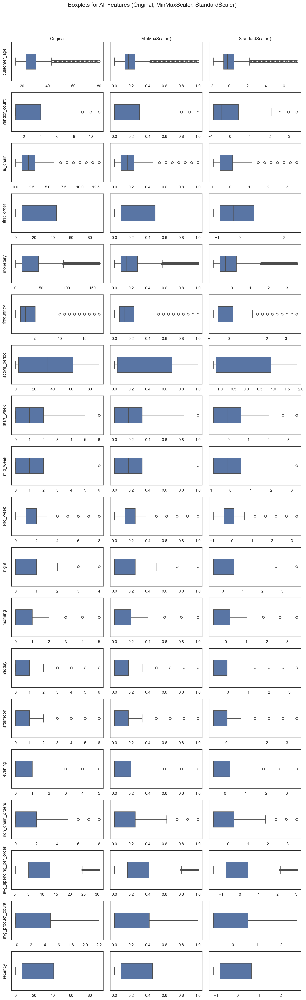

In [153]:
# Plotting boxplots for all features for original, MinMaxScaler, and StandardScaler
sns.set_style('white')

fig, axes = plt.subplots(len(metric_features), 3, figsize=(12, 2 * len(metric_features)), tight_layout=True)

for idx, feature in enumerate(metric_features):
    # Original
    sns.boxplot(customers, x=feature, ax=axes[idx][0], width=.4)
    # Only have the title on the first row
    axes[idx][0].set_title('Original' if idx == 0 else "")  
    axes[idx][0].set_ylabel(feature)

    # MinMax Scaled
    sns.boxplot(customers_minmax, x=feature, ax=axes[idx][1], width=.4)
    axes[idx][1].set_title('MinMaxScaler()' if idx == 0 else "")

    # Standard Scaled
    sns.boxplot(customers_standard, x=feature, ax=axes[idx][2], width=.4)
    axes[idx][2].set_title('StandardScaler()' if idx == 0 else "")

# Remove x-axis labels
for ax in axes.flat:
    ax.set_xlabel(None)

fig.suptitle('Boxplots for All Features (Original, MinMaxScaler, StandardScaler)', fontsize=16, y=1.02)

plt.show()

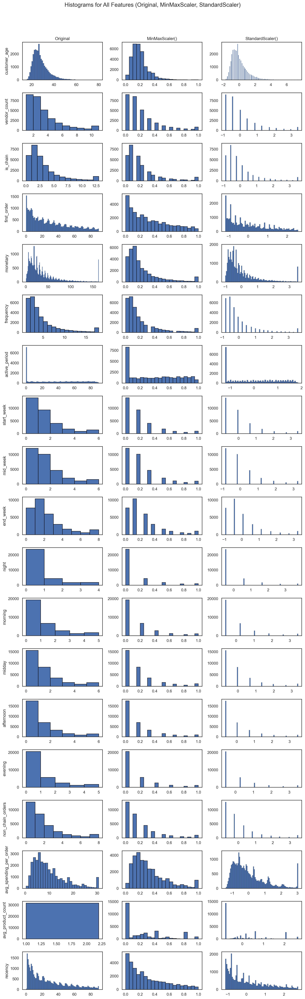

In [154]:
# Plotting histograms for all features for original, MinMaxScaler, and StandardScaler
# Same code, but this time it is adjusted for histograms
sns.set_style('white')

fig, axes = plt.subplots(len(metric_features), 3, figsize=(12, 2 * len(metric_features)), tight_layout=True)

for idx, feature in enumerate(metric_features):
    # Original
    sns.histplot(customers[feature], ax=axes[idx][0], binwidth=1, edgecolor="black", alpha = 1)
    axes[idx][0].set_title('Original' if idx == 0 else "")
    axes[idx][0].set_ylabel(feature)

    # MinMax Scaled
    sns.histplot(customers_minmax[feature], ax=axes[idx][1],binwidth=0.05, edgecolor="black", alpha = 1)
    axes[idx][1].set_title('MinMaxScaler()' if idx == 0 else "")
    axes[idx][1].set_ylabel("")

    # Standard Scaled
    sns.histplot(customers_standard[feature], ax=axes[idx][2], binwidth=0.05, edgecolor="black", alpha = 1)
    axes[idx][2].set_title('StandardScaler()' if idx == 0 else "")
    axes[idx][2].set_ylabel("")

# Remove x-axis labels
for ax in axes.flat:
    ax.set_xlabel(None)

fig.suptitle('Histograms for All Features (Original, MinMaxScaler, StandardScaler)', fontsize=16, y=1.02)

plt.show()

As there are still outliers present in our dataset and some features are skewed, standard scaling may be the better option because it preserves the shape of the distribution and normalizes features relative to their standard deviation (i.e., to have a standard deviation of 1).

In [155]:
customers = customers_standard.copy()

<a class="anchor" id="chapter3"></a>

# 3. Data Segmentation

</a>

In [156]:
customers[metric_features].head()

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,active_period,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,non_chain_orders,avg_spending_per_order,avg_product_count,recency
customer_id,,,,,,,,,,,,,,,,,,,
1b8f824d5e,-1.337555,-0.437105,-0.557813,-1.175038,-0.213835,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,-0.609620,-0.710089,-0.650907,1.052254,-0.230784,0.643759,2.648130,2.707106
5d272b9dcb,-1.478723,-0.437105,-0.218909,-1.175038,-0.484290,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.759238,-0.067010,-0.813045,2.707106
f6d1b2ba63,1.485800,-0.862053,-0.218909,-1.175038,-0.764253,-0.559127,-1.171450,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.759238,-0.802771,-0.813045,2.707106
180c632ed8,-0.208213,-0.437105,-0.557813,-1.175038,-0.138880,-0.559127,-1.137446,-0.067203,-0.841815,-0.426330,-0.483359,-0.609620,0.644732,-0.650907,-0.569511,-0.230784,0.840746,0.629111,2.663969
4eb37a6705,-1.055220,-0.437105,-0.896717,-1.175038,0.529005,-0.559127,-1.137446,-0.067203,-0.841815,-0.426330,-0.483359,1.017657,-0.710089,-0.650907,-0.569511,0.297671,2.595986,2.648130,2.663969


We are going to segment our customers using two views. First, we are going to use RFM features to segment our customers in recency, frequency and monetary value. Second, we will segment customers using a ?? value approach. 

<a class="anchor" id="sub-section-3_1"></a>

## 3.1. RFM Value Segmentation

</a>

The primary aim is to understand and categorize customers based on their recent purchases, transaction frequency, and overall spending, allowing ABCDEats to implement effective marketing strategies.

recency: Days since last purchase. <br>
frequency: Number of purchases. <br>
monetary: Total spend. <br>

**RFM Score Calculation**

Assign scores (1-4) to each RFM metric for each customer:

| Metric    | Score Interpretation                  |
|-----------|---------------------------------------|
| Recency   | 4 = Very recent, 1 = Long ago         |
| Frequency | 4 = Very frequent, 1 = Rarely orders  |
| Monetary  | 4 = High spender, 1 = Low spender     |

In [166]:
rfm_features = ['recency', 'frequency', 'monetary']
customers_rfm = customers[rfm_features].copy()

In [167]:
# Define functions (may be useful to add in .py file & import all functions when needed) 

# Function to assign R score
def r_score(x, p, d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1

# Function to assign F and M scores
def fm_score(x, p, d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4

In [168]:
# Define quantiles for RFM scores
quantiles = {
    'recency': customers_rfm['recency'].quantile([0.25, 0.5, 0.75]).to_dict(),
    'frequency': customers_rfm['frequency'].quantile([0.25, 0.5, 0.75]).to_dict(),
    'monetary': customers_rfm['monetary'].quantile([0.25, 0.5, 0.75]).to_dict()
}

In [169]:
# Calculate R, F, and M scores
customers_rfm['R_score'] = customers_rfm['recency'].apply(r_score, args=('recency', quantiles))
customers_rfm['F_score'] = customers_rfm['frequency'].apply(fm_score, args=('frequency', quantiles))
customers_rfm['M_score'] = customers_rfm['monetary'].apply(fm_score, args=('monetary', quantiles))

# Combine R, F, and M scores into a single RFM score
customers_rfm['RFM_score'] = customers_rfm['R_score'].map(str) + customers_rfm['F_score'].map(str) + customers_rfm['M_score'].map(str)

# Display a sample of the dataframe with RFM scores
customers_rfm.sample(10)

,recency,frequency,monetary,R_score,F_score,M_score,RFM_score
customer_id,,,,,,,
9edb2db861,1.585527,-0.301243,0.000403,1,2,3,123
9cdd808dfe,-1.045871,-0.559127,-0.161534,4,1,3,413
6c39666ac0,1.456114,-0.817012,-0.847320,1,1,1,111
e053fdc866,-0.787045,2.535485,2.372682,3,4,4,344
053cfb4836,2.491418,-0.817012,-0.507783,1,1,2,112
638a0858e4,0.507085,-0.817012,-0.499393,2,1,2,212
ead7fe531a,0.593361,-0.559127,-0.583578,2,1,2,212
e56f537a78,-1.045871,-0.559127,-0.508902,4,1,2,412
082ec2af26,-0.959595,-0.043359,-0.206843,4,3,3,433


In [170]:
# Group by RFM score and calculate the average monetary value
rfm_table = customers_rfm.groupby('RFM_score').agg({
    'recency': 'mean',
    'frequency': 'mean',
    'monetary': 'mean'
}).round(2)
rfm_table

,recency,frequency,monetary
RFM_score,,,
111,1.62,-0.74,-0.82
112,1.60,-0.70,-0.51
113,1.59,-0.68,-0.15
114,1.53,-0.66,0.72
121,1.30,-0.30,-0.77
...,...,...,...
434,-0.96,0.10,0.94
441,-1.00,0.58,-0.71
442,-0.98,0.73,-0.48


Create customer segments based on RFM score

| **Segment Name**     | **Description**                                                                 | **RFM Score Characteristics**                           | **Recommended Actions**                                                                 |
|-----------------------|---------------------------------------------------------------------------------|--------------------------------------------------------|-----------------------------------------------------------------------------------------|
| **Champions**         | Most valuable customers; frequent, recent, and high spenders.                  | R: High (3-4), <br> F: High (3-4), <br> M: High (3-4)            | Retain with loyalty programs, exclusive deals, or premium services.                    |
| **Loyal Customers**   | Regular customers with good frequency and spending.                            | R: High (3-4), <br> F: High (3-4), <br> M: Moderate to High (3-4) | Provide early access to new products, upsell premium offerings, and maintain loyalty.  |
| **Potential Loyalists** | Recent customers with potential to become loyal if engagement improves.       | R: Moderate to High (3-4), <br> F: Moderate (2-3), <br> M: Moderate (2-3) | Encourage repeat purchases through personalized promotions and discounts.              |
| **At Risk**           | Previously valuable customers who have not purchased recently.                 | R: Low (1-2), <br> F: Moderate to High (2-4), <br> M: Moderate to High (2-4) | Re-engage with win-back campaigns, targeted promotions, or personalized offers.        |
| **Need Attention**    | Moderate recency but low frequency and spending.                               | R: Moderate (2-3), <br> F: Low (1-2), <br> M: Low (1-2)          | Use incentives, discounts, or targeted campaigns to improve engagement and spending.   |
| **Causal Shoppers**   | Infrequent buyers with low spending.                                           | R: Low (1-2), <br> F: Low (1-2), <br> M: Low (1-2)               | Test promotions, bundles, or explore reasons for low engagement.                       |
| **Lost Customers**    | Customers who haven't purchased in a long time and show minimal engagement.    | R: Low (1), <br> F: Low (1-2), <br> M: Low (1-2)                 | Send reactivation campaigns, or deprioritize if unlikely to re-engage.                 |

In [171]:
# Define a function to segment customers based on RFM scores
def segment_customer(row):
    if row['R_score'] == 4 and row['F_score'] == 4 and row['M_score'] == 4:
        return 'Champion'
    elif row['R_score'] >= 3 and row['F_score'] >= 3 and row['M_score'] >= 3:
        return 'Loyal Customer'
    elif row['R_score'] >= 3 and row['F_score'] >= 2 and row['M_score'] >= 2:
        return 'Potential Loyalist'
    elif row['R_score'] <= 2 and row['F_score'] >= 2 and row['M_score'] >= 2:
        return 'At Risk'
    elif row['R_score'] >= 2 and row['F_score'] <= 2 and row['M_score'] <= 2:
        return 'Need Attention'
    elif row['R_score'] <= 2 and row['F_score'] <= 2 and row['M_score'] <= 2:
        return 'Causal Shopper'
    elif row['R_score'] == 1 and row['F_score'] <= 2 and row['M_score'] <= 2:
        return 'Lost Customer'
    else:
        return 'Others'

In [172]:
# Apply the function to create a new column
customers_rfm['Segment'] = customers_rfm.apply(segment_customer, axis=1)

# Analyze the segments
print(customers_rfm['Segment'].value_counts())

Segment
Need Attention        7007
Loyal Customer        5065
Causal Shopper        4936
At Risk               4751
Others                3849
Potential Loyalist    3142
Champion              2987
Name: count, dtype: int64


In [173]:
customers_rfm.head()

,recency,frequency,monetary,R_score,F_score,M_score,RFM_score,Segment
customer_id,,,,,,,,
1b8f824d5e,2.707106,-0.559127,-0.213835,1,1,3,113,Others
5d272b9dcb,2.707106,-0.559127,-0.484290,1,1,2,112,Causal Shopper
f6d1b2ba63,2.707106,-0.559127,-0.764253,1,1,1,111,Causal Shopper
180c632ed8,2.663969,-0.559127,-0.138880,1,1,3,113,Others
4eb37a6705,2.663969,-0.559127,0.529005,1,1,4,114,Others


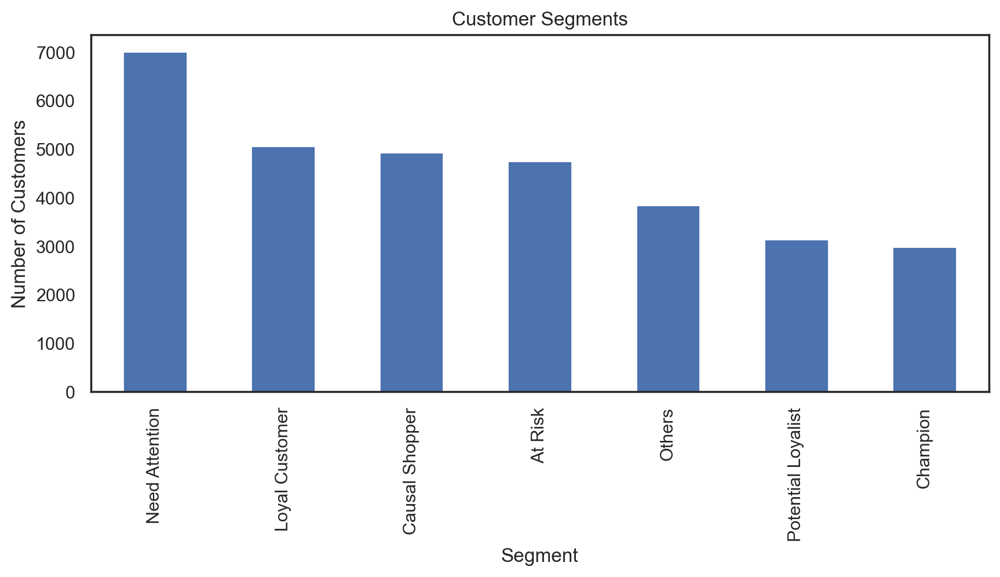

In [174]:
# Plot the segment distribution
customers_rfm['Segment'].value_counts().plot(kind='bar', figsize=(10, 4))
plt.title('Customer Segments')
plt.xlabel('Segment')
plt.ylabel('Number of Customers')
plt.show()

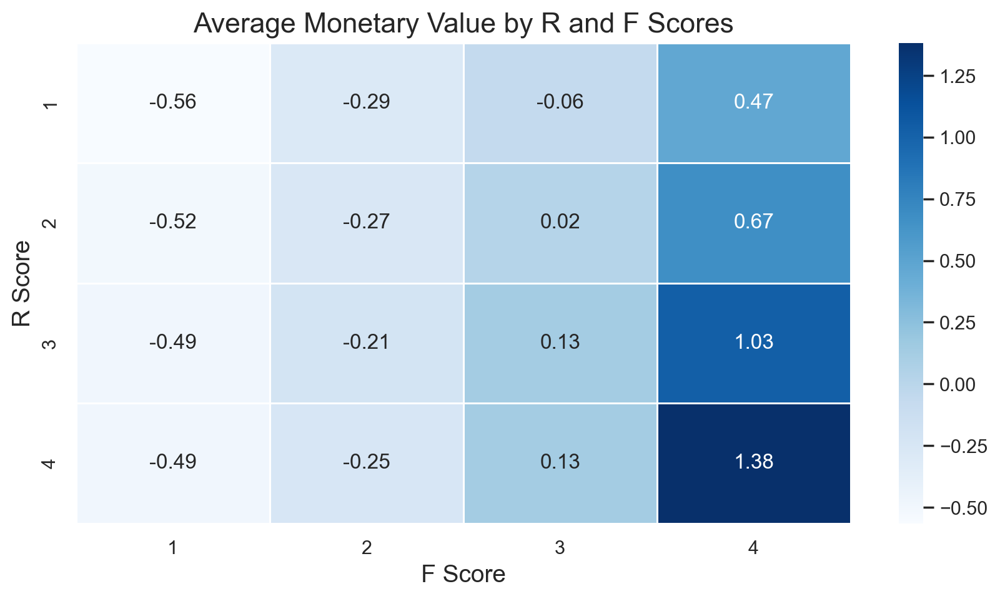

In [175]:
# Group data by R and F scores and calculate average monetary value
rfm_heatmap = customers_rfm.groupby(['R_score', 'F_score'])['monetary'].mean().unstack()

plt.figure(figsize=(10, 5))
sns.heatmap(rfm_heatmap, annot=True, fmt='.2f', cmap='Blues', linewidths=0.5)
plt.title('Average Monetary Value by R and F Scores', fontsize=16)
plt.xlabel('F Score', fontsize=14)
plt.ylabel('R Score', fontsize=14)
plt.show()

In [176]:
# prepare the RFM for clustering 
# this part is already in the pre-processing - check that it is correct

#import standard scaler
#from sklearn.preprocessing import StandardScaler

# Normalize the RFM data

# Select RFM scores
#rfm_data = customers[['R_score', 'F_score', 'M_score']]

# Normalize the RFM data
#scaler = StandardScaler()
#rfm_scaled = scaler.fit_transform(rfm_data)

Not sure if need to scale 'R_score', 'F_score', 'M_score' to start with?

In [177]:
customers.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,monetary,frequency,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,log_monetary,non_chain_orders,avg_spending_per_order,avg_product_count,recency,active_period
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,-1.337555,-0.437105,5,-0.557813,-1.175038,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,-0.213835,-0.559127,-0.764884,-0.841815,0.098248,-0.483359,-0.609620,-0.710089,-0.650907,1.052254,3.397189,-0.230784,0.643759,2.648130,2.707106,-1.171450
5d272b9dcb,8670,-1.478723,-0.437105,2,-0.218909,-1.175038,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.484290,-0.559127,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,3.006178,-0.759238,-0.067010,-0.813045,2.707106,-1.171450
f6d1b2ba63,4660,1.485800,-0.862053,2,-0.218909,-1.175038,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.764253,-0.559127,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,2.322388,-0.759238,-0.802771,-0.813045,2.707106,-1.171450
180c632ed8,4660,-0.208213,-0.437105,3,-0.557813,-1.175038,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,-0.138880,-0.559127,-0.067203,-0.841815,-0.426330,-0.483359,-0.609620,0.644732,-0.650907,-0.569511,3.483085,-0.230784,0.840746,0.629111,2.663969,-1.137446
4eb37a6705,4660,-1.055220,-0.437105,5,-0.896717,-1.175038,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.529005,-0.559127,-0.067203,-0.841815,-0.426330,-0.483359,1.017657,-0.710089,-0.650907,-0.569511,4.033178,0.297671,2.595986,2.648130,2.663969,-1.137446


In [178]:
rfm_data = customers_rfm[['R_score', 'F_score', 'M_score']]

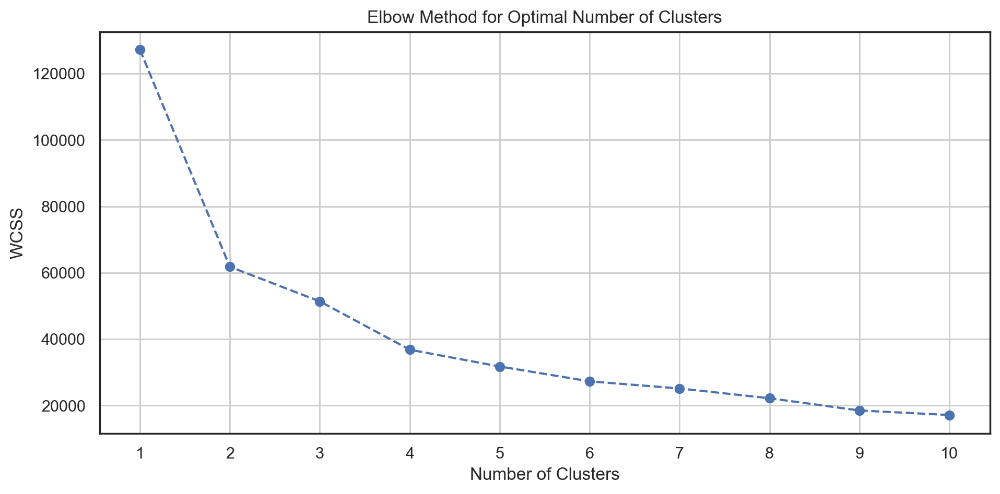

In [179]:
# Determine the Optimal Number of Clusters

# Calculate Within-Cluster Sum of Squares(WCSS) for different number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(rfm_data)
    wcss.append(kmeans.inertia_)

# Plot the elbow method graph
plt.figure(figsize=(11, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

In [180]:
# Perform K-Means clustering
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
customers_rfm['Cluster'] = kmeans.fit_predict(rfm_data)

In [181]:
# Calculate the average RFM values for each cluster
cluster_profiles = customers_rfm.groupby('Cluster').agg({
    'R_score': 'mean',
    'F_score': 'mean',
    'M_score': 'mean',
    'recency': 'mean',
    'frequency': 'mean',
    'monetary': 'mean'
}).reset_index()

cluster_profiles

,Cluster,R_score,F_score,M_score,recency,frequency,monetary
0,0,3.293723,3.621717,3.604023,-0.634793,1.021009,0.930301
1,1,1.400410,1.216136,1.000000,1.012552,-0.641725,-0.804874
2,2,1.460784,1.470085,2.548643,0.872812,-0.499065,-0.250828
3,3,3.438119,1.549635,1.952840,-0.724603,-0.462337,-0.478664


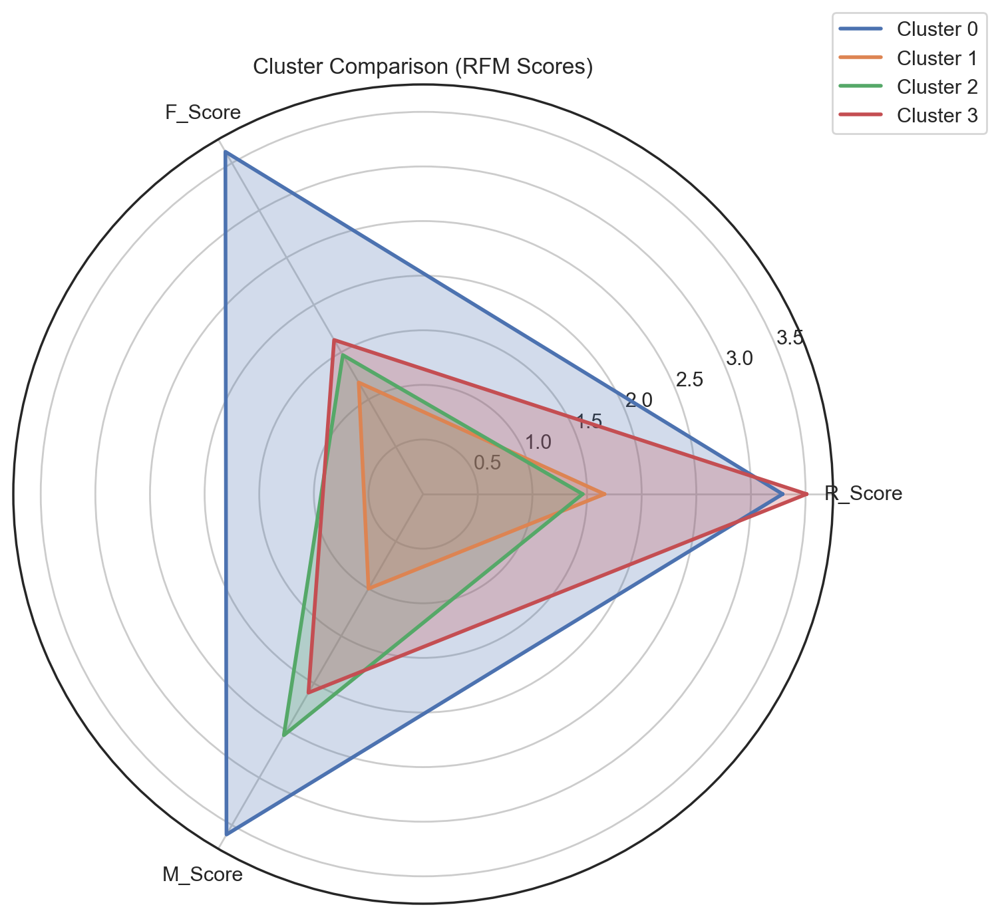

In [182]:
# Create the dataframe for the radar chart
cluster_means = {
    'Cluster': [0, 1, 2, 3],
    'R_Score': [3.29, 1.66, 1.46, 3.51],
    'F_Score': [3.62, 1.18, 1.47, 1.63],
    'M_Score': [3.60, 1.00, 2.55, 2.10]
}
df = pd.DataFrame(cluster_means)


# Prepare data for radar plot
categories = ['R_Score', 'F_Score', 'M_Score']
N = len(categories)
values = [df.iloc[i, 1:].values.tolist() for i in range(len(df))]
values = [v + [v[0]] for v in values]  # Close the circle

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Add each cluster to the radar plot
for i, v in enumerate(values):
    ax.plot(angles, v, linewidth=2, linestyle='solid', label=f'Cluster {i}')
    ax.fill(angles, v, alpha=0.25)

ax.set_thetagrids([a * 180/pi for a in angles[:-1]], categories)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.title("Cluster Comparison (RFM Scores)")
plt.show()

The RFM analysis revealed four distinct clusters that map onto classic RFM‐based customer segments. 

`Cluster 0`, with its high Recency, Frequency, and Monetary scores, aligns most closely with “Champions,” indicating that these are the top‐tier customers who purchase frequently, have done so recently, and spend significantly. Maintaining their loyalty through premium services and exclusive deals is crucial for sustaining their high engagement and preventing any attrition. <br>

On the opposite end, `Cluster 1` shows low Recency, Frequency, and Monetary values, suggesting a group of “Casual Shoppers.” These are customers who appear to be minimally engaged: they do not purchase often, have not bought recently, and exhibit limited spending. Targeted promotions or tailored offers aimed at boosting their purchasing frequency and value could help reawaken their interest.<br>

`Cluster 2` features comparatively low Recency and Frequency scores but a moderate‐to‐high Monetary value, indicating that these customers have spent more in the past but have lapsed in both engagement and timeliness of their purchases. This pattern mirrors an “At Risk” segment that could be recovered through win‐back campaigns and customized incentives, as they already possess a demonstrated propensity to spend when sufficiently motivated.<br>

Finally, `Cluster 3` has a high Recency score paired with moderate Frequency and Monetary levels, suggesting a set of “Potential Loyalists” who have purchased recently but still need nudges to become truly frequent or high‐value customers. Encouraging them to buy more often or move up to premium offerings can strengthen this relationship and transition them into the “Loyal Customers” or “Champions” category.

<a class="anchor" id="sub-section-3_2"></a>

## 3.2. Behaviour-Based Segmentation

</a>

By segmenting our customers based on behaviour, the aim is to understand how our customers interact with ABCDEat's service. We aim to identify usage patterns and engagement levels, using ... <br>

Time features: start_week, mid_week, end_week, night, morning, midday, afternoon, evening <br>
Vendor diversity: vendor_count <br>
Average spending per order (total spending/ total number of orders): avg_spending_per_order <br>
Average product per order (product count / total number of orders): avg_product_count <br>
Number of orders from (non) chain restaurant: is_chain, non_chain_orders

In [157]:
bhv_features = ['start_week', 'mid_week', 'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening', 
                'vendor_count', 'avg_spending_per_order', 'avg_product_count', 'is_chain', 'non_chain_orders']
customers_bhv = customers[bhv_features].copy()

In [201]:
n_feats = len(bhv_features)

som_data = customers_bhv[bhv_features].values

sm = MiniSom(75, 75, n_feats, learning_rate = 0.7, topology = "hexagonal", neighborhood_function = "gaussian", 
             activation_distance = "euclidean", random_seed = 42)

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4)) 
print("TE", np.round(sm.topographic_error(som_data),4)) 

# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

Before training:


/Applications/anaconda3/envs/DM2425/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


QE 0.7316
TE 0.9989
After training:
QE 0.6013
TE 0.3947


Quantization error is the average Euclidean distance between each input vector and its best matching unit (BMU) on the SOM. A lower QE shows that the SOM is better at mapping the input data.
- Decrease from 0.7316 before training to 0.6013 after training
- Improvements: increase number of iterations, tune learning rate and neighborhood function?

Topographic error measures how well the SOM preserves the topology of the data. Specifically, it checks the two closest neurons to a data point are neighbours on the grid. (values range from 0 to 1, with 0 being the perfect preservation of topology)
- Decrease from 0.9989 before training to 0.3947 after training.
- Improvements: increase grid size?, tune sigma (neighborhood radius) and learning rate

In [202]:
weights = sm.get_weights()
weights.shape

(75, 75, 13)

In [203]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=0.1)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)




    return sf 

**Component Planes**

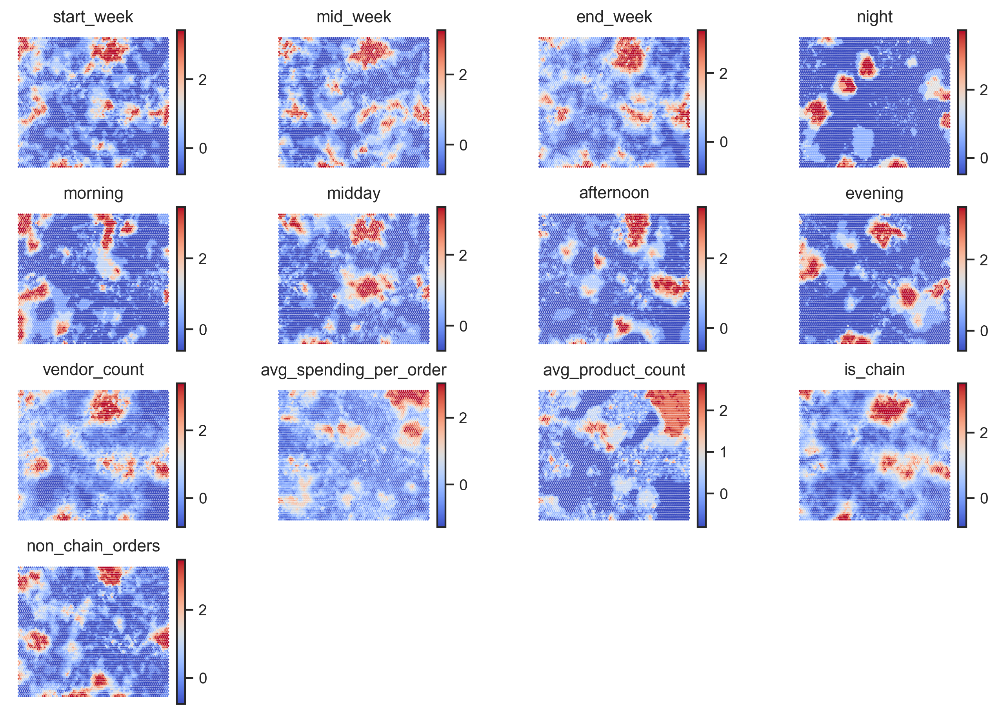

In [204]:
figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(4,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(bhv_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=bhv_features[cpi],
                    cmap=cm.coolwarm,
                    )

The more red, higher the value, and the more blue, the lower the value. Each hexagone is the same in each plot (i.e. bottom left for one, is the same bottom left for another). This allows us to see the profile and characteristics of each hexagone.

- Feature importance: 
    - In most features, we can distinguish clear clusters, especially in night, morning, afternoon, evening, avg_product_count, is_chain, non_chain_orders.
- Feature correlation (both globally and locally): 
    - avg_spending_per_order & avg_product_count seem to be correlated. Higher products in orders suggest higher spending per order.
    - start_week, mid_week, and end_week seem to all have similar patterns (periods of the week are not good distinguishers for clustering?). vendor_count also seems to be correlated with these features. 
- Data distribution: scattered
- Outlier detection: seem to have outliers in each feature.

**U-matrix** <br>
Encode each neuron in the output space with the **average distance** to its neighbors in the input space.

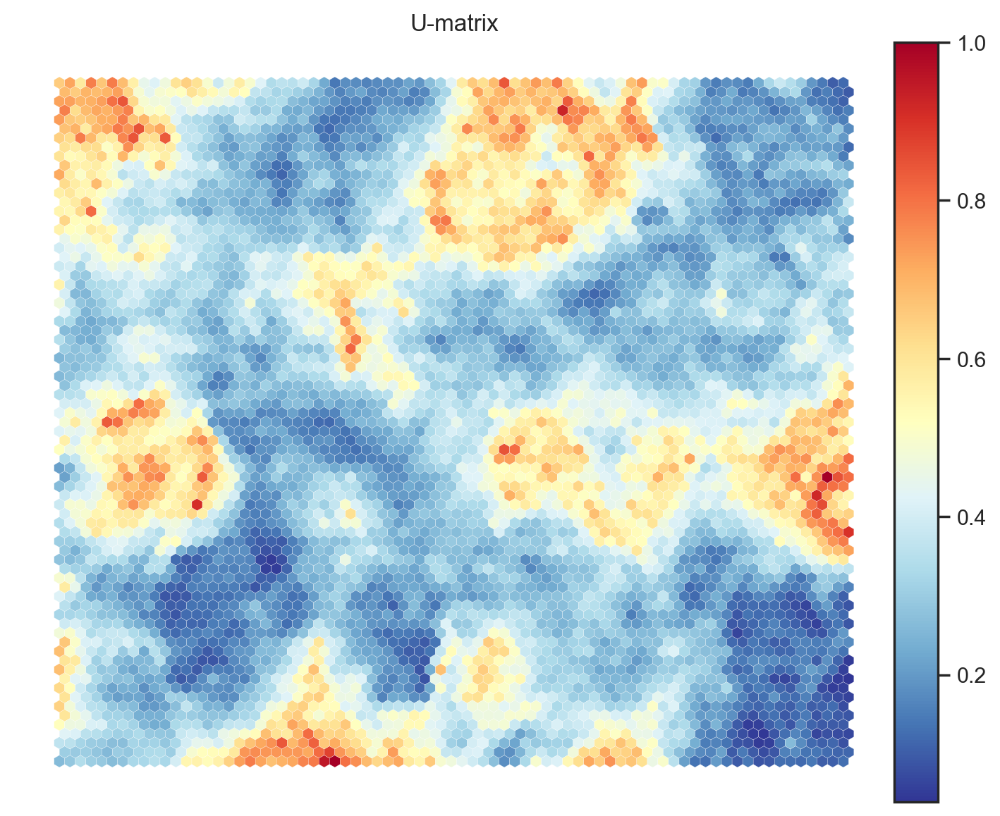

In [205]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=False
                    )

From the figure, we can see that except for a couple haxagons, most of them are light coloured, meaning that they are close to each other. There are a couple hexagons that are dark red, creating "limits" for clusters. We can maybe notice 3 or 4 clusters:
- bottom right
- bottom/ mid left
- top right
- top/ mid left

When comparing with component planes here are the characteristics of these clusters:
- bottom right: mid average spending per order (no distinct characteristics?)
- bottom/ mid left: low activity at night, morning, evening, afternoon/ higher activity in morning/ high-ish average spending per order/ low average product count/ 
- top right: high average spending per order and high product count per order
- top/ mid left: seem to shop more at midday (for lunch), mid average spending per order and average product per order

**Hit-map** <br>
Show the **frequency** of each Unit in the output map

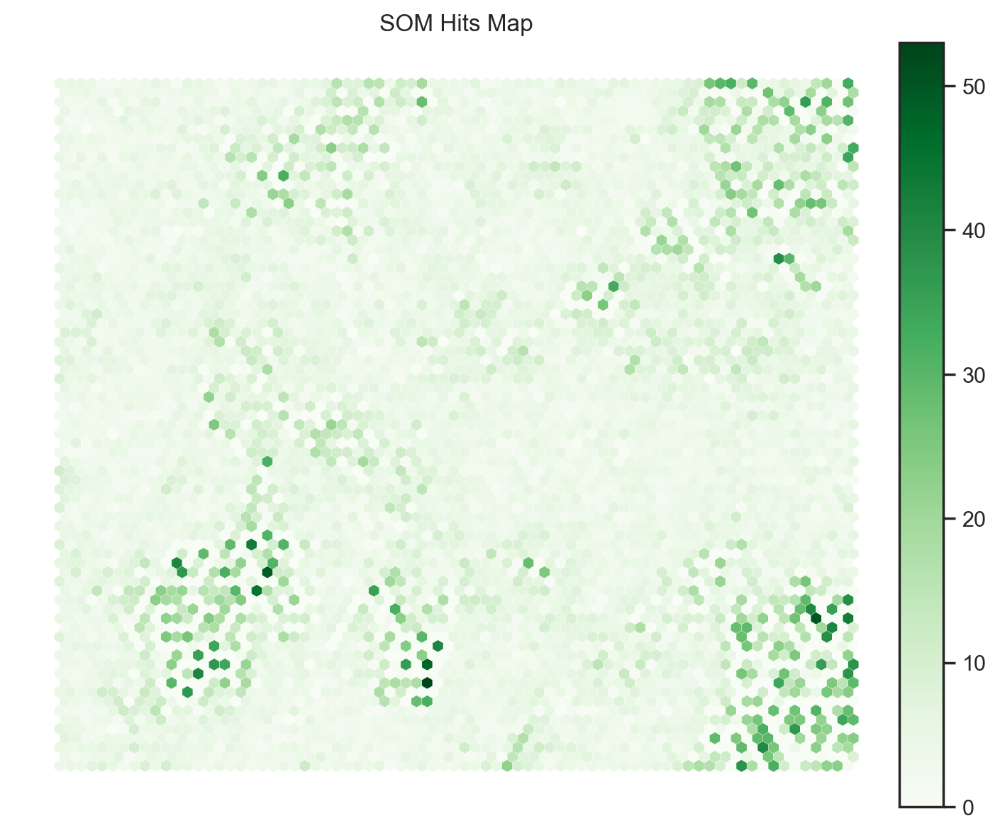

In [206]:
hitsmatrix = sm.activation_response(customers_bhv[bhv_features].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=False
                    )

As expected from the U-matrix, darker green hexagons roughly correspond to the clusters identified: bottom right, bottom/ mid left, top right and top/ mid left.

From the insights, we can create the following segments:

| **Segment Name**       | **Description**                                                                 | **Characteristics**                                                                                          | **Recommended Actions**                                                                 |
|-------------------------|---------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------|
| **Balanced Spenders**   | Customers with no distinct behavior, showing average spending patterns.         | Mid-average spending per order.                                                                              | General promotions applicable to all customers; further analysis needed for detailed segmentation. |
| **Morning Savers**      | Customers active in the morning and less at other times, with moderate spending. | Low activity at night, evening, and afternoon. High activity in the morning. High-ish spending per order. Low average product count. | Morning-specific deals or breakfast-focused promotions. Bundle offers to encourage larger orders.  |
| **High-Value Bulk Buyers** | High-spending customers who purchase in bulk.                                   | High average spending per order. High product count per order.                                               | Upsell premium items or offer loyalty rewards for frequent high-value purchases.                    |
| **Lunch-Time Regulars** | Customers active during midday, likely for lunch.                               | More activity at midday. Mid-average spending per order. Average product count per order.                    | Lunch-specific deals or promotions for office workers. Bundle discounts for midday meals.           |


**K-means SOM on top of SOM units**

In [207]:
# defining the number of clusters:
range_clusters = range(1, 11)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(customers_bhv[bhv_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

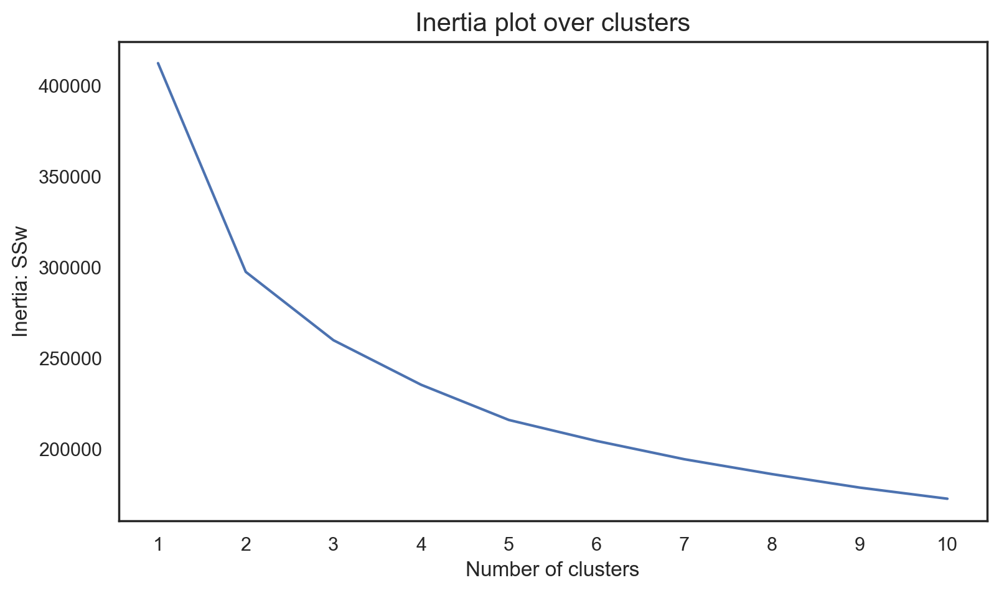

In [208]:
# Inertia plot

fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

4 or 5 seems to be the optimum number of clusters.

In [184]:
weights_flat = sm.get_weights().reshape((50*50),len(bhv_features))
weights_flat.shape

(2500, 13)

In [200]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

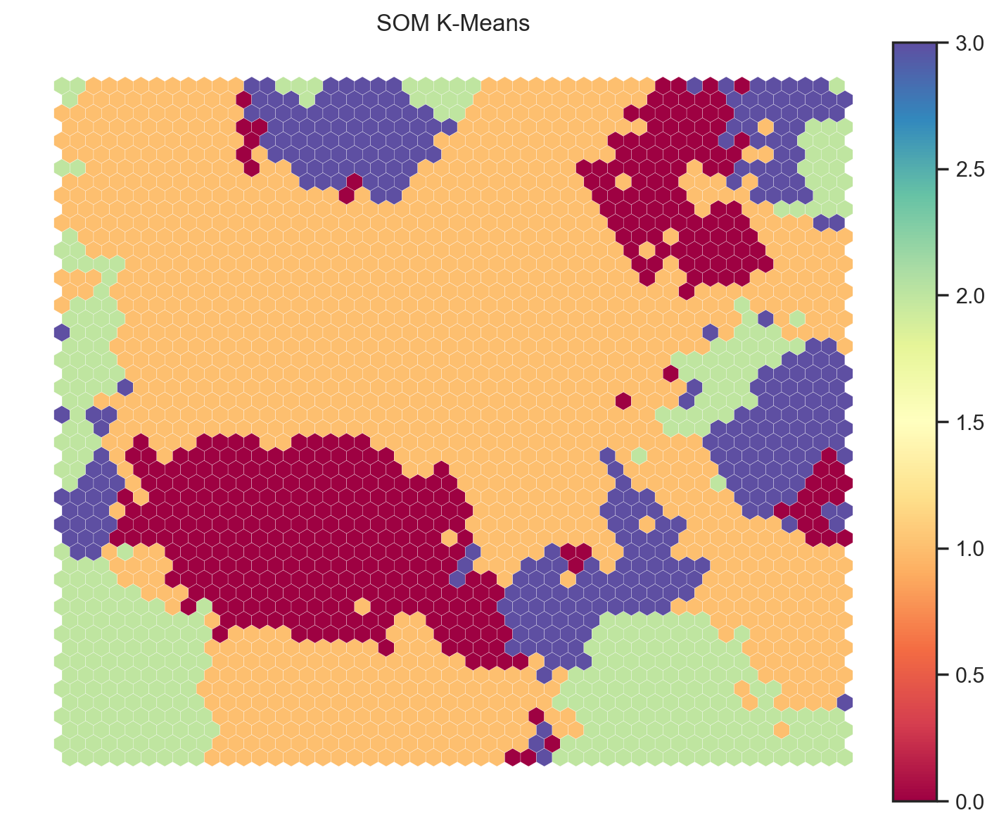

In [188]:
kmeans_matrix = nodeclus_labels.reshape((50,50))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

In [189]:
# Check the nodes and and respective clusters
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=bhv_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,vendor_count,avg_spending_per_order,avg_product_count,is_chain,non_chain_orders,label
0,3.328104,1.130202,2.788274,0.387618,3.002650,2.200184,-0.170761,3.096080,2.950928,-0.866457,-0.049423,3.378410,0.303309,2
1,1.629879,2.812185,3.045007,-0.078354,2.790387,2.752576,0.028022,3.445772,3.201436,-0.814338,0.187326,3.442614,0.541758,2
2,3.347555,3.120665,1.466160,-0.445165,3.415081,2.583860,2.087251,2.816981,3.288385,-0.814403,0.110286,3.507293,-0.419643,2
3,2.833488,1.431735,2.844882,-0.478125,2.499702,3.163755,2.961409,1.491963,2.785564,-0.393776,0.506233,3.508683,-0.238405,2
4,3.185090,2.665102,2.100238,-0.476127,3.376200,2.710019,2.779047,0.610793,0.835473,-0.341939,0.243898,3.501356,0.135690,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,2.748231,1.009399,0.581728,-0.481049,3.138707,-0.265819,2.895814,-0.518844,0.919856,-0.384604,-0.328548,2.214777,0.325838,2
2496,2.449516,2.954449,0.776044,-0.482701,2.958539,0.412666,3.429066,-0.348484,1.134099,-0.241101,-0.251224,3.089690,0.365177,2
2497,0.213376,1.689046,0.534127,-0.478772,3.033470,-0.441741,1.209415,-0.397019,1.320712,-0.239063,-0.057627,0.705346,0.945240,3
2498,1.496759,1.050025,0.332976,-0.472407,2.536302,-0.226565,1.210511,-0.229870,1.757140,1.420457,1.373931,0.963924,0.813401,3


In [192]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in customers_bhv[bhv_features].values])

print(bmu_index.shape)

bmu_index

(31737, 2)


array([[ 6, 20],
       [25, 27],
       [23, 26],
       ...,
       [28,  6],
       [19, 26],
       [13, 32]])

In [193]:
## This gets the cluster label from kmeans_matrix, i.e.
## if data row 0 has BMU at (37, 28) 
## it will get the label associated to node (37,28) using label associated to kmeans_matrix[37,28] above

som_final_labels = [kmeans_matrix[i[0]][i[1]] for i in bmu_index]

In [196]:
df_final = pd.concat([
                customers_bhv,
                pd.Series(som_final_labels, name='label', index=customers_bhv.index)
            ], axis=1
            )

df_final

,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,vendor_count,avg_spending_per_order,avg_product_count,is_chain,non_chain_orders,label
customer_id,,,,,,,,,,,,,,
1b8f824d5e,-0.764884,-0.841815,0.098248,-0.483359,-0.609620,-0.710089,-0.650907,1.052254,-0.437105,0.643759,2.648130,-0.557813,-0.230784,0
5d272b9dcb,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.437105,-0.067010,-0.813045,-0.218909,-0.759238,1
f6d1b2ba63,-0.764884,-0.841815,0.098248,-0.483359,0.204018,-0.032678,-0.650907,-0.569511,-0.862053,-0.802771,-0.813045,-0.218909,-0.759238,1
180c632ed8,-0.067203,-0.841815,-0.426330,-0.483359,-0.609620,0.644732,-0.650907,-0.569511,-0.437105,0.840746,0.629111,-0.557813,-0.230784,0
4eb37a6705,-0.067203,-0.841815,-0.426330,-0.483359,1.017657,-0.710089,-0.650907,-0.569511,-0.437105,2.595986,2.648130,-0.896717,0.297671,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,-0.764884,-0.841815,-0.426330,-0.483359,-0.609620,-0.032678,-0.650907,-0.569511,-0.862053,1.172977,-0.813045,-0.557813,-0.759238,1
f6b6709018,-0.764884,-0.841815,-0.426330,-0.483359,-0.609620,-0.710089,0.037802,-0.569511,-0.862053,1.172977,-0.813045,-0.896717,-0.230784,1
f74ad8ce3f,-0.764884,-0.841815,-0.426330,0.571179,-0.609620,-0.710089,-0.650907,-0.569511,-0.862053,1.136226,-0.813045,-0.557813,-0.759238,1


In [198]:
# Characterizing the final clusters
df_final[bhv_features+['label']].groupby('label').mean()

,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,vendor_count,avg_spending_per_order,avg_product_count,is_chain,non_chain_orders
label,,,,,,,,,,,,,
0,-0.384341,-0.415083,-0.406804,0.063183,-0.173879,-0.362978,-0.362790,-0.430013,-0.472874,1.432980,1.575281,-0.514172,-0.189049
1,-0.267368,-0.244114,-0.270011,-0.246418,-0.244802,-0.187511,-0.096974,-0.081965,-0.306798,-0.373245,-0.490159,-0.238814,-0.260271
2,1.708938,1.763689,1.860724,-0.112380,0.757991,1.656077,1.566896,1.636536,1.932752,-0.550299,0.040878,2.151682,0.960776
3,0.916855,0.737672,0.803879,1.939877,1.413429,0.299762,-0.307501,-0.354105,1.161507,0.266844,0.131225,0.451296,1.322136


In [199]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final[bhv_features])  # get total sum of squares
ssw_labels = df_final[bhv_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

/var/folders/k2/b8h9qb2964lgbzj3dxd5r80c0000gn/T/ipykernel_2656/3447670073.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = df_final[bhv_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels


0.41397631967446713